!pip install mlflow

!pip install lightgbm

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import statsmodels as stat
import datetime as dt
import missingno as msno
import gc
from contextlib import contextmanager
import time
import mlflow
from lightgbm import LGBMClassifier
import numpy as np
import pandas as pd
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from contextlib import contextmanager
import importlib

import pickle
import mlflow
import shap

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
import joblib
from evidently.report import Report
from evidently.metrics import DataDriftTable, DatasetDriftMetric


In [2]:
# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

# File system manangement
import os

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

In [3]:
import sys 
print(sys.executable)

c:\ProgramData\anaconda3\python.exe


In [4]:
# Training data
app_train = pd.read_csv('application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
# Testing data features
app_test = pd.read_csv('application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


TARGET = 1 ou 0 (difficulté à rembourser le pret ou non)

Présent uniquement dans "application_train"

# EDA

In [6]:
def description_dataset(data, matrix):
    '''
    Return the description of a dataset
    
        Parameters: 
            data: dataframe
            matrix(bool): indicates if we plot the msno matrix of data
            
        Returns:
            the 3 first line of the dataframe
            the shape, the types, th number of null values,
            the number of unique values, the number of duplicated values
            
    '''
    if matrix == True:
        msno.matrix(data)
        
    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')
    print("--"*50)
    print(f'Types :{data.dtypes.value_counts()}')
    print("--"*50)
    print(f'Types :{data.dtypes}')
    print("--"*50)
    print("Valeurs manquantes par colonnes (%): ")
    print((((data.isna().sum()/data.shape[0])*100).round(2)).sort_values(ascending= False))
    print("--"*50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print (f'{col :-<70} {data[col].unique()}')
        else : 
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--"*50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")
   # Réinitialiser les options d'affichage après l'exécution 
pd.reset_option('display.max_rows') 
pd.reset_option('display.max_columns')


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Taille :-------------------------------------------------------------- (307511, 122)
----------------------------------------------------------------------------------------------------
Types :float64    65
int64      41
object     16
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 
COMMONAREA_MEDI             69.87
COMMONAREA_AV

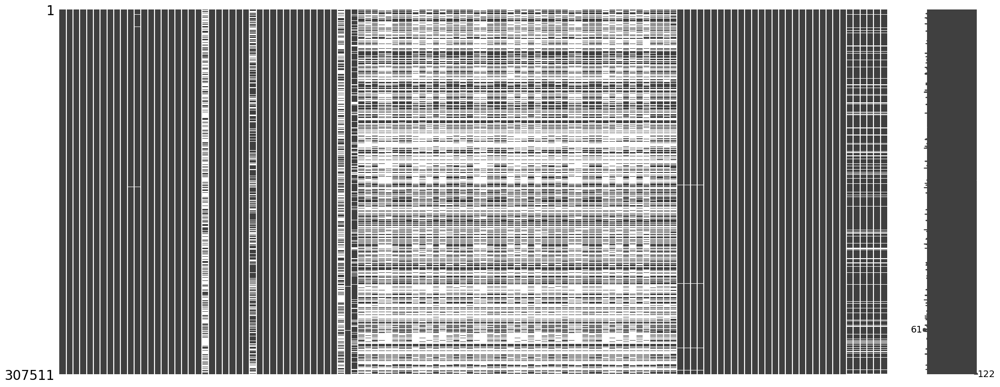

In [7]:
description_dataset(app_train, matrix = True)

In [8]:
def description_dataset(data, matrix):
    '''
    Return the description of a dataset
    
        Parameters: 
            data: dataframe
            matrix(bool): indicates if we plot the msno matrix of data
            
        Returns:
            the 3 first line of the dataframe
            the shape, the types, the number of null values,
            the number of unique values, the number of duplicated values
    '''
    # Configurer pandas pour afficher toutes les lignes sans coupure
    pd.set_option('display.max_rows', None)  # Afficher toutes les lignes
    
    if matrix:
        msno.matrix(data)
        
    display(data.head(3))
    print(f'Taille :-------------------------------------------------------------- {data.shape}')
    print("--" * 50)
    print(f'Types :{data.dtypes.value_counts()}')
    print("--" * 50)
    print(f'Types :{data.dtypes}')
    print("--" * 50)
    print("Valeurs manquantes par colonnes (%): ")
    
    # Conversion de la série en DataFrame pour un affichage complet
    missing_values = ((data.isna().sum() / data.shape[0]) * 100).round(2).sort_values(ascending=False)
    missing_values_df = pd.DataFrame(missing_values, columns=['% de valeurs manquantes'])
    
    # Affichage complet
    display(missing_values_df)
    
    print("--" * 50)
    print("Valeurs différentes par variables : ")
    for col in data:
        if data[col].nunique() < 30:
            print(f'{col :-<70} {data[col].unique()}')
        else:
            print(f'{col :-<70} contient {data[col].nunique()} valeurs différentes')
    print("--" * 50)
    print(f"Nombre de doublons : {data.duplicated().sum()}")
    
    # Réinitialiser les options d'affichage après l'exécution
    pd.reset_option('display.max_rows')


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Taille :-------------------------------------------------------------- (307511, 122)
----------------------------------------------------------------------------------------------------
Types :float64    65
int64      41
object     16
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE              

,% de valeurs manquantes
COMMONAREA_MEDI,69.87
COMMONAREA_AVG,69.87
COMMONAREA_MODE,69.87
NONLIVINGAPARTMENTS_MODE,69.43
NONLIVINGAPARTMENTS_AVG,69.43
NONLIVINGAPARTMENTS_MEDI,69.43
FONDKAPREMONT_MODE,68.39
LIVINGAPARTMENTS_MODE,68.35
LIVINGAPARTMENTS_AVG,68.35
LIVINGAPARTMENTS_MEDI,68.35


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307511 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
NAME_CONTRACT_TYPE---------------------------------------------------- ['Cash loans' 'Revolving loans']
CODE_GENDER----------------------------------------------------------- ['M' 'F' 'XNA']
FLAG_OWN_CAR---------------------------------------------------------- ['N' 'Y']
FLAG_OWN_REALTY------------------------------------------------------- ['Y' 'N']
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différent

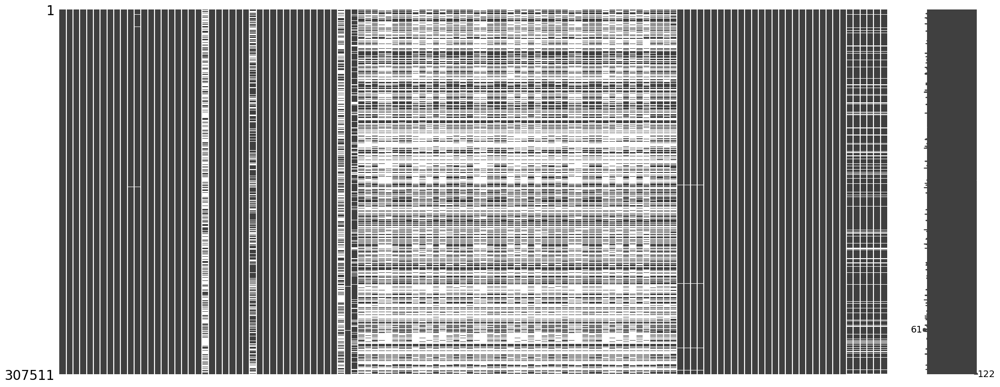

In [9]:
description_dataset(app_train, matrix = True)

In [10]:
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [11]:
# Configurer pandas pour afficher toutes les lignes sans coupure
pd.set_option('display.max_rows', None)  # Afficher toutes les lignes
app_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [12]:
def get_types_variables(df_work, types, type_par_var, graph):
    """ Permet un aperçu du type des variables
    Parameters
    ----------
    @param IN : df_work : dataframe, obligatoire
                types : Si True lance dtypes, obligatoire
                type_par_var : Si True affiche tableau des types de
                               chaque variable, obligatoire
                graph : Si True affiche pieplot de répartition des types
    @param OUT :None.
    """

    if types:
        # 1. Type des variables
        print("-------------------------------------------------------------")
        print("Type de variable pour chacune des variables\n")
        display(df_work.dtypes)

    if type_par_var:
        # 2. Compter les types de variables
        #print("Répartition des types de variable\n")
        values = df_work.dtypes.value_counts()
        nb_tot = values.sum()
        percentage = round((100 * values / nb_tot), 2)
        table = pd.concat([values, percentage], axis=1)
        table.columns = [
            'Nombre par type de variable',
            '% des types de variable']
        display(table[table['Nombre par type de variable'] != 0]
                .sort_values('% des types de variable', ascending=False)
                .style.background_gradient('seismic'))

    if graph:
        # 3. Schéma des types de variable
        # print("\n----------------------------------------------------------")
        #print("Répartition schématique des types de variable \n")
        # Répartition des types de variables
        df_work.dtypes.value_counts().plot.pie(autopct='%1.1f%%')
        plt.ylabel('')
        plt.show()


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


,Nombre par type de variable,% des types de variable
float64,65,53.280000
int64,41,33.610000
object,16,13.110000


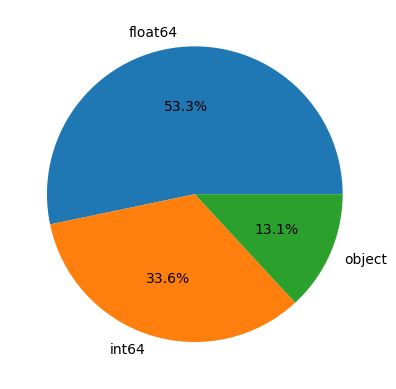

In [13]:
from IPython.display import display
import re
import os
get_types_variables(app_train, True, True, True)

In [14]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

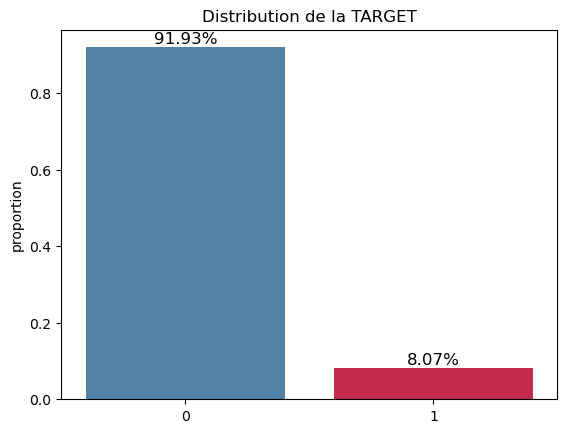

In [15]:
# Données
target_distribution = app_train['TARGET'].value_counts(normalize=True)
percentages = target_distribution * 100

# Créer le graphique
ax = sns.barplot(x=[0, 1], y=target_distribution, palette=['SteelBlue', 'crimson'])
plt.title('Distribution de la TARGET')

# Ajouter les annotations avec les pourcentages
for i, v in enumerate(target_distribution):
    ax.text(i, v + 0.01, f'{percentages[i]:.2f}%', ha='center', fontsize=12)

plt.show()

In [16]:
def bar_plot_stacked(df,colonnes,n_cols,nom,fig=(20,20)):
    ''' Affiche les bar plots pour chaque variable renseignée décomposés en fonction de var2.'''
    fig = plt.figure(figsize=fig)
    n_rows = int(np.ceil(len(colonnes)/n_cols))
    for i, col in enumerate(colonnes,1):
        ax = fig.add_subplot(n_rows,n_cols,i)
        count = pd.DataFrame(df.groupby(col)['TARGET'].value_counts()).reset_index()
        count = count.pivot_table(index=col, columns = 'TARGET', values = 'count')
        #count = pd.crosstab(index=count[col], columns =count[var2], values = 'count')
        count.plot(kind="bar", stacked=True, ax=ax, fontsize=20, rot=90)
        ax.set_title(col, fontsize = 20)
        ax.legend(['rembourse','défaut'],fontsize = 20)
    plt.tight_layout(pad = 2)
    plt.savefig(nom)
    plt.show()

In [17]:
col_cat = list(app_train.select_dtypes(['object']).columns)
col_cat.append('TARGET')
bar_plot_stacked(app_train, col_cat, n_cols=2, nom='bar_plot2.pdf', fig=(40,140))

# Toutes les tables

In [18]:
@contextmanager
def timer(title):
    '''Fonction calculant le temps d'éxécution d'autres fonctions.
    Keyword arguments:
    title -- titre de la fonction exécutée.
    '''
    t0 = time.time()
    yield
    print("{} - réalisé en {:.0f}s".format(title, time.time() - t0))

def one_hot_encoder(df, nan_as_category = True):
    '''Encodage des variables catégorielles.
    Keyword arguments:
    df -- dataframe
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    df -- dataframe encodé
    new_columns -- nouvelles colonnes créées par l'encodage.
    '''
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category, dtype=int)
    new_columns = [c for c in df.columns if c not in original_columns]
    
    return df, new_columns

def application_train_test(num_rows = None, nan_as_category = False):
    '''Preprocessing de application_train.csv et application_test.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default False)
    Returns:
    df -- dataframe mergé et preprocessing réalisé.
    '''
    # Read data and merge
    df = pd.read_csv("application_train.csv", nrows= num_rows)
    test_df = pd.read_csv("application_test.csv", nrows= num_rows)
    print("Taille des données d'entrainement: {}, Taille des données de test: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df], ignore_index=True)
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']

    del test_df
    gc.collect()
    
    return df

def bureau_and_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de bureau.csv et bureau_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    bureau_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    
    return bureau_agg

def previous_applications(num_rows = None, nan_as_category = True):
    '''Preprocessing de previous_applications.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    prev_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    
    return prev_agg

def pos_cash(num_rows = None, nan_as_category = True):
    '''Preprocessing de POS_CASH_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    pos_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    
    return pos_agg
    
def installments_payments(num_rows = None, nan_as_category = True):
    '''Preprocessing de installments_payments.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    ins_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    
    return ins_agg

def credit_card_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de credit_card_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    cc_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    
    return cc_agg

In [19]:
num_rows = None
df = application_train_test(num_rows)

with timer("Process bureau and bureau_balance"):
    bureau = bureau_and_balance(num_rows)
    print("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau
    gc.collect()
with timer("Process previous_applications"):
    prev = previous_applications(num_rows)
    print("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev
    gc.collect()
with timer("Process POS-CASH balance"):
    pos = pos_cash(num_rows)
    print("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos
    gc.collect()
with timer("Process installments payments"):
    ins = installments_payments(num_rows)
    print("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins
    gc.collect()
with timer("Process credit card balance"):
    cc = credit_card_balance(num_rows)
    print("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc
    gc.collect()

Taille des données d'entrainement: 307511, Taille des données de test: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - réalisé en 21s
Previous applications df shape: (338857, 249)
Process previous_applications - réalisé en 22s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - réalisé en 12s
Installments payments df shape: (339587, 26)
Process installments payments - réalisé en 23s
Credit card balance df shape: (103558, 141)
Process credit card balance - réalisé en 15s


In [20]:
@contextmanager
def timer(title):
    '''Fonction calculant le temps d'éxécution d'autres fonctions.
    Keyword arguments:
    title -- titre de la fonction exécutée.
    '''
    t0 = time.time()
    yield
    print("{} - réalisé en {:.0f}s".format(title, time.time() - t0))

def one_hot_encoder(df, nan_as_category = True):
    '''Encodage des variables catégorielles.
    Keyword arguments:
    df -- dataframe
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    df -- dataframe encodé
    new_columns -- nouvelles colonnes créées par l'encodage.
    '''
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category, dtype=int)
    new_columns = [c for c in df.columns if c not in original_columns]
    
    return df, new_columns

def application_train_test(num_rows = None, nan_as_category = False):
    '''Preprocessing de application_train.csv et application_test.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default False)
    Returns:
    df -- dataframe mergé et preprocessing réalisé.
    '''
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Taille des données d'entrainement: {}, Taille des données de test: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df], ignore_index=True)
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']

    del test_df
    gc.collect()
    
    return df

def bureau_and_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de bureau.csv et bureau_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    bureau_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    
    return bureau_agg

def previous_applications(num_rows = None, nan_as_category = True):
    '''Preprocessing de previous_applications.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    prev_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    
    return prev_agg

def pos_cash(num_rows = None, nan_as_category = True):
    '''Preprocessing de POS_CASH_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    pos_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    
    return pos_agg
    
def installments_payments(num_rows = None, nan_as_category = True):
    '''Preprocessing de installments_payments.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    ins_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    
    return ins_agg

def credit_card_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de credit_card_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    cc_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    
    return cc_agg

In [21]:
import chardet
with open('HomeCredit_columns_description.csv', 'rb') as f:
    result = chardet.detect(f.read())
    print(result['encoding'])
    app_descriptiocol = pd.read_csv('HomeCredit_columns_description.csv', encoding=result['encoding'])

Windows-1252


In [22]:
pd.set_option('display.max_columns', None) 
    # Afficher toutes les colonnes 
pd.set_option('display.max_rows', None) 
    # Afficher toutes les lignes
pd.set_option('display.max_colwidth', None) # Ne pas tronquer le contenu des colonnes 
pd.set_option('display.expand_frame_repr', False) # Ne pas tronquer les colonnes en multiples lignes

app_descriptiocol

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [23]:
train_df = df[df['TARGET'].notnull()]
test_df = df[df['TARGET'].isnull()]
print("Taille des données d'entrainement: {}".format(len(train_df)))
print("Taille des données de test: {}".format(len(test_df)))

Taille des données d'entrainement: 307507
Taille des données de test: 48744


In [24]:
train_df.to_csv('train_df.csv', index = False)
test_df.to_csv('test_df.csv', index = False)

In [25]:
print("Taille du jeu d'entrainement: {}".format(train_df.shape))
print("Taille du jeu de test: {}".format(test_df.shape))

Taille du jeu d'entrainement: (307507, 797)
Taille du jeu de test: (48744, 797)


# Doublons

In [26]:
# les doublons
train_df.duplicated().sum()


0

In [27]:
# les doublons
test_df.duplicated().sum()

0

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_

Taille :-------------------------------------------------------------- (307507, 797)
----------------------------------------------------------------------------------------------------
Types :float64    622
int32      133
int64       42
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                   

,% de valeurs manquantes
REFUSED_AMT_DOWN_PAYMENT_MAX,85.31
REFUSED_AMT_DOWN_PAYMENT_MEAN,85.31
REFUSED_AMT_DOWN_PAYMENT_MIN,85.31
REFUSED_RATE_DOWN_PAYMENT_MEAN,85.31
REFUSED_RATE_DOWN_PAYMENT_MAX,85.31
REFUSED_RATE_DOWN_PAYMENT_MIN,85.31
REFUSED_APP_CREDIT_PERC_VAR,84.01
CC_AMT_PAYMENT_CURRENT_VAR,80.29
CC_CNT_DRAWINGS_POS_CURRENT_VAR,80.26
CC_AMT_DRAWINGS_OTHER_CURRENT_VAR,80.26


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307507 valeurs différentes
TARGET---------------------------------------------------------------- [1. 0.]
CODE_GENDER----------------------------------------------------------- [0 1]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 13672 valeurs différentes
AMT_GOODS_P

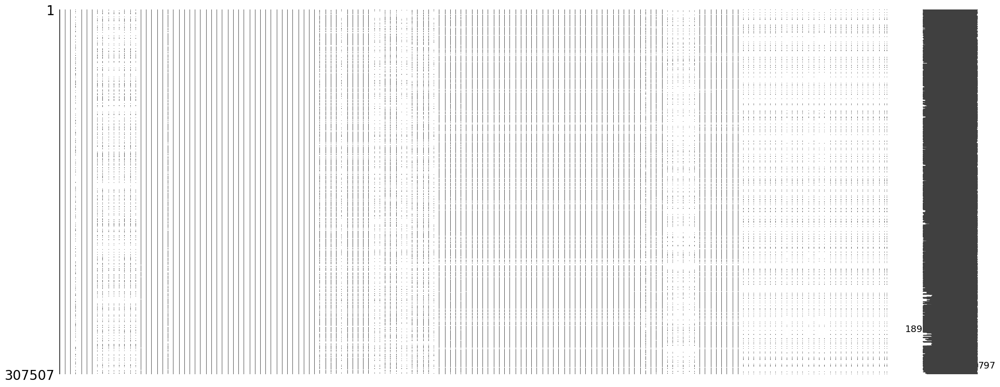

In [28]:
description_dataset(train_df, matrix = True)

In [29]:
# supprimer les colonnes dont les valeurs manquantes >50%
lim = 0.5  # Seuil de 50%
missing_percentage = train_df.isnull().mean()  # Calcul du pourcentage de valeurs manquantes pour chaque colonne
train_df_suplim = train_df.loc[:, missing_percentage > lim]  # Sélectionner les colonnes avec plus de 50% de valeurs manquantes


In [30]:
list(train_df_suplim.columns)

['OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'BURO_AMT_ANNUITY_MAX',
 'BURO_AMT_ANNUITY_MEAN',
 'BURO_MONTHS_BALANCE_MIN_MIN',
 'BURO_MONTHS_BALANCE_MAX_MAX',
 'BURO_MONTHS_BALANCE_SIZE_MEAN',
 'BURO_STATUS_0_MEAN_MEAN',
 'BURO_STATUS_1_MEAN_MEAN',
 'BURO

In [31]:
# supprimer les colonnes dont les valeurs manquantes >50%
lim = 0.5  # Seuil de 50%
missing_percentage = train_df.isnull().mean()  # Calcul du pourcentage de valeurs manquantes pour chaque colonne
train_df = train_df.loc[:, missing_percentage < lim]  # Sélectionner les colonnes avec moins de 50% de valeurs manquantes

# Afficher le DataFrame après suppression
train_df.head()


,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

In [32]:
train_df.shape

(307507, 561)

In [33]:
test_df = test_df[train_df.columns]
print(test_df.shape)

(48744, 561)


In [34]:
train_df.describe()


,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

In [35]:
test_df.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

In [36]:
# des valeurs négatives dans DAYS_Birth
train_df['DAYS_BIRTH'] = train_df['DAYS_BIRTH']/-365
test_df['DAYS_BIRTH'] = test_df['DAYS_BIRTH']/-365


In [37]:
# change les valeurs négatives en valeurs positives.
train_df[train_df.columns[(train_df < 0).any()].tolist()] = train_df[
    train_df.columns[(train_df < 0).any()].tolist()]*-1

test_df[test_df.columns[(test_df < 0).any()].tolist()] = test_df[
    test_df.columns[(test_df < 0).any()].tolist()]*-1

In [38]:
train_df['DAYS_ID_PUBLISH'] = train_df['DAYS_ID_PUBLISH'].astype(float)
test_df['DAYS_ID_PUBLISH'] = test_df['DAYS_ID_PUBLISH'].astype(float)

In [39]:
train_df['DAYS_EMPLOYED'].describe()

count    252133.000000
mean       2384.142254
std        2338.327666
min          -0.000000
25%         767.000000
50%        1648.000000
75%        3175.000000
max       17912.000000
Name: DAYS_EMPLOYED, dtype: float64

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

Taille :-------------------------------------------------------------- (307507, 561)
----------------------------------------------------------------------------------------------------
Types :float64    388
int32      133
int64       40
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                   

,% de valeurs manquantes
FLOORSMAX_MEDI,49.76
FLOORSMAX_MODE,49.76
FLOORSMAX_AVG,49.76
YEARS_BEGINEXPLUATATION_AVG,48.78
YEARS_BEGINEXPLUATATION_MEDI,48.78
YEARS_BEGINEXPLUATATION_MODE,48.78
TOTALAREA_MODE,48.27
CLOSED_DAYS_CREDIT_VAR,42.55
BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,40.20
ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,38.63


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307507 valeurs différentes
TARGET---------------------------------------------------------------- [1. 0.]
CODE_GENDER----------------------------------------------------------- [0 1]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 13672 valeurs différentes
AMT_GOODS_P

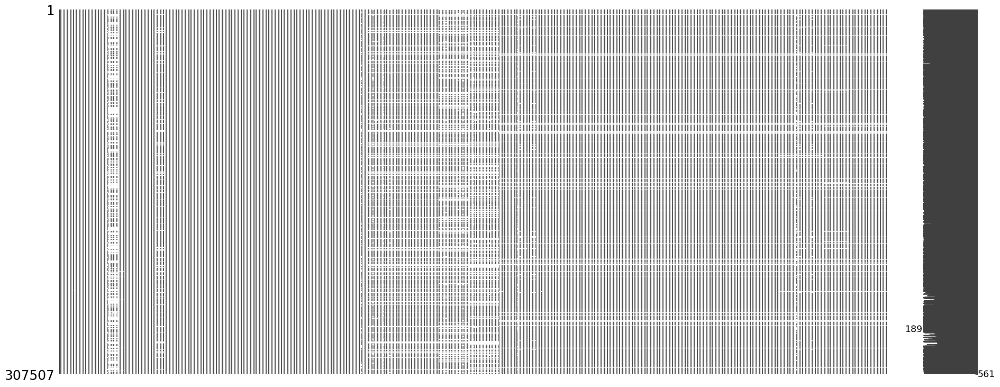

In [40]:
description_dataset(train_df, matrix = True)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

Taille :-------------------------------------------------------------- (48744, 561)
----------------------------------------------------------------------------------------------------
Types :float64    388
int32      133
int64       40
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                    

,% de valeurs manquantes
TARGET,100.00
FLOORSMAX_AVG,47.84
FLOORSMAX_MODE,47.84
FLOORSMAX_MEDI,47.84
YEARS_BEGINEXPLUATATION_AVG,46.89
YEARS_BEGINEXPLUATATION_MODE,46.89
YEARS_BEGINEXPLUATATION_MEDI,46.89
TOTALAREA_MODE,46.41
BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,40.33
ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,39.73


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 48744 valeurs différentes
TARGET---------------------------------------------------------------- [nan]
CODE_GENDER----------------------------------------------------------- [1 0]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]
AMT_INCOME_TOTAL------------------------------------------------------ contient 606 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 2937 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 7491 valeurs différentes
AMT_GOODS_PRICE-------------

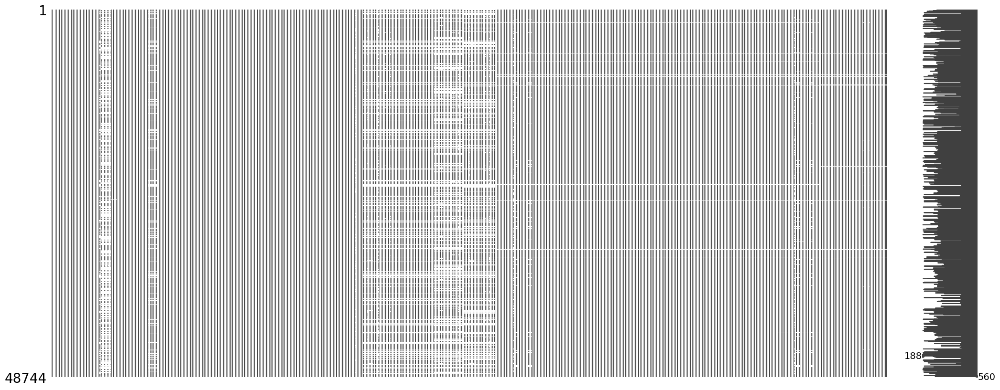

In [41]:
description_dataset(test_df, matrix = True)

In [42]:
train_df = train_df.replace(np.inf, np.nan)
test_df = test_df.replace(np.inf, np.nan)

In [43]:
train_df['TARGET']

0         1.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
307506    0.0
307507    0.0
307508    0.0
307509    1.0
307510    0.0
Name: TARGET, Length: 307507, dtype: float64

# les valeurs manquentes :
 Nous allons appliquer différentes méthodes d'imputation simples. Tout d'abord, pour les colonnes qui proviennent de l'aggrégation, nous allons remplacer les valeurs manquantes par 0.0. Pour les variables quantitatives restantes, nous remplacerons par la médiane. Enfin, pour les variables qualitatives/catégorielles, nous remplacerons par le mode (soit la valeur la plus fréquente).

In [44]:
quanti_col = train_df.select_dtypes(['float64']).columns
quali_col = train_df.select_dtypes(['int64']).columns
quanti_col = quanti_col.drop('TARGET')

In [45]:
# imputation des variables quantitatives issues de l'aggrégation
col_agg = train_df.columns[train_df.columns.str.contains('_MIN|_MAX|_MEAN|_VAR|_SUM|_SIZE')]

train_df[col_agg] = train_df[col_agg].fillna(0.0)
test_df[col_agg] = test_df[col_agg].fillna(0.0)

In [46]:
# imputation des variables quantitatives restantes
quanti_col_rest = [col for col in quanti_col if col not in col_agg]
for col in quanti_col_rest:
    median = train_df[col].median()
    train_df[col] = train_df[col].fillna(median)
    test_df[col] = test_df[col].fillna(median)

In [47]:
# imputation des variables qualitatives
for col in quali_col:
    mode = train_df[col].mode()[0]
    train_df[col] = train_df[col].fillna(mode)
    test_df[col] = test_df[col].fillna(mode)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

Taille :-------------------------------------------------------------- (307507, 561)
----------------------------------------------------------------------------------------------------
Types :float64    388
int32      133
int64       40
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                   

,% de valeurs manquantes
SK_ID_CURR,0.0
PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Canceled_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Refused_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_nan_MEAN,0.0
PREV_NAME_PAYMENT_TYPE_Cash through the bank_MEAN,0.0
PREV_NAME_PAYMENT_TYPE_Cashless from the account of the employer_MEAN,0.0
PREV_NAME_PAYMENT_TYPE_XNA_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307507 valeurs différentes
TARGET---------------------------------------------------------------- [1. 0.]
CODE_GENDER----------------------------------------------------------- [0 1]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 13672 valeurs différentes
AMT_GOODS_P

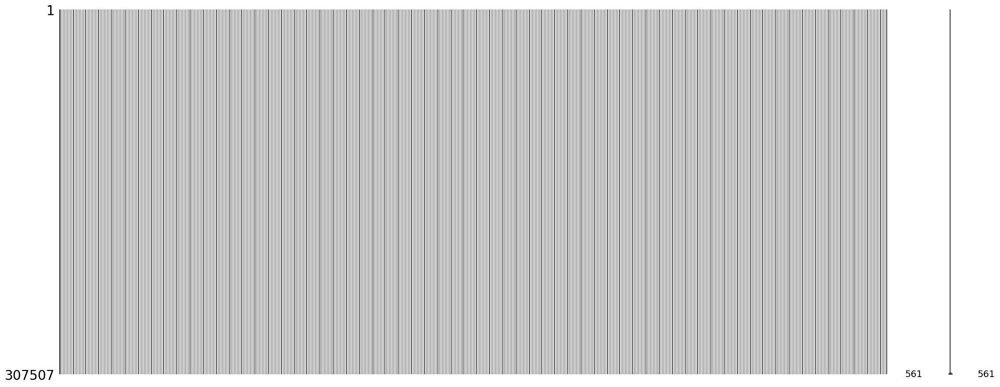

In [48]:
description_dataset(train_df, matrix = True)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7

Taille :-------------------------------------------------------------- (48744, 561)
----------------------------------------------------------------------------------------------------
Types :float64    388
int32      133
int64       40
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                    

,% de valeurs manquantes
TARGET,100.0
PREV_NAME_PAYMENT_TYPE_Cashless from the account of the employer_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Approved_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Canceled_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Refused_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN,0.0
PREV_NAME_CONTRACT_STATUS_nan_MEAN,0.0
PREV_NAME_PAYMENT_TYPE_Cash through the bank_MEAN,0.0
PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_XNA_MEAN,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 48744 valeurs différentes
TARGET---------------------------------------------------------------- [nan]
CODE_GENDER----------------------------------------------------------- [1 0]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]
AMT_INCOME_TOTAL------------------------------------------------------ contient 606 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 2937 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 7491 valeurs différentes
AMT_GOODS_PRICE-------------

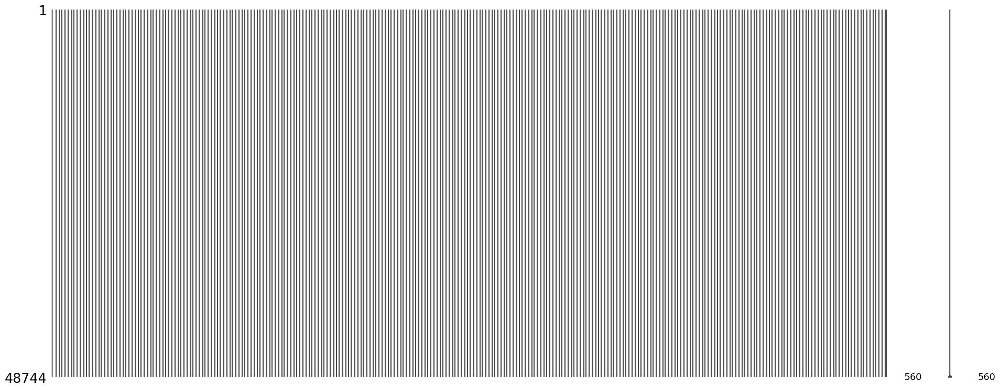

In [49]:
description_dataset(test_df, matrix = True)

In [50]:
train_df['TARGET'] = train_df['TARGET'].astype(np.int64)

In [51]:
train_df.dtypes

SK_ID_CURR                          int64
TARGET                              int64
CODE_GENDER                         int64
FLAG_OWN_CAR                        int64
FLAG_OWN_REALTY                     int64
                                   ...   
INSTAL_AMT_PAYMENT_SUM            float64
INSTAL_DAYS_ENTRY_PAYMENT_MAX     float64
INSTAL_DAYS_ENTRY_PAYMENT_MEAN    float64
INSTAL_DAYS_ENTRY_PAYMENT_SUM     float64
INSTAL_COUNT                      float64
Length: 561, dtype: object

In [52]:
def distribution(df,colonnes,n_cols,fig=(20,20)):
    ''' Affiche les histogrammes pour chaque variable renseignée.'''
    n_rows = int(len(colonnes)/n_cols)+1
    fig = plt.figure(figsize=fig)
    for i, col in enumerate(colonnes,1):
        ax = fig.add_subplot(n_rows,n_cols,i)
        sns.histplot(data=df, x=col, bins=30, kde=True, ax=ax)

    plt.tight_layout(pad = 2)
   # plt.savefig(nom)
    plt.show()

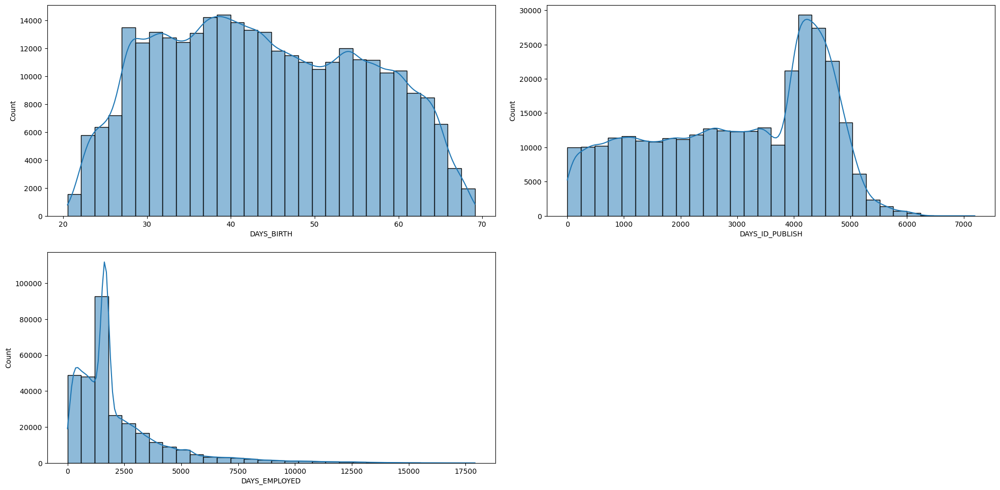

In [53]:
distribution(train_df,['DAYS_BIRTH','DAYS_ID_PUBLISH','DAYS_EMPLOYED'],
                n_cols=2,  fig=(20,10))

In [54]:
quanti_col = train_df.select_dtypes(['float64']).columns
quali_col = train_df.select_dtypes(['int64']).columns
#quali_col = quali_col.drop('TARGET')

In [55]:
quali_col

Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21'],
      dtype='object')

In [56]:
# imputation des variables quantitatives restantes
quanti_col_rest = [col for col in quanti_col if col not in col_agg]
for col in quanti_col_rest:
    median = train_df[col].median()
    train_df[col] = train_df[col].fillna(median)
    test_df[col] = test_df[col].fillna(median)

 les densités de certaines variables via un graphique KDE. Un graphique d'estimation de la densité du noyau (KDE) est une méthode de visualisation de la distribution des observations dans un ensemble de données, analogue à un histogramme. KDE représente les données à l'aide d'une courbe de densité de probabilité continue dans une ou plusieurs dimensions. Par rapport à un histogramme, KDE peut produire un tracé moins encombré et plus interprétable, en particulier lors du dessin de plusieurs distributions.

Text(0.5, 1.0, 'Distribution of Ages')

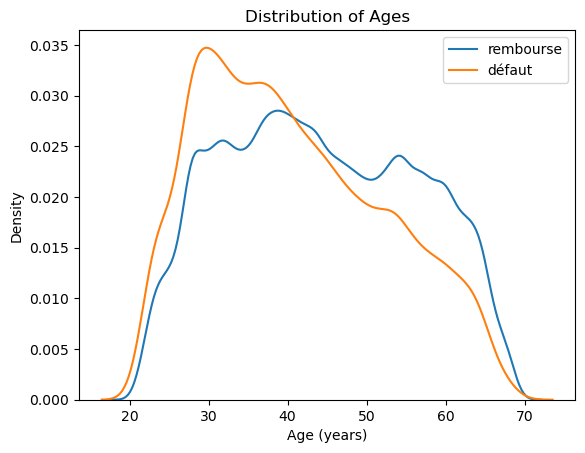

In [57]:
sns.kdeplot(train_df.loc[train_df['TARGET'] == 0, 'DAYS_BIRTH'], label = 'rembourse')
sns.kdeplot(train_df.loc[train_df['TARGET'] == 1, 'DAYS_BIRTH'], label = 'défaut')

plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.legend()
plt.title('Distribution of Ages')

On peut constater ici que la courbe représentant les clients en défaut tend vers des âges plus jeunes, par rapport à la courbe représentant les clients qui remboursent. Cela pourrait signifier que les clients en défaut ont plus tendance à être jeunes.

In [58]:
col_quant = list(train_df.select_dtypes(['float64']).columns)
col_quant.append('TARGET')

In [59]:
df_corr1 = train_df[col_quant].corr()


In [60]:
df_corr1

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_EMPLOYED_PERC,INCOME_CREDIT_PERC,INCOME_PER_PERSON,ANNUITY_INCOME_PERC,PAYMENT_RATE,BURO_DAYS_CREDIT_MIN,BURO_DAYS_CREDIT_MAX,BURO_DAYS_CREDIT_MEAN,BURO_DAYS_CREDIT_VAR,BURO_DAYS_CREDIT_ENDDATE_MIN,BURO_DAYS_CREDIT_ENDDATE_MAX,BURO_DAYS_CREDIT_ENDDATE_MEAN,BURO_DAYS_CREDIT_UPDATE_MEAN,BURO_CREDIT_DAY_OVERDUE_MAX,BURO_CREDIT_DAY_OVERDUE_MEAN,BURO_AMT_CREDIT_MAX_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_MAX,BURO_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_SUM,BURO_AMT_CREDIT_SUM_DEBT_MAX,BURO_AMT_CREDIT_SUM_DEBT_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_AMT_CREDIT_SUM_OVERDUE_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_MEAN,BURO_AMT_CREDIT_SUM_LIMIT_SUM,BURO_CNT_CREDIT_PROLONG_SUM,BURO_MONTHS_BALANCE_SIZE_SUM,BURO_CREDIT_ACTIVE_Active_MEAN,BURO_CREDIT_ACTIVE_Bad debt_MEAN,BURO_CREDIT_ACTIVE_Closed_MEAN,BURO_CREDIT_ACTIVE_Sold_MEAN,BURO_CREDIT_ACTIVE_nan_MEAN,BURO_CREDIT_CURRENCY_currency 1_MEAN,BURO_CREDIT_CURRENCY_currency 2_MEAN,BURO_CREDIT_CURRENCY_currency 3_MEAN,BURO_CREDIT_CURRENCY_currency 4_MEAN,BURO_CREDIT_CURRENCY_nan_MEAN,BURO_CREDIT_TYPE_Another type of loan_MEAN,BURO_CREDIT_TYPE_Car loan_MEAN,BURO_CREDIT_TYPE_Cash loan (non-earmarked)_MEAN,BURO_CREDIT_TYPE_Consumer credit_MEAN,BURO_CREDIT_TYPE_Credit card_MEAN,BURO_CREDIT_TYPE_Interbank credit_MEAN,BURO_CREDIT_TYPE_Loan for business development_MEAN,BURO_CREDIT_TYPE_Loan for purchase of shares (margin lending)_MEAN,BURO_CREDIT_TYPE_Loan for the purchase of equipment_MEAN,BURO_CREDIT_TYPE_Loan for working capital replenishment_MEAN,BURO_CREDIT_TYPE_Microloan_MEAN,BURO_CREDIT_TYPE_Mobile operator loan_MEAN,BURO_CREDIT_TYPE_Mortgage_MEAN,BURO_CREDIT_TYPE_Real estate loan_MEAN,BURO_CREDIT_TYPE_Unknown type of loan_MEAN,BURO_CREDIT_TYPE_nan_MEAN,ACTIVE_DAYS_CREDIT_MIN,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_MEAN,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,ACTIVE_DAYS_CREDIT_ENDDATE_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MEAN,ACTIVE_DAYS_CREDIT_UPDATE_MEAN,ACTIVE_CREDIT_DAY_OVERDUE_MAX,ACTIVE_CREDIT_DAY_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,ACTIVE_AMT_CREDIT_SUM_SUM,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM,ACTIVE_CNT_CREDIT_PROLONG_SUM,ACTIVE_MONTHS_BALANCE_SIZE_SUM,CLOSED_DAYS_CREDIT_MIN,CLOSED_DAYS_CREDIT_MAX,CLOSED_DAYS_CREDIT_MEAN,CLOSED_DAYS_CREDIT_VAR,CLOSED_DAYS_CREDIT_ENDDATE_MIN,CLOSED_DAYS_CREDIT_ENDDATE_MAX,CLOSED_DAYS_CREDIT_ENDDATE_MEAN,CLOSED_DAYS_CREDIT_UPDATE_MEAN,CLOSED_CREDIT_DAY_OVERDUE_MAX,CLOSED_CREDIT_DAY_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_MAX,CLOSED_AMT_CREDIT_SUM_MEAN,CLOSED_AMT_CREDIT_SUM_SUM,CLOSED_AMT_CREDIT_SUM_DEBT_MAX,CLOSED_AMT_CREDIT_SUM_DEBT_MEAN,CLOSED_AMT_CREDIT_SUM_DEBT_SUM,CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN,CLOSED_AMT_CREDIT_SUM_LIMIT_SUM,CLOSED_CNT_CREDIT_PROLONG_SUM,CLOSED_MONTHS_BALANCE_SIZE_SUM,PREV_AMT_ANNUITY_MIN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_MEAN,PREV_AMT_APPLICATION_MIN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_MEAN,PREV_AMT_CREDIT_MIN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_APP_CREDIT_PERC_MAX,PREV_APP_CREDIT_PERC_MEAN,PREV_APP_CREDIT_PERC_VAR,PREV_AMT_DOWN_PAYMENT_MIN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_GOODS_PRICE_MIN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_MEAN,PREV_HOUR_APPR_PROCES

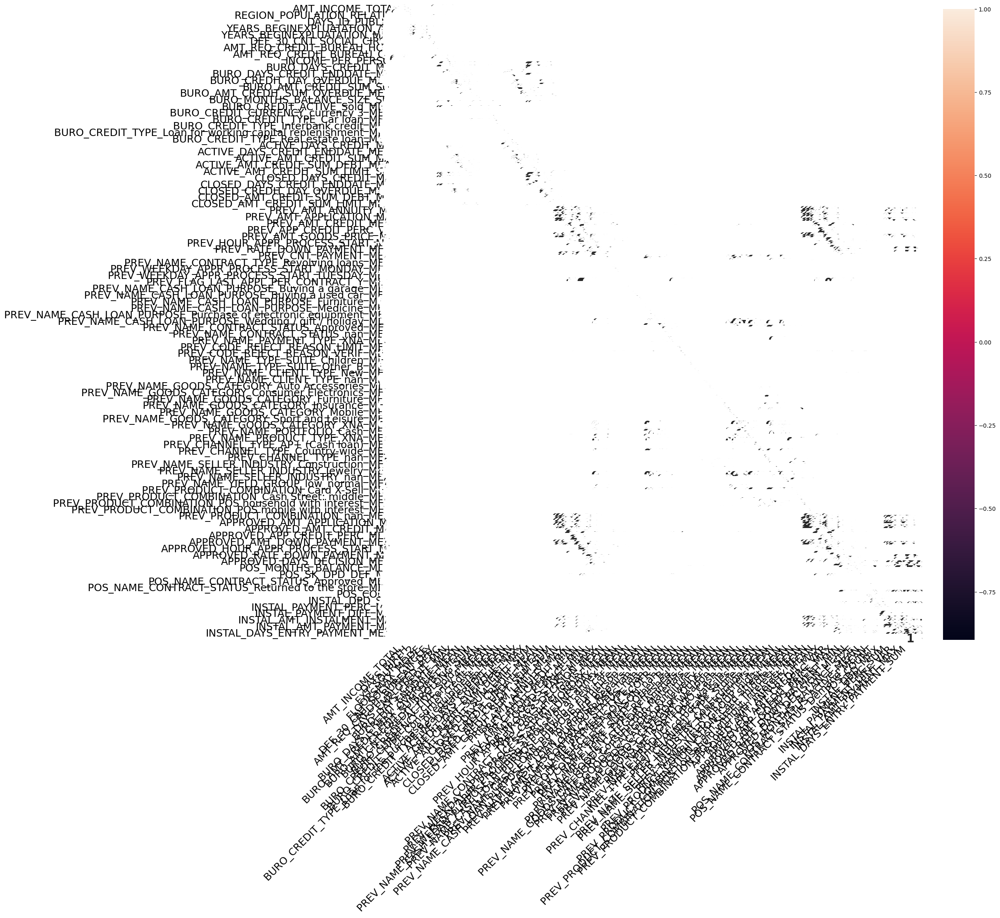

In [61]:
#data_corr=data_2016SSSOBJ.dropna().corr()
plt.figure(figsize=(20,20))
sns.heatmap(df_corr1,annot=True,annot_kws={"size": 20,"fontweight":"bold"})
#plt.xlabel( "X-Axis Label",fontsize=24)
#plt.ylabel( fontsize=24)
plt.gca().set_xticklabels(plt.gca().get_xticklabels(), fontsize=18)
plt.gca().set_yticklabels(plt.gca().get_yticklabels(), fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=18)
plt.show()

# correlation <= 0.85 à revoir

In [62]:
#recherc les variable dont le corr>0.85

# garder la feature la plus remplie

In [63]:
# Calculer la matrice de corrélation
df_corr1 = train_df[col_quant].corr().abs()  # abs() pour avoir des valeurs absolues de corrélation

# Filtrer la matrice pour conserver les corrélations > 0.85 et #de 1
high_corr = df_corr1[df_corr1 > 0.85]

# Supprimer la diagonale (corrélation des colonnes avec elles-mêmes)
filtered_corr = high_corr.where(np.triu(np.ones(high_corr.shape), k=1).astype(bool))

# Afficher les colonnes avec une corrélation > 0.85
corr_pairs = filtered_corr.stack().reset_index()
corr_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']

# Afficher le résultat
print(corr_pairs)

                         Feature 1                     Feature 2  Correlation
0                 AMT_INCOME_TOTAL             INCOME_PER_PERSON     0.861812
1                       AMT_CREDIT               AMT_GOODS_PRICE     0.986736
2                    DAYS_EMPLOYED            DAYS_EMPLOYED_PERC     0.955330
3      YEARS_BEGINEXPLUATATION_AVG  YEARS_BEGINEXPLUATATION_MODE     0.971950
4      YEARS_BEGINEXPLUATATION_AVG  YEARS_BEGINEXPLUATATION_MEDI     0.993838
..                             ...                           ...          ...
126       INSTAL_PAYMENT_PERC_MEAN       INSTAL_PAYMENT_PERC_VAR     0.857696
127      INSTAL_AMT_INSTALMENT_MAX        INSTAL_AMT_PAYMENT_MAX     0.999258
128     INSTAL_AMT_INSTALMENT_MEAN       INSTAL_AMT_PAYMENT_MEAN     0.979679
129      INSTAL_AMT_INSTALMENT_SUM        INSTAL_AMT_PAYMENT_SUM     0.982256
130  INSTAL_DAYS_ENTRY_PAYMENT_SUM                  INSTAL_COUNT     0.920306

[131 rows x 3 columns]


,Feature 1,Feature 2,Correlation
0,AMT_INCOME_TOTAL,INCOME_PER_PERSON,0.861812
1,AMT_CREDIT,AMT_GOODS_PRICE,0.986736
2,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,0.955330


Taille :-------------------------------------------------------------- (131, 3)
----------------------------------------------------------------------------------------------------
Types :object     2
float64    1
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :Feature 1       object
Feature 2       object
Correlation    float64
dtype: object
----------------------------------------------------------------------------------------------------
Valeurs manquantes par colonnes (%): 


,% de valeurs manquantes
Feature 1,0.0
Feature 2,0.0
Correlation,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
Feature 1------------------------------------------------------------- contient 93 valeurs différentes
Feature 2------------------------------------------------------------- contient 90 valeurs différentes
Correlation----------------------------------------------------------- contient 126 valeurs différentes
----------------------------------------------------------------------------------------------------
Nombre de doublons : 0


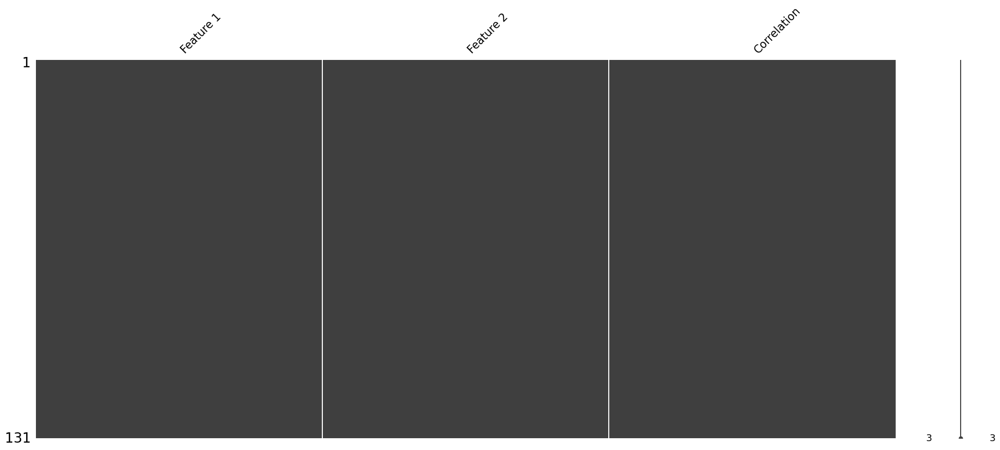

In [64]:
description_dataset(corr_pairs, matrix=True)

In [65]:
for value in corr_pairs['Correlation']:
    print(value)

0.861811878969988
0.9867364894141368
0.9553300017391702
0.9719502519247536
0.993837763277884
0.9866100656684035
0.9972598842158814
0.9636103660675668
0.9890004823434707
0.9984911989422275
0.8605178428532824
0.8728165615819306
0.9505693035214796
0.8766691388223847
0.8742866322329729
0.9012503464092082
0.8873968665407823
0.8893586111672378
0.9553848901755009
0.9934871579360446
0.8796662255446479
0.949850084375981
0.9496775507829511
0.9932319179349506
0.856599737164179
0.9312300466881864
0.9758431195668792
0.9018055345954444
0.8557693804684903
0.8508483535156128
0.8838303269411535
0.9427001937078165
0.8854005875780735
0.9560173821375533
0.9256390014145834
0.875053663221666
0.979565946874008
0.9440886409360211
0.8603257126455162
0.9182162090580392
0.9388639815783176
0.9607234838533946
0.9861506812865904
0.9999652704756319
0.8677530197535277
0.9771055495901502
0.9288895569775774
0.9861767516238505
0.8528380442106541
0.9235160130585389
0.9440672108524814
0.9467251208572521
0.9588967047759669

In [66]:
var_corl=corr_pairs[corr_pairs['Correlation']==1]

In [67]:
var_corl

,Feature 1,Feature 2,Correlation
86,PREV_NAME_CONTRACT_TYPE_XNA_MEAN,PREV_PRODUCT_COMBINATION_nan_MEAN,1.0
90,PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN,PREV_CODE_REJECT_REASON_CLIENT_MEAN,1.0
103,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_GOODS_PRICE_MAX,1.0


In [68]:
# Supprimer Features2 de train_df et test_test:
# Extraire les noms des colonnes à partir de 'Feature 2'
columns_to_drop = corr_pairs['Feature 2'].unique()

# Supprimer ces colonnes de train_df
train_df = train_df.drop(columns=columns_to_drop, axis=1)


In [69]:
columns_to_drop

array(['INCOME_PER_PERSON', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED_PERC',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'BURO_DAYS_CREDIT_MEAN',
       'CLOSED_DAYS_CREDIT_MIN', 'CLOSED_DAYS_CREDIT_MEAN',
       'ACTIVE_DAYS_CREDIT_ENDDATE_MAX', 'CLOSED_DAYS_CREDIT_UPDATE_MEAN',
       'ACTIVE_CREDIT_DAY_OVERDUE_MAX', 'BURO_AMT_CREDIT_SUM_DEBT_SUM',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_MAX',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_SUM',
       'ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM',
       'CLOSED_MONTHS_BALANCE_SIZE_SUM', 'ACTIVE_DAYS_CREDIT_MEAN',
       'ACTIVE_DAYS_CREDIT_ENDDATE_MEAN',
       'ACTIVE_CREDIT_DAY_OVERDUE_MEAN', 'ACTIVE_AMT_CREDIT_SUM_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_SUM', 'CLOSED_AMT_CREDIT_SUM_MEAN',
       'CLOSED_AMT_CREDIT_SUM_DEBT_SUM', 'APPROVED_AMT_ANNUITY_MIN

In [70]:
len(columns_to_drop)

90

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal 

Taille :-------------------------------------------------------------- (307507, 471)
----------------------------------------------------------------------------------------------------
Types :float64    297
int32      133
int64       41
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                     int64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                   

,% de valeurs manquantes
SK_ID_CURR,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Buying a home_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Other_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Medicine_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Journey_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Hobby_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Furniture_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Everyday expenses_MEAN,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307507 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
CODE_GENDER----------------------------------------------------------- [0 1]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 13672 valeurs différentes
REGION_POPULA

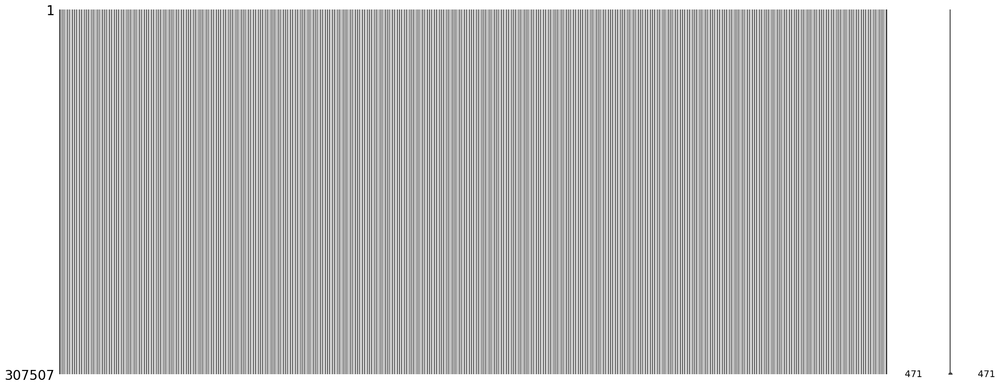

In [71]:
description_dataset(train_df, matrix=True)

In [72]:
train_df.columns

Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE',
       ...
       'INSTAL_PAYMENT_PERC_MEAN', 'INSTAL_PAYMENT_DIFF_MAX',
       'INSTAL_PAYMENT_DIFF_MEAN', 'INSTAL_PAYMENT_DIFF_SUM',
       'INSTAL_PAYMENT_DIFF_VAR', 'INSTAL_AMT_INSTALMENT_MAX',
       'INSTAL_AMT_INSTALMENT_MEAN', 'INSTAL_AMT_INSTALMENT_SUM',
       'INSTAL_AMT_PAYMENT_MIN', 'INSTAL_DAYS_ENTRY_PAYMENT_SUM'],
      dtype='object', length=471)

In [73]:
train_df.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal 

In [74]:
col_drop=['INCOME_PER_PERSON', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED_PERC',
       'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'BURO_DAYS_CREDIT_MEAN',
       'CLOSED_DAYS_CREDIT_MIN', 'CLOSED_DAYS_CREDIT_MEAN',
       'ACTIVE_DAYS_CREDIT_ENDDATE_MAX', 'CLOSED_DAYS_CREDIT_UPDATE_MEAN',
       'ACTIVE_CREDIT_DAY_OVERDUE_MAX', 'BURO_AMT_CREDIT_SUM_DEBT_SUM',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_MAX',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_DEBT_SUM',
       'ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_LIMIT_SUM',
       'CLOSED_MONTHS_BALANCE_SIZE_SUM', 'ACTIVE_DAYS_CREDIT_MEAN',
       'ACTIVE_DAYS_CREDIT_ENDDATE_MEAN',
       'ACTIVE_CREDIT_DAY_OVERDUE_MEAN', 'ACTIVE_AMT_CREDIT_SUM_MEAN',
       'ACTIVE_AMT_CREDIT_SUM_SUM', 'CLOSED_AMT_CREDIT_SUM_MEAN',
       'CLOSED_AMT_CREDIT_SUM_DEBT_SUM', 'APPROVED_AMT_ANNUITY_MIN',
       'PREV_AMT_ANNUITY_MEAN', 'APPROVED_AMT_ANNUITY_MAX',
       'APPROVED_AMT_ANNUITY_MEAN', 'PREV_AMT_CREDIT_MIN',
       'PREV_AMT_CREDIT_MAX', 'PREV_AMT_GOODS_PRICE_MAX',
       'PREV_AMT_GOODS_PRICE_MEAN', 'PREV_AMT_CREDIT_MEAN',
       'APPROVED_APP_CREDIT_PERC_MIN', 'APPROVED_APP_CREDIT_PERC_MAX',
       'APPROVED_APP_CREDIT_PERC_MEAN', 'APPROVED_AMT_DOWN_PAYMENT_MIN',
       'PREV_AMT_DOWN_PAYMENT_MEAN', 'APPROVED_AMT_DOWN_PAYMENT_MAX',
       'APPROVED_AMT_DOWN_PAYMENT_MEAN', 'APPROVED_AMT_APPLICATION_MIN',
       'APPROVED_AMT_CREDIT_MIN', 'APPROVED_AMT_GOODS_PRICE_MIN',
       'APPROVED_AMT_GOODS_PRICE_MEAN',
       'PREV_HOUR_APPR_PROCESS_START_MEAN',
       'APPROVED_HOUR_APPR_PROCESS_START_MIN',
       'APPROVED_HOUR_APPR_PROCESS_START_MEAN',
       'APPROVED_HOUR_APPR_PROCESS_START_MAX',
       'APPROVED_RATE_DOWN_PAYMENT_MIN', 'PREV_RATE_DOWN_PAYMENT_MEAN',
       'APPROVED_RATE_DOWN_PAYMENT_MAX',
       'APPROVED_RATE_DOWN_PAYMENT_MEAN', 'APPROVED_DAYS_DECISION_MIN',
       'APPROVED_DAYS_DECISION_MEAN', 'APPROVED_CNT_PAYMENT_MEAN',
       'PREV_NAME_CASH_LOAN_PURPOSE_XNA_MEAN',
       'PREV_NAME_GOODS_CATEGORY_XNA_MEAN',
       'PREV_NAME_CASH_LOAN_PURPOSE_XAP_MEAN',
       'PREV_NAME_PORTFOLIO_POS_MEAN', 'PREV_NAME_PRODUCT_TYPE_XNA_MEAN',
       'PREV_NAME_PORTFOLIO_Cards_MEAN',
       'PREV_PRODUCT_COMBINATION_nan_MEAN',
       'PREV_NAME_PORTFOLIO_XNA_MEAN',
       'PREV_PRODUCT_COMBINATION_Cash_MEAN',
       'PREV_CODE_REJECT_REASON_CLIENT_MEAN',
       'PREV_NAME_SELLER_INDUSTRY_Clothing_MEAN',
       'PREV_NAME_SELLER_INDUSTRY_Furniture_MEAN',
       'PREV_NAME_SELLER_INDUSTRY_XNA_MEAN',
       'PREV_CHANNEL_TYPE_Car dealer_MEAN',
       'PREV_PRODUCT_COMBINATION_POS mobile with interest_MEAN',
       'APPROVED_AMT_CREDIT_MAX', 'APPROVED_AMT_CREDIT_MEAN',
       'APPROVED_AMT_GOODS_PRICE_MAX', 'POS_MONTHS_BALANCE_MEAN',
       'INSTAL_DAYS_ENTRY_PAYMENT_MAX', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
       'POS_COUNT', 'POS_SK_DPD_MEAN', 'POS_SK_DPD_DEF_MEAN',
       'INSTAL_PAYMENT_PERC_SUM', 'INSTAL_PAYMENT_PERC_VAR',
       'INSTAL_AMT_PAYMENT_MAX', 'INSTAL_AMT_PAYMENT_MEAN',
       'INSTAL_AMT_PAYMENT_SUM', 'INSTAL_COUNT']

In [75]:
test_df=test_df.drop(columns=col_drop)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal 

Taille :-------------------------------------------------------------- (307507, 471)
----------------------------------------------------------------------------------------------------
Types :float64    297
int32      133
int64       41
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                     int64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                   

,% de valeurs manquantes
SK_ID_CURR,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Buying a home_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Other_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Medicine_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Journey_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Hobby_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Furniture_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Everyday expenses_MEAN,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 307507 valeurs différentes
TARGET---------------------------------------------------------------- [1 0]
CODE_GENDER----------------------------------------------------------- [0 1]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL------------------------------------------------------ contient 2548 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 5603 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 13672 valeurs différentes
REGION_POPULA

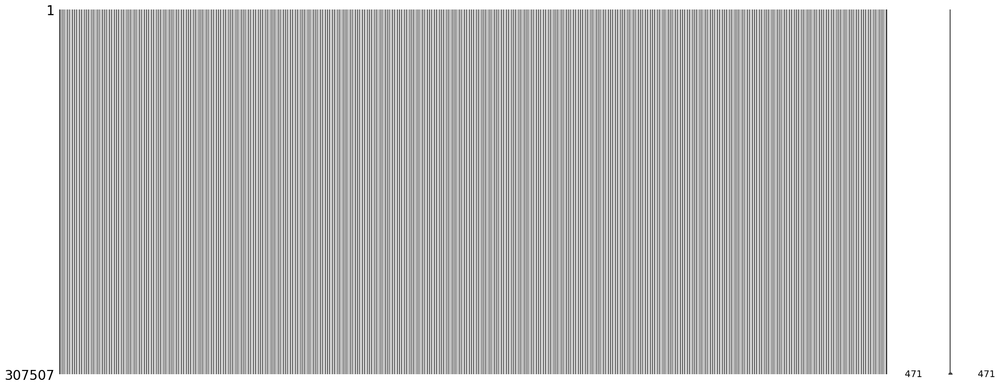

In [76]:
description_dataset(train_df, matrix=True)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal 

Taille :-------------------------------------------------------------- (48744, 471)
----------------------------------------------------------------------------------------------------
Types :float64    298
int32      133
int64       40
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
Types :SK_ID_CURR                                                                 int64
TARGET                                                                   float64
CODE_GENDER                                                                int64
FLAG_OWN_CAR                                                               int64
FLAG_OWN_REALTY                                                            int64
CNT_CHILDREN                                                               int64
AMT_INCOME_TOTAL                                                         float64
AMT_CREDIT                                                    

,% de valeurs manquantes
TARGET,100.0
PREV_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Medicine_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Journey_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Hobby_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Furniture_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Everyday expenses_MEAN,0.0
PREV_NAME_CASH_LOAN_PURPOSE_Education_MEAN,0.0


----------------------------------------------------------------------------------------------------
Valeurs différentes par variables : 
SK_ID_CURR------------------------------------------------------------ contient 48744 valeurs différentes
TARGET---------------------------------------------------------------- [nan]
CODE_GENDER----------------------------------------------------------- [1 0]
FLAG_OWN_CAR---------------------------------------------------------- [0 1]
FLAG_OWN_REALTY------------------------------------------------------- [0 1]
CNT_CHILDREN---------------------------------------------------------- [ 0  2  1  3  8  4  6  5  7 20 11]
AMT_INCOME_TOTAL------------------------------------------------------ contient 606 valeurs différentes
AMT_CREDIT------------------------------------------------------------ contient 2937 valeurs différentes
AMT_ANNUITY----------------------------------------------------------- contient 7491 valeurs différentes
REGION_POPULATION_RELATIVE--

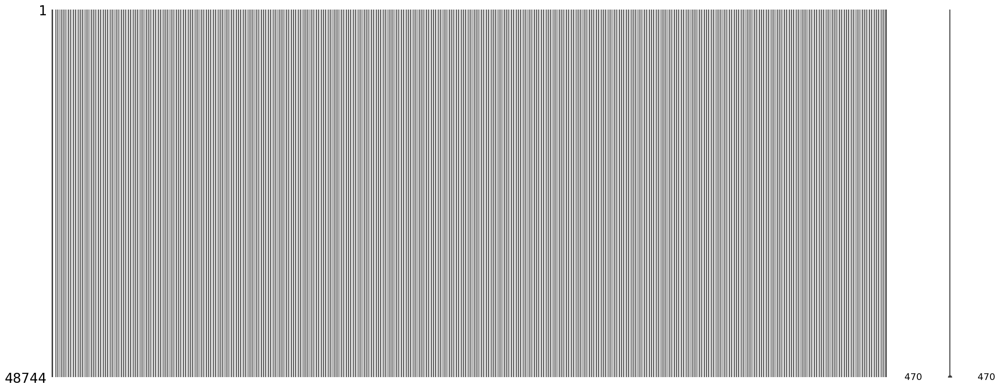

In [77]:
description_dataset(test_df, matrix=True)

In [78]:
test_df=test_df.drop('TARGET',axis=1)

In [79]:
train_df.to_csv('train_df.csv', index = False)
test_df.to_csv('test_df.csv', index = False)

In [80]:
train_df_fin=train_df.iloc[:,2:]

In [82]:
list(train_df_fin.columns)

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_1

In [83]:
train_df_fin.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZAT

In [84]:
X=np.array(train_df_fin)

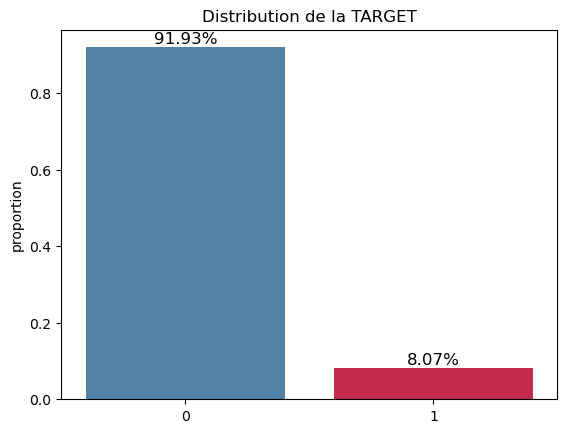

In [87]:
# Données
target_distribution =train_df['TARGET'].value_counts(normalize=True)
percentages = target_distribution * 100

# Créer le graphique
ax = sns.barplot(x=[0, 1], y=target_distribution, palette=['SteelBlue', 'crimson'])
plt.title('Distribution de la TARGET')

# Ajouter les annotations avec les pourcentages
for i, v in enumerate(target_distribution):
    ax.text(i, v + 0.01, f'{percentages[i]:.2f}%', ha='center', fontsize=12)

plt.show()

In [88]:
y=train_df['TARGET']

In [89]:
y

0         1
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 307507, dtype: int64

In [90]:


    
def conf_mat_transform(y_true, y_pred):
    '''Créer et affiche la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: affiche la matrice de confusion
    '''
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    plt.figure(figsize = (6,4))
    sns.heatmap(conf_mat, annot=True, cmap="Blues")
    
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Matrice de confusion')
    plt.savefig("conf_mat.png")

def eval_score(model, X_val, y_true, seuil=0.5):
    '''Calcule, affiche et enregistre les différentes métriques.
    :param: model, X_val (dataframe de validation), y_true (vraies valeurs),
    seuil (seuil de détermination des prédictions)
    :return: affiche (et return) les métriques, la matrice de confusion et la courbe ROC.
    '''    
    y_pred_proba = model.predict_proba(X_val)[:, 1]
    y_pred = np.where(y_pred_proba > seuil, 1, 0)
    

    accuracy = metrics.accuracy_score(y_true, y_pred)
    precision = metrics.precision_score(y_true, y_pred)
    recall = metrics.recall_score(y_true, y_pred)
    f1_score = metrics.f1_score(y_true, y_pred)
    fbeta_score = metrics.fbeta_score(y_true, y_pred, beta=2)
    rocauc = metrics.roc_auc_score(y_true, y_pred)
    
  
    print('Accuracy score : {:.2f}'.format(accuracy))
    print('Precision score : {:.2f}'.format(precision))
    print('Recall score : {:.2f}'.format(recall))
    print('F1 score : {:.2f}'.format(f1_score))
    print('Fbeta score : {:.2f}'.format(fbeta_score))
    print('ROC AUC score : {:.2f}'.format(rocauc))
    
    
    conf_mat_transform(y_true, y_pred)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    
    fpr, tpr, threshold = metrics.roc_curve(y_true, y_pred_proba)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('Courbe ROC')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.savefig("roc_curve.png")
    
    plt.show()
    
    return  accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba

In [91]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, stratify=y, random_state=0)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(246005, 469) (246005,)
(61502, 469) (61502,)


In [92]:
X_val, X_val_test, y_val, y_val_test = train_test_split(X_val, y_val, test_size=0.20, stratify=y_val, random_state=0)

print(X_val_test.shape, y_val_test.shape)
print(X_val.shape, y_val.shape)

(12301, 469) (12301,)
(49201, 469) (49201,)


In [94]:
len(y_val)

49201

In [95]:
y_val

159413    0
190663    1
21242     0
285291    0
220800    0
         ..
288677    0
264358    0
6928      0
232512    0
18115     0
Name: TARGET, Length: 49201, dtype: int64

In [96]:
Y_val_zero=(y_val==0).sum()
print(Y_val_zero)

45229


In [97]:
percentage_zero=(Y_val_zero/len(y_val))*100
print(percentage_zero)

91.92699335379362


In [98]:
Y_val_un=(y_val==1).sum()

In [99]:
Y_val_un

3972

In [100]:
percentage_un=(Y_val_un/len(y_val))*100
print(percentage_un)

8.073006646206379


In [101]:
X_train

array([[0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        4.36557915e+05, 2.90250000e+01, 2.13030000e+04],
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.68103925e+05, 7.64640000e+02, 6.61200000e+03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.02511690e+05, 5.21100000e+02, 2.66350000e+04],
       ...,
       [1.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        3.79156770e+05, 4.31239500e+03, 1.77750000e+04],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.51993170e+05, 7.45785000e+03, 4.82000000e+03],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.82488855e+05, 2.07000000e+00, 1.28427000e+05]])

In [103]:


X_train_scaled = X_train.copy()
X_val_scaled = X_val.copy()
X_val_test_scaled = X_val_test.copy()
X_test_scaled = test_df.copy()

std_scale = StandardScaler()
std_scale.fit(X_train)

X_train_scaled = std_scale.transform(X_train)
X_val_scaled = std_scale.transform(X_val)
X_val_test_scaled = std_scale.transform(X_val_test)

# Sans équilibrage

# RegressionLogistic 

2025/01/02 09:18:34 WARNING mlflow.utils.git_utils: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh(<full-path-to-git-executable>)

All git commands will error until this is rectified.

This initial message can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|silent|none|n|0: for no message or exception
    - warn|w|warning|log|l|1: for a warning message (logging level CRITICAL, displayed by default)
    - error|e|exception|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet



Accuracy score : 0.92
Precision score : 0.49
Recall score : 0.02
F1 score : 0.04
Fbeta score : 0.03
ROC AUC score : 0.51


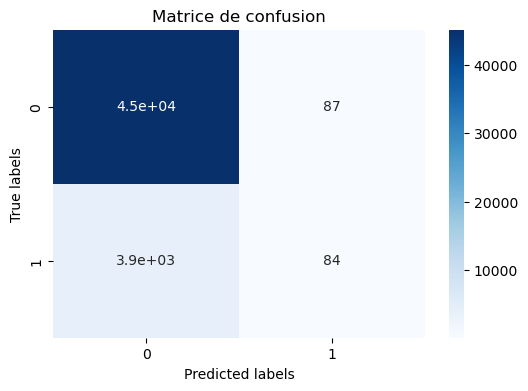

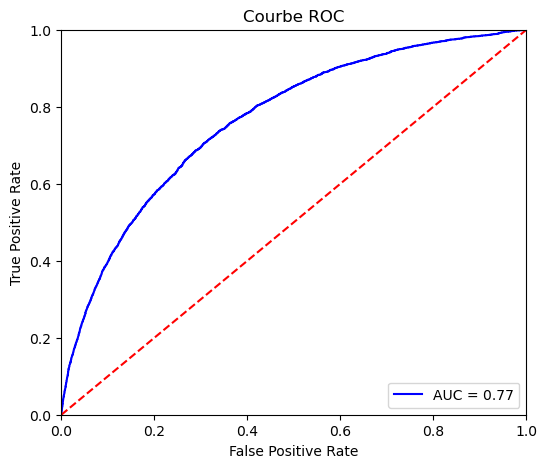

In [108]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LogisticRegression sans équilibrage'):
    reg_log_inequal = LogisticRegression(max_iter=1000,random_state=0)
    reg_log_inequal.fit(X_train_scaled, y_train)

    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_inequal, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
   
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    # voir comment on peut integrer la courbe roc dans mlflow
    #
    mlflow.end_run()  # Fin du run

In [109]:
# une bonne raison de réequilibrer les classes: on voit que la majorité sont placés dans la classe 0 qui reprsente la majorité

# Arbre de decision

Accuracy score : 0.85
Precision score : 0.14
Recall score : 0.16
F1 score : 0.15
Fbeta score : 0.16
ROC AUC score : 0.54


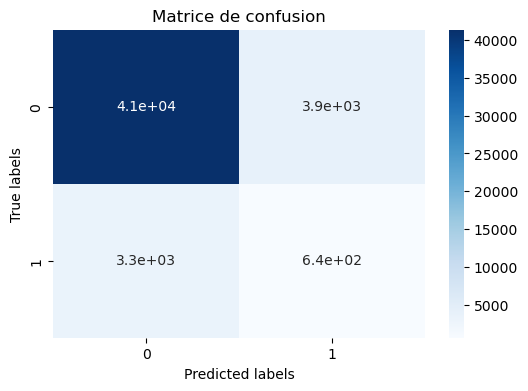

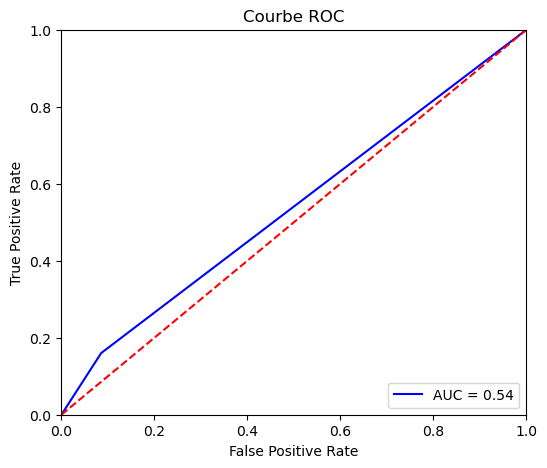

In [112]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    mlflow.end_run()  # Fin du run  

# Random Forest

Accuracy score : 0.92
Precision score : 0.86
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


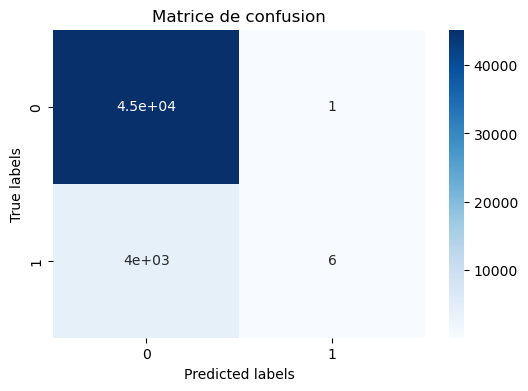

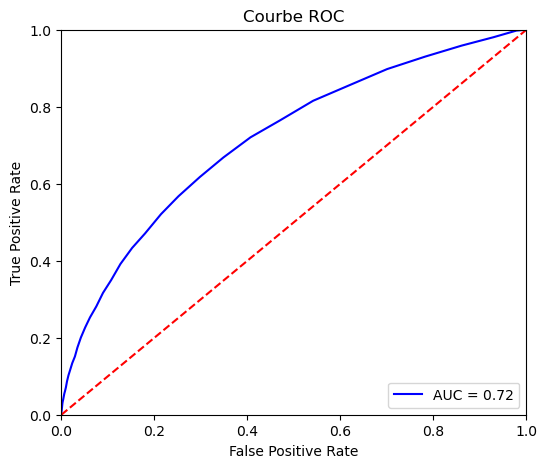

In [113]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    
    mlflow.end_run()  # Fin du run  

In [114]:
# connaitre par coeur les formules de calcul : accuracy , recall (nombre de données bien classées, precision

# Gradient Boosting

Accuracy score : 0.92
Precision score : 0.45
Recall score : 0.06
F1 score : 0.10
Fbeta score : 0.07
ROC AUC score : 0.52


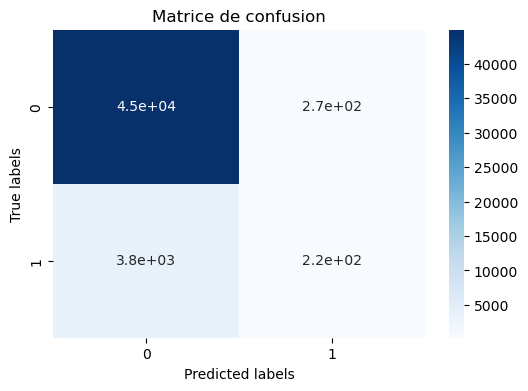

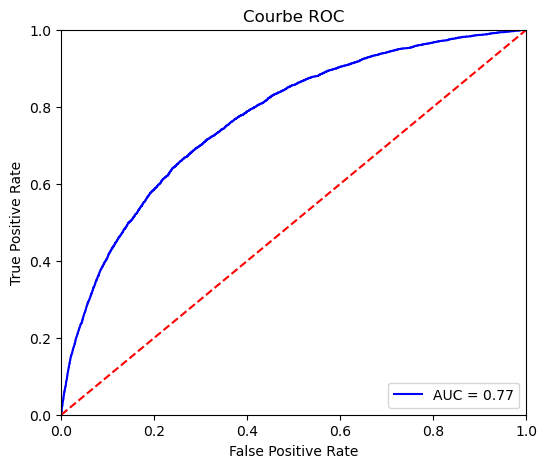

In [115]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 
    

# Light Gradient Boosting

[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.347769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38328
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 428
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
Accuracy score : 0.92
Precision score : 0.55
Recall score : 0.03
F1 score : 0.06
Fbeta score : 0.04
ROC AUC score : 0.52


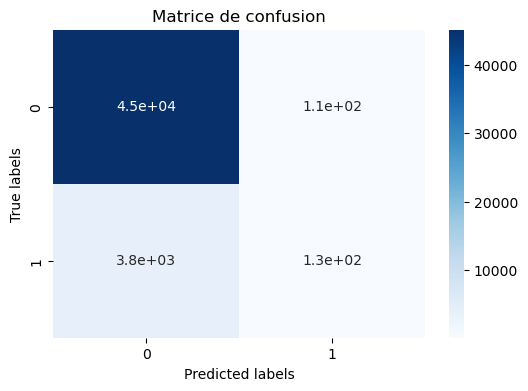

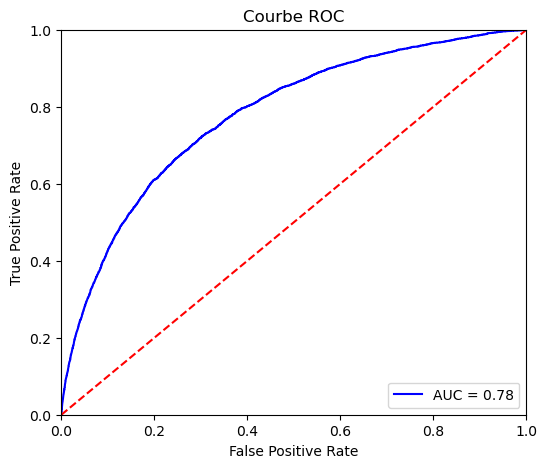

In [116]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

In [117]:
len(X_train[0])

469

In [118]:
len(X_val[0])

469

# Methode d'équilibrage des données

avec class_weight
La méthode des class weight permet de prendre en compte le caractère biaisé de la distribution du dataset et de créer un modèle pénalisé. Il s’agit ici de simplement attribuer des poids différents aux différentes classes de notre dataset, en donnant un poids plus important aux classes minoritaires, afin d’influencer le modèle lors de son entraînement. Nous pénalisons ainsi plus fortement une erreur de classification d’une classe minoritaire par rapport à une erreur de classification d’une classe majoritaire.



Le SMOTE, acronyme pour Synthetic Minority Oversampling TEchnique, est une méthode de suréchantillonnage des observations minoritaires. Pour éviter de réaliser un simple clonage des individus minoritaires, le SMOTE se base sur un principe simple : générer de nouveaux individus minoritaires qui ressemblent aux autres, sans être strictement identiques. Cela permet de densifier de façon plus homogène la population d’individus minoritaires.


Tomek Links est une approche de sous-échantillonnage de la classe majoritaire. L’idée est de chercher les points de la classe majoritaire qui sont assez proches d’un point de la classe minoritaire. Les paires de points identifiées sont appelées tomek links. Dans chaque tomek link on va retirer le point qui appartient à la classe majoritaire.


SMOTETomek est une technique combinant l'oversampling (SMOTE) et l'undersampling (Tomek Links). Elle vise à résoudre le déséquilibre de classes en augmentant la classe minoritaire par synthèse d'échantillons (SMOTE) tout en réduisant la classe majoritaire en supprimant les exemples qui se trouvent à la frontière entre les classes (Tomek Links).

classe weight a eviter ,smote + undersampling

In [119]:
# REprendre tous les methodes de d'equilibrage et(savoir pour classe weight a integrer dans le modele pour lgbm et xgboost)

# Rééquilibrage avec class_weight
class_weight='balanced' dans scikit-learn :

Scikit-learn calcule automatiquement les poids des classes en fonction de l'inverse de la fréquence des classes dans les données. La formule utilisée est la suivante : Poids de la classe i=ntotal/nclasses×ni

où:
ntotal est le nombre total d'exemples,
nclasses est le nombre de classes,
ni​ est le nombre d'exemples dans la classe i.
Ainsi, les classes minoritaires reçoivent des poids plus élevés pour compenser leur sous-représentation.



Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.69
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.70


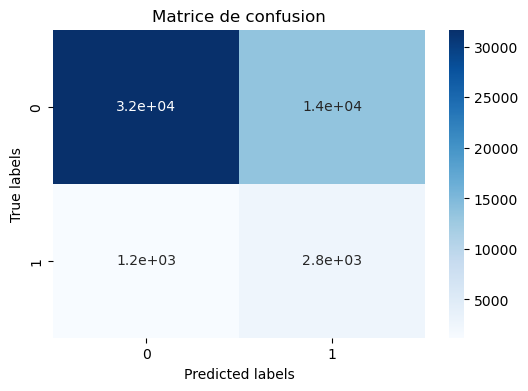

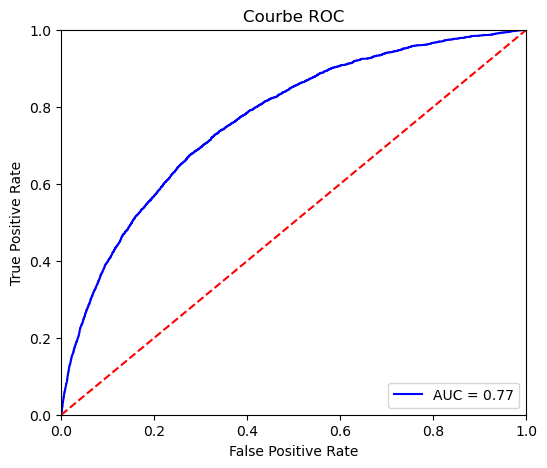

In [120]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LogisticRegression class_weight'):
    reg_log_balanced = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=0)
    reg_log_balanced.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_balanced, X_val_scaled, y_val)
   
   # mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

# Arbre de décision

Accuracy score : 0.86
Precision score : 0.15
Recall score : 0.16
F1 score : 0.16
Fbeta score : 0.16
ROC AUC score : 0.54


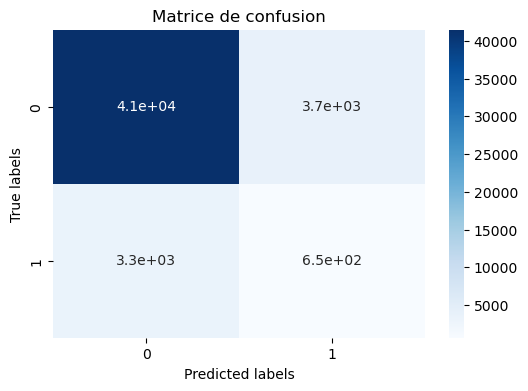

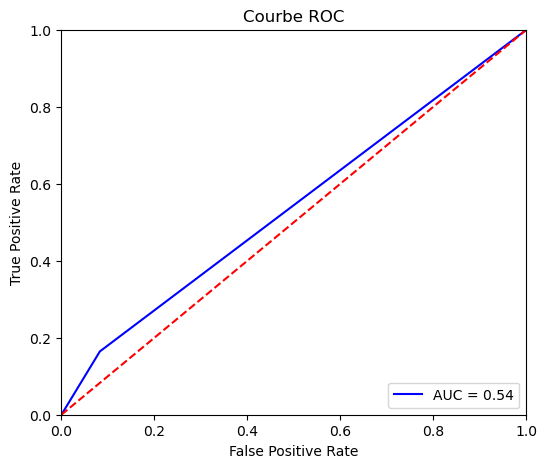

In [121]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0,class_weight='balanced')
    tree.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

# Random Forest

Accuracy score : 0.92
Precision score : 0.67
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


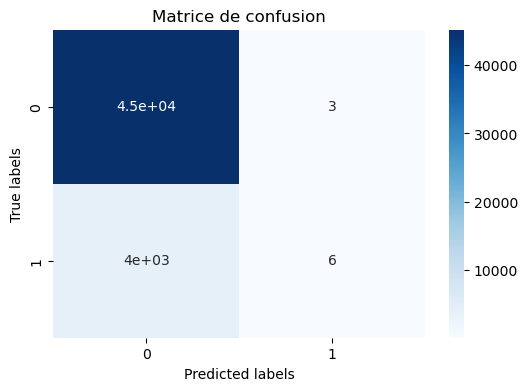

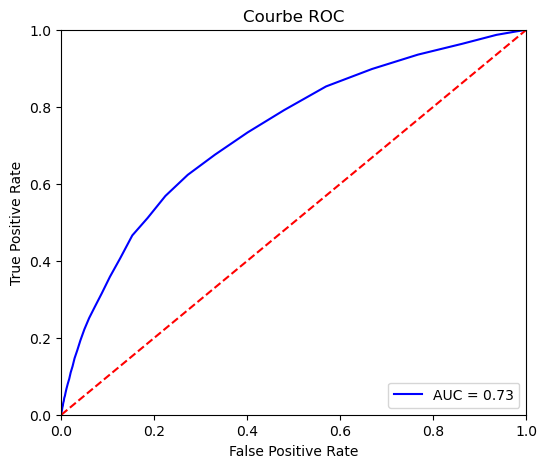

In [122]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0,class_weight='balanced')
    rf.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

# Gradient Boosting

Accuracy score : 0.92
Precision score : 0.45
Recall score : 0.06
F1 score : 0.10
Fbeta score : 0.07
ROC AUC score : 0.52


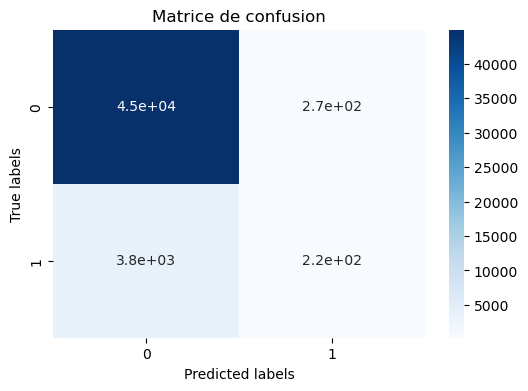

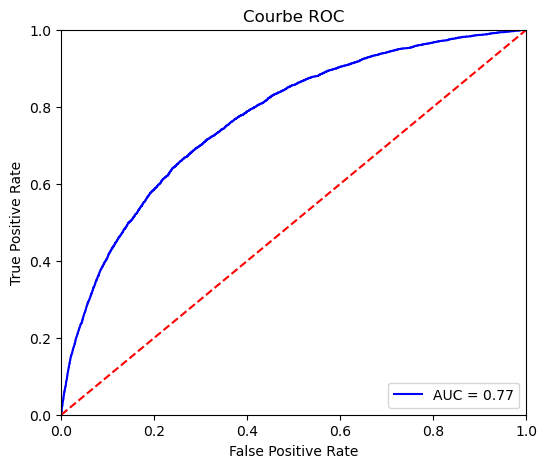

In [123]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0,class_weight='balanced')
    xgb.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

# Light Gradient Boosting

[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.296955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38328
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 428
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Accuracy score : 0.72
Precision score : 0.18
Recall score : 0.70
F1 score : 0.29
Fbeta score : 0.45
ROC AUC score : 0.71


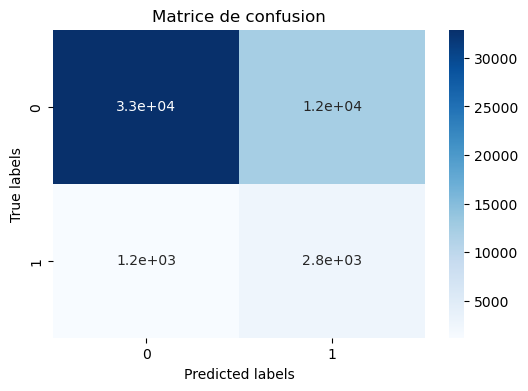

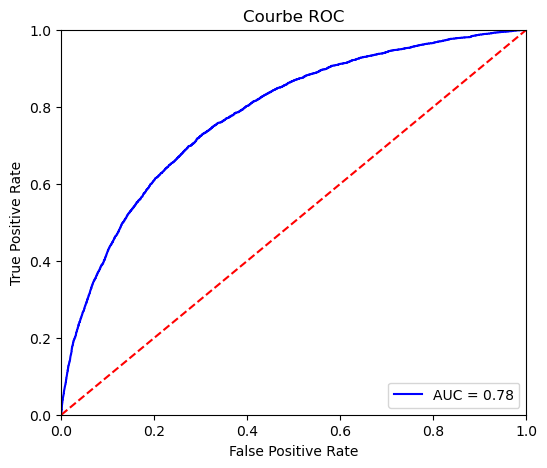

In [124]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0,class_weight='balanced')
    lgbm.fit(X_train_scaled, y_train)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run 

In [125]:
len(X_train[0])

469

In [126]:
len(X_val[0])

469

# RandomUnderSampler

Equilibre des classes : Counter({0: 226145, 1: 19860})
Resampled dataset shape Counter({0: 19860, 1: 19860})
Equilibre des classes : Counter({0: 19860, 1: 19860})
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.69
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.69


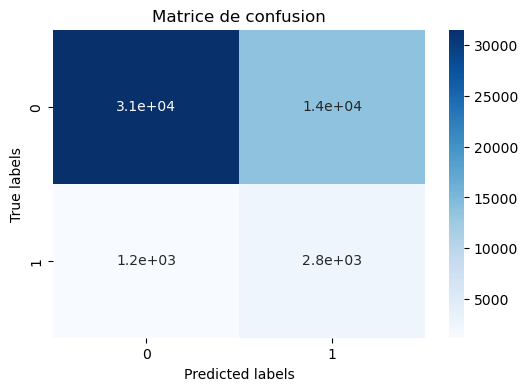

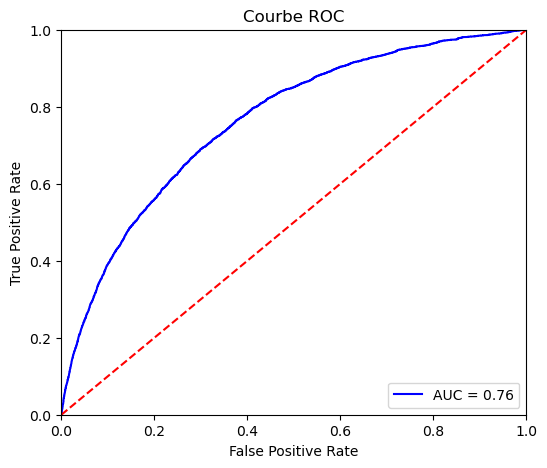

In [127]:
# JE PRENDS ALEATOIRE UN UN ECHaNTILLON =19860
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler

print('Equilibre des classes : {}'.format(Counter(y_train)))

# Échantillonnage sous-jacent
rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X_train_scaled, y_train)

# Affichage de la forme de l'ensemble de données rééchantillonné
print('Resampled dataset shape %s' % Counter(y_res))

print('Equilibre des classes : {}'.format(Counter(y_res)))

# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LogisticRegression undersampling'):
    reg_log_under = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under.fit(X_res, y_res)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_under, X_val_scaled, y_val)
   
    #mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run


# Arbre de Décision

Accuracy score : 0.59
Precision score : 0.11
Recall score : 0.58
F1 score : 0.19
Fbeta score : 0.31
ROC AUC score : 0.59


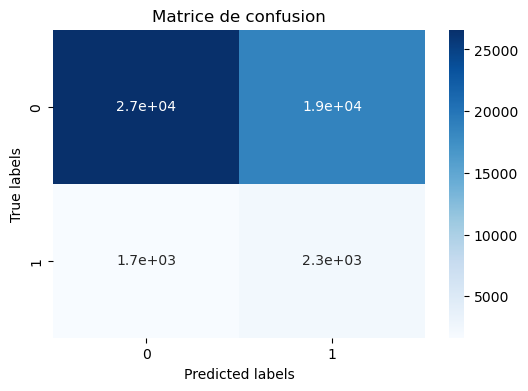

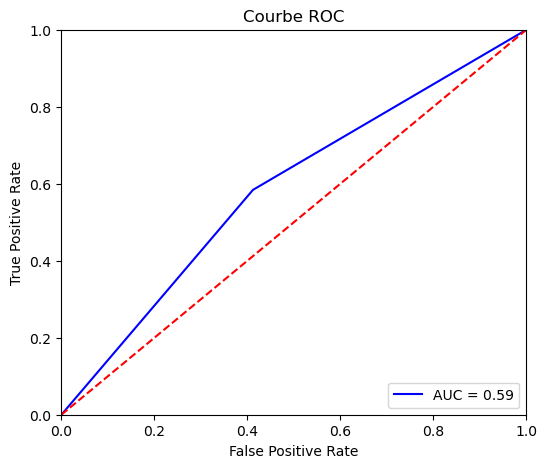

In [132]:
# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_res, y_res)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Random Forest

Accuracy score : 0.69
Precision score : 0.16
Recall score : 0.68
F1 score : 0.26
Fbeta score : 0.41
ROC AUC score : 0.68


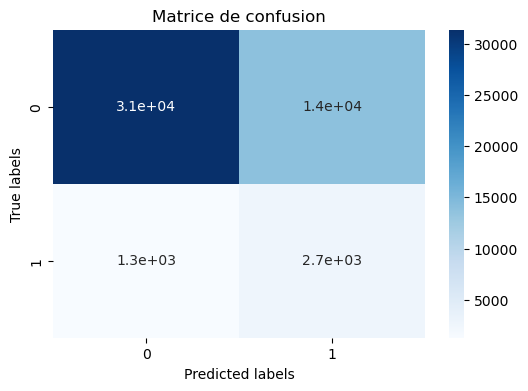

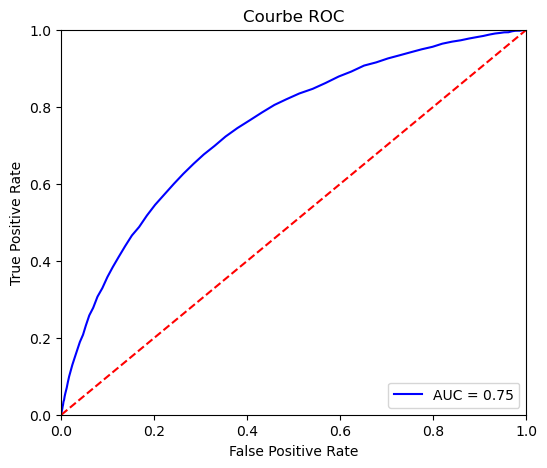

In [133]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_res, y_res)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Gradient Boosting

Accuracy score : 0.69
Precision score : 0.16
Recall score : 0.68
F1 score : 0.26
Fbeta score : 0.41
ROC AUC score : 0.69


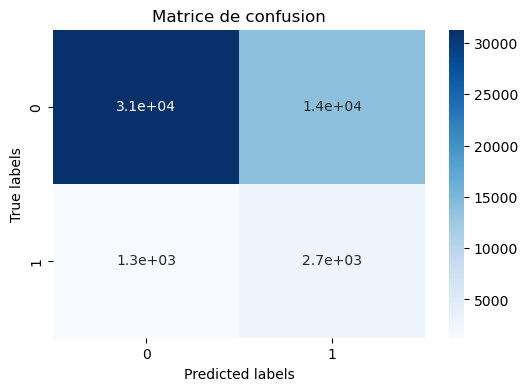

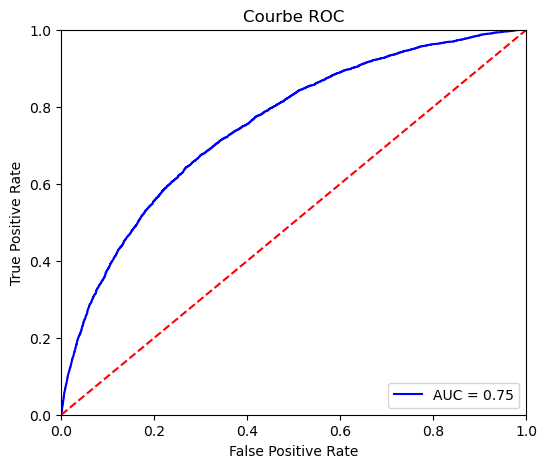

In [ ]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_res, y_res)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  

# Light Gradients Boosting

[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33636
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 405
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.71
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


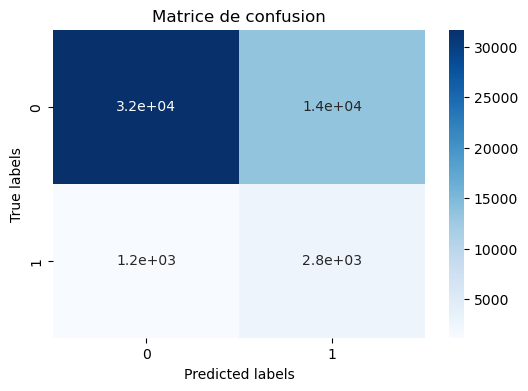

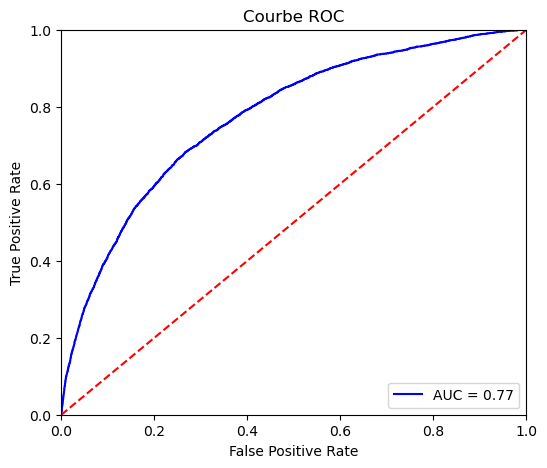

In [135]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_res, y_res)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Réequilibrage avec Sous-échantillonnage : Tomek Links

une méthode de sous-échantillonnage (undersampling) utilisée pour réduire les déséquilibres dans des ensembles de données où une classe est beaucoup plus représentée que l'autre
Processus :

Identification des Tomek Links : L'algorithme parcourt les paires d'exemples proches dans l'espace des caractéristiques et détecte les paires qui forment des liens Tomek.

Suppression des exemples : Ensuite, les exemples de la classe majoritaire impliqués dans les Tomek Links sont supprimés. Cela permet d'éliminer les points de données qui se situent trop près des points de la classe minoritaire et qui pourraient entraîner une mauvaise séparation des classes.

Il est également possible de supprimer les deux exemples dans un lien Tomek (les deux instances de classes opposées), mais dans la plupart des cas, seule la classe majoritaire est sous-échantillonnée.
Effet sur les données : En supprimant ces exemples, l'algorithme nettoie l'ensemble de données et améliore la séparation entre les classes. Cela réduit l'influence des exemples ambigus et améliore potentiellement les performances du classifieur.

##### 

Equilibre des classes : Counter({0: 226145, 1: 19860})
Equilibre des classes : Counter({0: 223168, 1: 19860})
Accuracy score : 0.92
Precision score : 0.50
Recall score : 0.02
F1 score : 0.05
Fbeta score : 0.03
ROC AUC score : 0.51


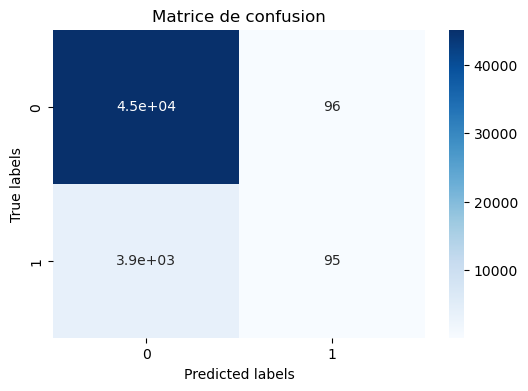

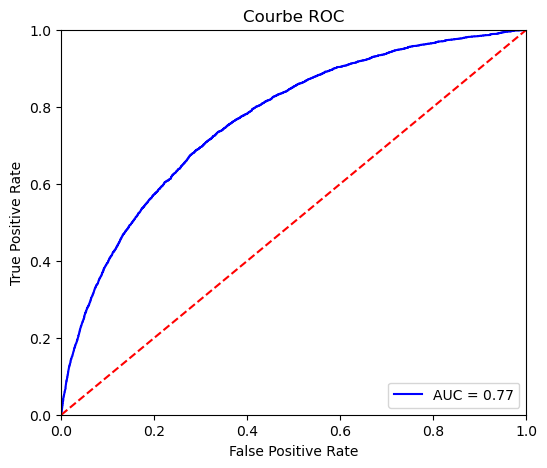

In [138]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
print('Equilibre des classes : {}'.format(Counter(y_train)))

# Création de l'objet TomekLinks
tomek_links = TomekLinks()

# Sous-échantillonnage en utilisant Tomek Links
X_train_tl, y_train_tl = tomek_links.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_tl)))
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name='LogisticRegression undersampling'):
    reg_log_under = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under.fit(X_train_tl, y_train_tl)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_under, X_val_scaled, y_val)
   
    #mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Arbre de décision

Accuracy score : 0.85
Precision score : 0.14
Recall score : 0.17
F1 score : 0.16
Fbeta score : 0.16
ROC AUC score : 0.54


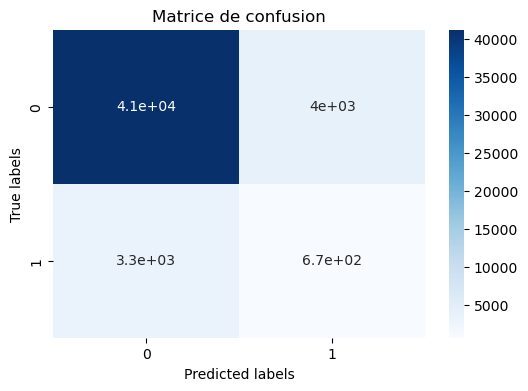

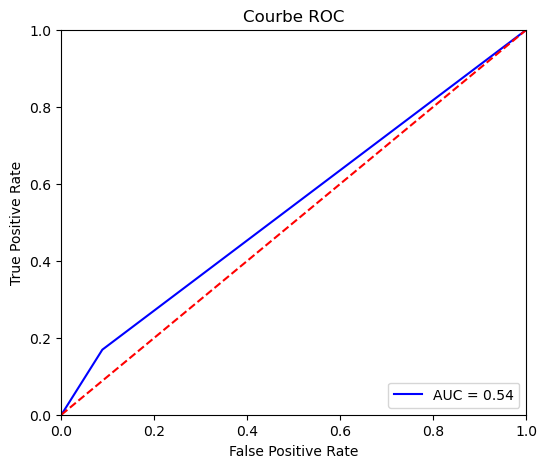

In [139]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_train_tl, y_train_tl)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Random Forest

Accuracy score : 0.92
Precision score : 0.86
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


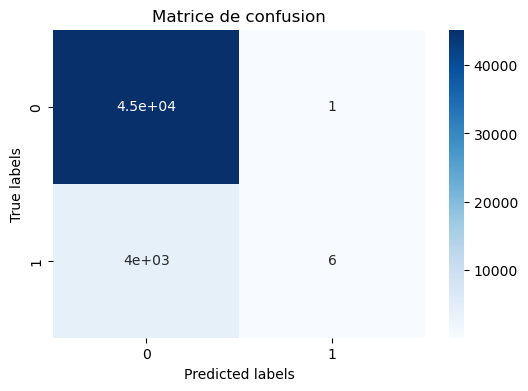

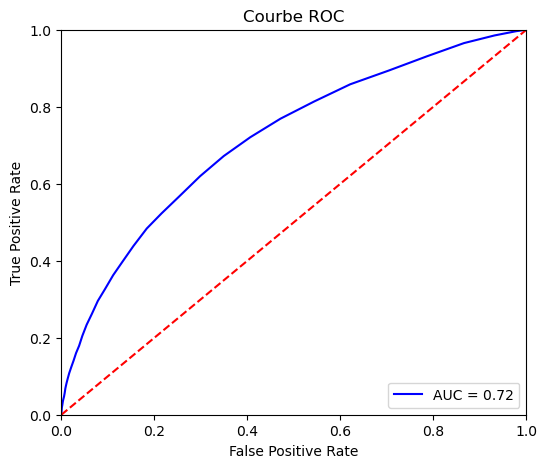

In [140]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_train_tl, y_train_tl)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Gradient Boosting

Accuracy score : 0.92
Precision score : 0.50
Recall score : 0.06
F1 score : 0.11
Fbeta score : 0.08
ROC AUC score : 0.53


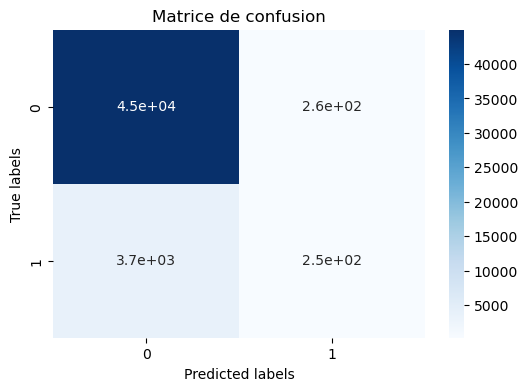

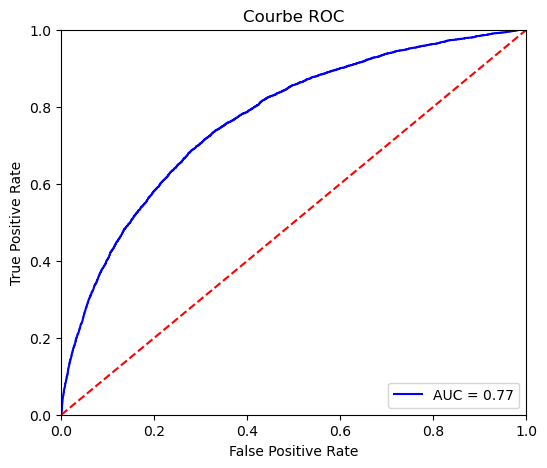

In [141]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_train_tl, y_train_tl)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Light Boosting

[LightGBM] [Info] Number of positive: 19860, number of negative: 223168
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.351491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38277
[LightGBM] [Info] Number of data points in the train set: 243028, number of used features: 428
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081719 -> initscore=-2.419217
[LightGBM] [Info] Start training from score -2.419217
Accuracy score : 0.92
Precision score : 0.54
Recall score : 0.03
F1 score : 0.07
Fbeta score : 0.04
ROC AUC score : 0.52


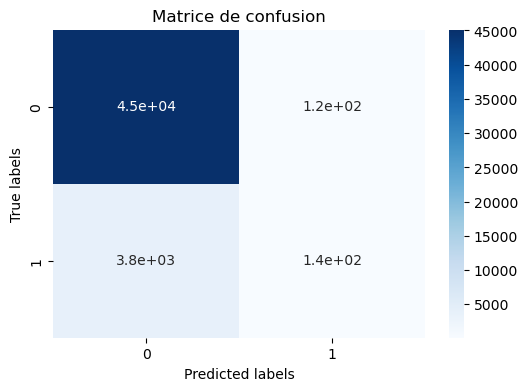

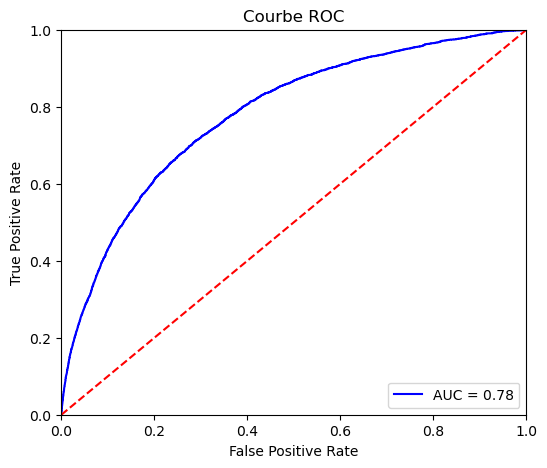

In [142]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_train_tl, y_train_tl)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

In [143]:
len(X_train[0])

469

In [144]:
len(X_val[0])

469

# Equilibrage Smote:

Le SMOTE (Synthetic Minority Over-sampling Technique) est une méthode de sur-échantillonnage utilisée pour équilibrer des ensembles de données déséquilibrés en augmentant artificiellement la taille de la classe minoritaire. Contrairement à d'autres techniques de sur-échantillonnage comme la duplication simple des exemples de la classe minoritaire, SMOTE génère de nouvelles instances synthétiques en interpolant entre des exemples existants de la classe minoritaire.


Equilibre des classes : Counter({0: 226145, 1: 19860})
Equilibre des classes : Counter({0: 226145, 1: 226145})
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.65
F1 score : 0.27
Fbeta score : 0.41
ROC AUC score : 0.68


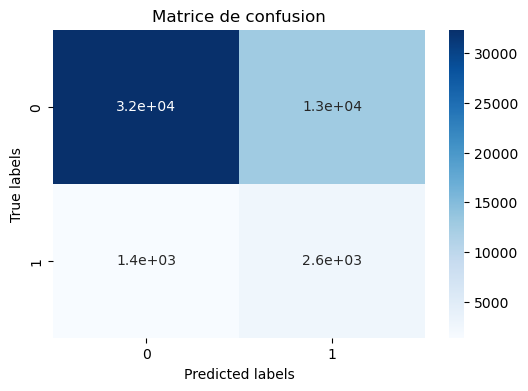

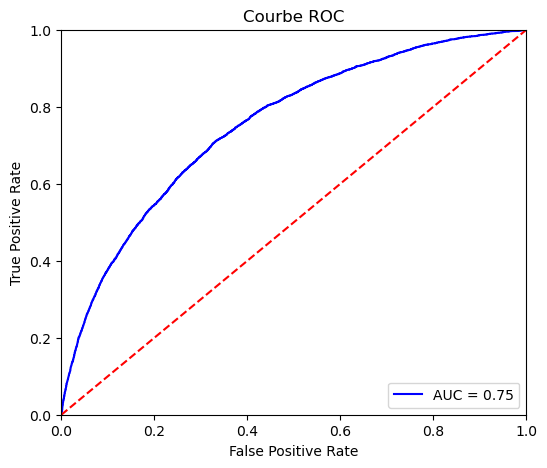

In [145]:
print('Equilibre des classes : {}'.format(Counter(y_train)))

# Définition de l'instance SMOTE
sm = SMOTE(random_state=0)

# Application du SMOTE aux données
X_train_sm, y_train_sm = sm.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_sm)))
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LogisticRegression upsampling'):
    reg_log_up = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_up.fit(X_train_sm, y_train_sm)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_up, X_val_scaled, y_val)
   
    #mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Arbre de decision

Accuracy score : 0.84
Precision score : 0.14
Recall score : 0.20
F1 score : 0.17
Fbeta score : 0.19
ROC AUC score : 0.55


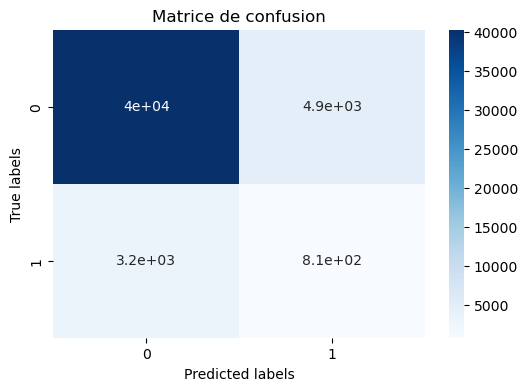

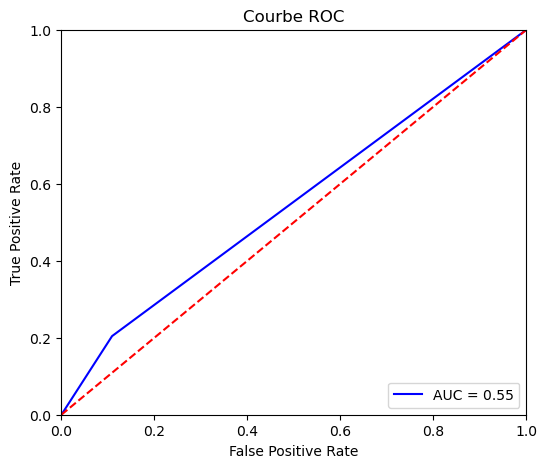

In [146]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_train_sm, y_train_sm)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Random Forest

Accuracy score : 0.92
Precision score : 0.34
Recall score : 0.02
F1 score : 0.04
Fbeta score : 0.03
ROC AUC score : 0.51


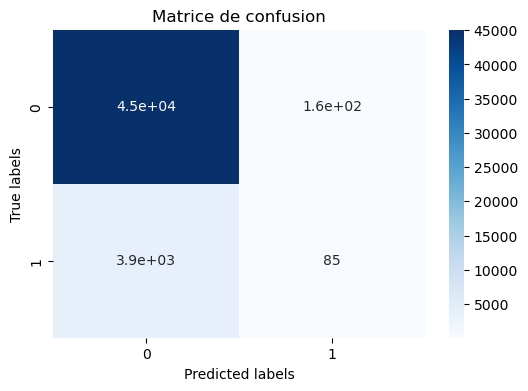

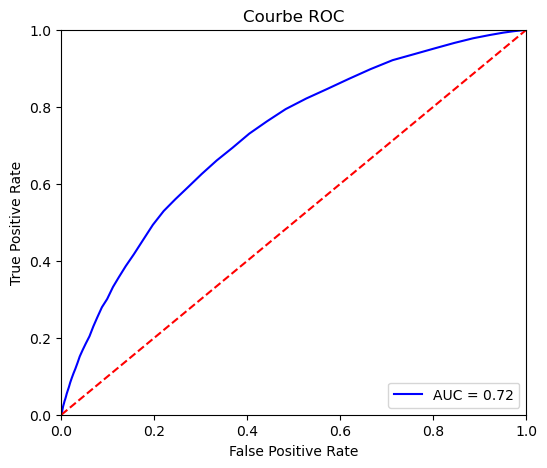

In [147]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_train_sm, y_train_sm)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Gradient Boosting

Accuracy score : 0.92
Precision score : 0.49
Recall score : 0.06
F1 score : 0.11
Fbeta score : 0.07
ROC AUC score : 0.53


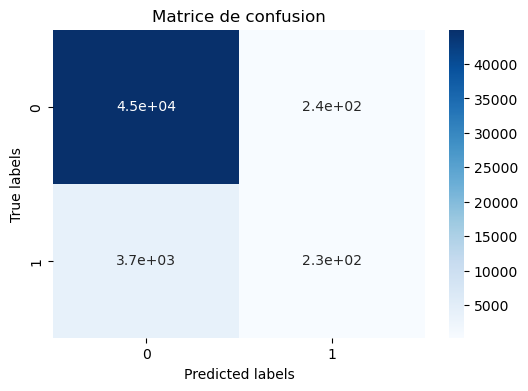

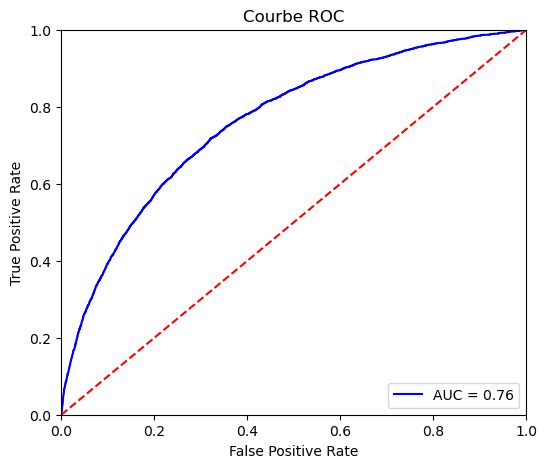

In [148]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_train_sm, y_train_sm)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Light Gradient Boosting

[LightGBM] [Info] Number of positive: 226145, number of negative: 226145
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.679795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86493
[LightGBM] [Info] Number of data points in the train set: 452290, number of used features: 436
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Accuracy score : 0.92
Precision score : 0.52
Recall score : 0.02
F1 score : 0.04
Fbeta score : 0.03
ROC AUC score : 0.51


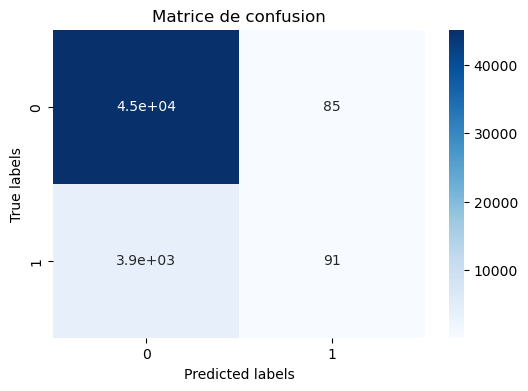

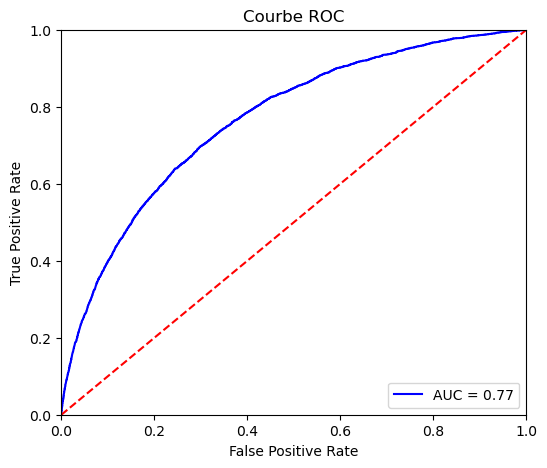

In [149]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_train_sm, y_train_sm)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

In [150]:
len(X_train[0])

469

In [151]:
len(X_val[0])

469

# Réequilibrage avec Smote Tomek


SMOTETomek combine ces deux techniques en appliquant d'abord SMOTE pour augmenter artificiellement la classe minoritaire, puis en appliquant Tomek Links pour nettoyer les exemples ambiguës de la classe majoritaire. Le processus se déroule en deux étapes :

Étape 1 : Sur-échantillonnage avec SMOTE
SMOTE est appliqué pour générer des exemples synthétiques dans la classe minoritaire. Cela augmente la proportion de la classe minoritaire dans l'ensemble de données, en générant des points proches des exemples existants, mais sans dupliquer directement les instances.
Étape 2 : Sous-échantillonnage avec Tomek Links
Une fois que SMOTE a généré des exemples synthétiques, Tomek Links est appliqué. Cette étape identifie les exemples proches appartenant à des classes différentes (les liens Tomek). Les exemples de la classe majoritaire impliqués dans ces liens sont supprimés pour clarifier la séparation entre les classes.
Parfois, les exemples des deux classes (minoritaire et majoritaire) dans un lien Tomek peuvent être supprimés, mais généralement, seul l'exemple de la classe majoritaire est supprimé.

In [153]:
# Combinaison d'oversampling et d'undersampling : SMOTE (oversampling) et Tomek Links (undersampling)

print('Equilibre des classes : {}'.format(Counter(y_train)))

# Création de l'objet SMOTETomek
smote_tomek = SMOTETomek(sampling_strategy=0.5,random_state=0)# à reprendre avec 0.5

# Sous-échantillonnage en utilisant SMOTETomek
X_train_st, y_train_st = smote_tomek.fit_resample(X_train_scaled, y_train)

print('Equilibre des classes : {}'.format(Counter(y_train_st)))

Equilibre des classes : Counter({0: 226145, 1: 19860})
Equilibre des classes : Counter({0: 226120, 1: 113047})


Accuracy score : 0.84
Precision score : 0.23
Recall score : 0.44
F1 score : 0.30
Fbeta score : 0.37
ROC AUC score : 0.65


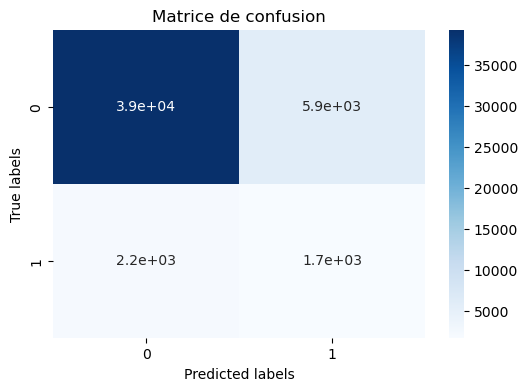

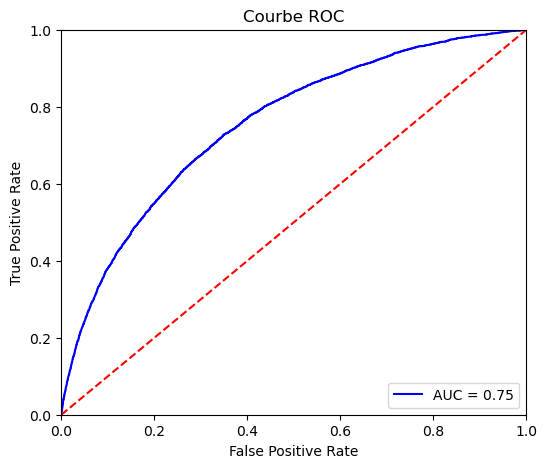

In [154]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LogisticRegression combinaison'):
    reg_log_combi = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_combi.fit(X_train_st, y_train_st)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(reg_log_combi, X_val_scaled, y_val)
   
    #mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Arbre de decision

Accuracy score : 0.84
Precision score : 0.14
Recall score : 0.19
F1 score : 0.16
Fbeta score : 0.18
ROC AUC score : 0.54


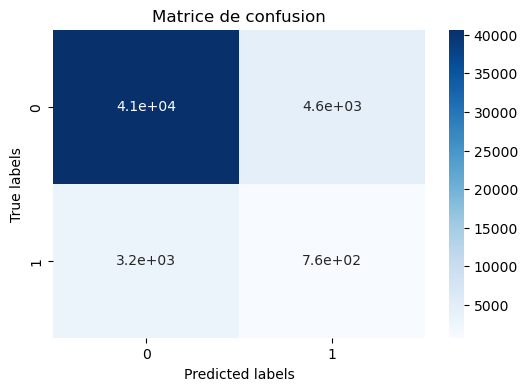

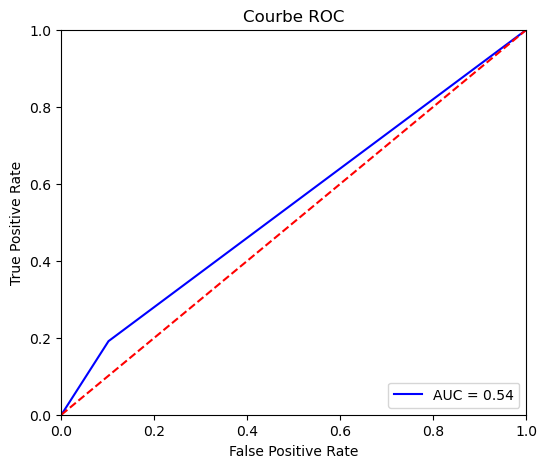

In [155]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    tree.fit(X_train_st, y_train_st)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(tree, X_val_scaled, y_val)
   
   
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()  # Fin du run

# Random Forest

Accuracy score : 0.92
Precision score : 0.36
Recall score : 0.01
F1 score : 0.02
Fbeta score : 0.01
ROC AUC score : 0.50


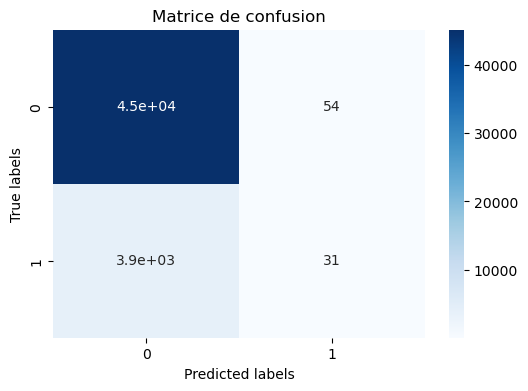

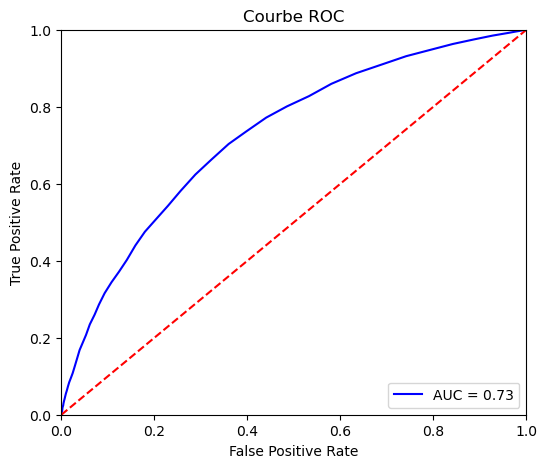

In [156]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Random Forest'):
    rf = RandomForestClassifier(random_state=0)
    rf.fit(X_train_st, y_train_st)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(rf, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()

# Gradient Boosting

Accuracy score : 0.92
Precision score : 0.49
Recall score : 0.06
F1 score : 0.10
Fbeta score : 0.07
ROC AUC score : 0.53


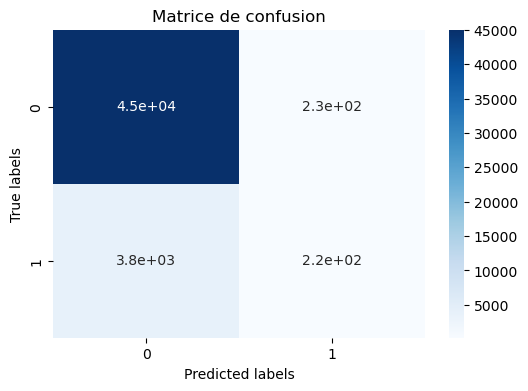

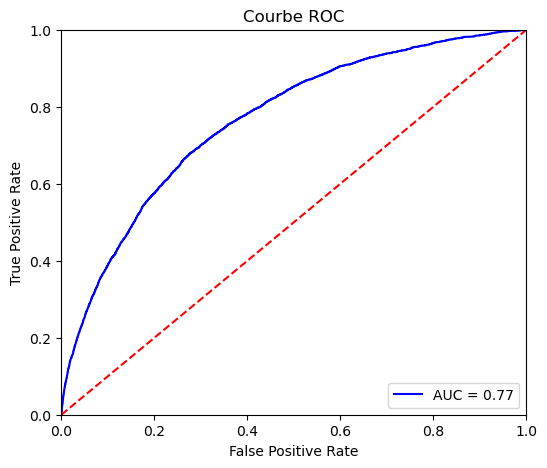

In [157]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='XGBoost Classifier'):
    xgb = XGBClassifier(random_state=0)
    xgb.fit(X_train_st, y_train_st)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(xgb, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()

# Light Gradient Boosting

[LightGBM] [Info] Number of positive: 113047, number of negative: 226120
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.498139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 82449
[LightGBM] [Info] Number of data points in the train set: 339167, number of used features: 435
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333308 -> initscore=-0.693262
[LightGBM] [Info] Start training from score -0.693262
Accuracy score : 0.92
Precision score : 0.53
Recall score : 0.02
F1 score : 0.04
Fbeta score : 0.03
ROC AUC score : 0.51


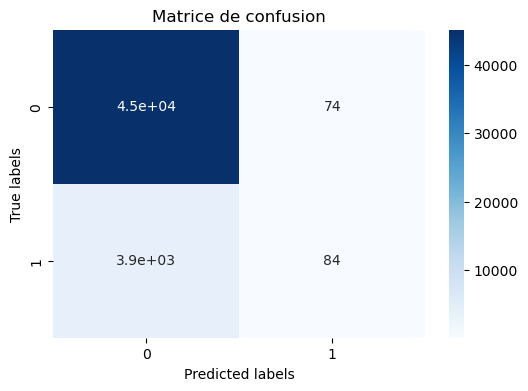

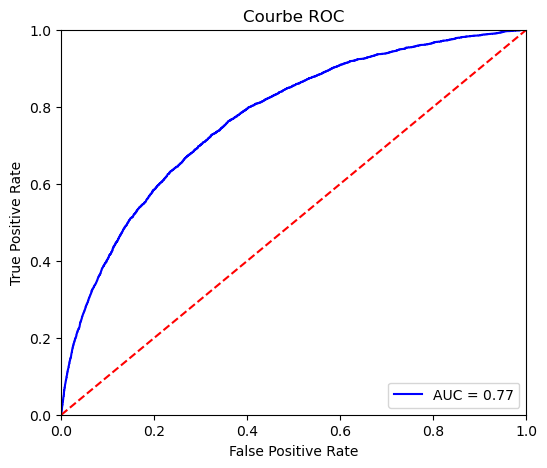

In [158]:
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='LGBM Classifier'):
    lgbm = LGBMClassifier(random_state=0)
    lgbm.fit(X_train_st, y_train_st)
    
    # Calcul et enregistrement des metriques sur les données de validation
    accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(lgbm, X_val_scaled, y_val)
   
    
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.end_run()

# Equilibrage RandomUnderSampler et Smote

In [161]:
# Combinaison d'oversampling et d'undersampling : SMOTE (oversampling) et RandomUnderSampler (undersampling)

print('Equilibre des classes : {}'.format(Counter(y_train)))

# Application de SMOTE + RandomUnderSampler
smote = SMOTE(sampling_strategy='minority')
undersample = RandomUnderSampler(sampling_strategy='majority')

# Première étape: appliquer SMOTE
X_smote, y_smote = smote.fit_resample(X_train_scaled, y_train)

# Deuxième étape: appliquer RandomUnderSampler
X_sra, y_sra = undersample.fit_resample(X_smote, y_smote)

print('Equilibre des classes : {}'.format(Counter(y_sra)))

Equilibre des classes : Counter({0: 226145, 1: 19860})
Equilibre des classes : Counter({0: 226145, 1: 226145})


In [162]:
def fonction_metier(y_true, y_pred):
    '''Créer un score métier à partir de la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: gain (score métier)
    '''
    TP_coeff = 0       # Vrais positifspas de gain ou de perte pour les vrais positifs(prédire corrctement categorie1)
    FP_coeff = 0       # Faux positifs (prédit comme faisant défaut (1) mais ne fait pas défaut (0))Pasde gain ou de perte pour les faux positifs
    FN_coeff = -10     # Faux négatifs (prédit comme ne faisant pas défaut (0) mais font défaut (1))pénalité -10 pour les faux négatifs(prédire 0 alors que c'est1)
    TN_coeff = 1       # Vrais négatifs GAins leger +1 pour les vrais négatifs prédire correctement une catégorie 0
    
    (TN, FP, FN, TP) = metrics.confusion_matrix(y_true, y_pred).ravel()
    
    gain = (TP*TP_coeff + TN*TN_coeff + FP*FP_coeff + FN*FN_coeff)/(TN+FP+FN+TP) #les faux negatifs sont plus penalisés    
    return gain

def score_metier_max(y_pred_proba, y_true, verbose=True):
    '''Créer un graphique permettant de déterminer quel peut être le score max en fonction du threshold.
    :param: y_pred_proba (probabilités prédites par le modèle), y_true (vraies valeurs),
    verbose (affiche le graphe ou juste le score maximal)
    :return: graphique, 
    '''
    scores = []
    for threshold in np.linspace(0, 1, num=101):
        y_pred = np.where(y_pred_proba > threshold, 1, 0)
        score = fonction_metier(y_true, y_pred)
        scores.append(score)

    if verbose == True:
        score_max = max(scores)
        opti_threshold = np.linspace(0, 1, num=101)[scores.index(score_max)]
        y_pred = np.where(y_pred_proba > opti_threshold, 1, 0)
        
        print("Score métier maximum : {:.2f}".format(score_max))
        print("Threshold optimal : {}".format(opti_threshold))
        
        fig, ax = plt.subplots(figsize=(6, 5))
        plt.plot(np.linspace(0, 1, num=101), scores, label="model score")
        plt.axvline(x=opti_threshold, color='k', dashes=(0.5, 1), 
                    label="optimal threshold: {}".format(opti_threshold))
        
        plt.title("Score métier en fonction du threshold", fontsize=10)
        plt.xlabel("Thresholds", fontsize=10)
        plt.ylabel("Score métier", fontsize=10)
        plt.legend()
        plt.show()
     
    else:
        return max(scores)

    
def conf_mat_transform(y_true, y_pred):
    '''Créer et affiche la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: affiche la matrice de confusion
    '''
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    plt.figure(figsize = (6,4))
    sns.heatmap(conf_mat, annot=True, cmap="Blues")
    
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Matrice de confusion')
    plt.savefig("conf_mat.png")


def eval_score(model, X_val, y_true, seuil=0.5):
    '''Calcule, affiche et enregistre les différentes métriques.
    :param: model, X_val (dataframe de validation), y_true (vraies valeurs),
    seuil (seuil de détermination des prédictions)
    :return: affiche (et return) les métriques, la matrice de confusion et la courbe ROC.
    '''    
    y_pred_proba = model.predict_proba(X_val)[:, 1]
    y_pred = np.where(y_pred_proba > seuil, 1, 0)
    
    metier = fonction_metier(y_true, y_pred)
    accuracy = metrics.accuracy_score(y_true, y_pred)
    precision = metrics.precision_score(y_true, y_pred)
    recall = metrics.recall_score(y_true, y_pred)
    f1_score = metrics.f1_score(y_true, y_pred)
    fbeta_score = metrics.fbeta_score(y_true, y_pred, beta=2)
    rocauc = metrics.roc_auc_score(y_true, y_pred)
    
    print('Score métier :{:.2f}'.format(metier))
    print('Accuracy score : {:.2f}'.format(accuracy))
    print('Precision score : {:.2f}'.format(precision))
    print('Recall score : {:.2f}'.format(recall))
    print('F1 score : {:.2f}'.format(f1_score))
    print('Fbeta score : {:.2f}'.format(fbeta_score))
    print('ROC AUC score : {:.2f}'.format(rocauc))
    
    
    conf_mat_transform(y_true, y_pred)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    
    fpr, tpr, threshold = metrics.roc_curve(y_true, y_pred_proba)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('Courbe ROC')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.savefig("roc_curve.png")
    plt.show()
    
    return metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba

Score métier :0.11
Accuracy score : 0.92
Precision score : 0.00
Recall score : 0.00
F1 score : 0.00
Fbeta score : 0.00
ROC AUC score : 0.50


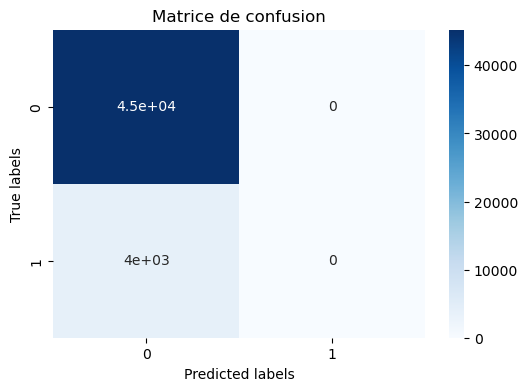

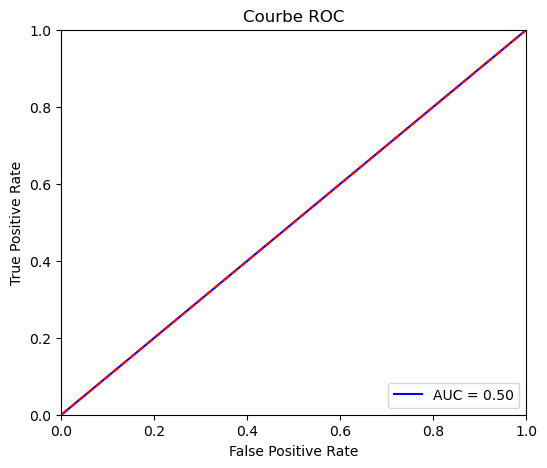

Score métier :0.13
Accuracy score : 0.92
Precision score : 0.49
Recall score : 0.02
F1 score : 0.04
Fbeta score : 0.03
ROC AUC score : 0.51


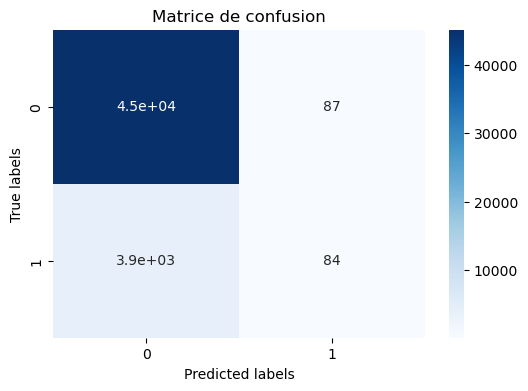

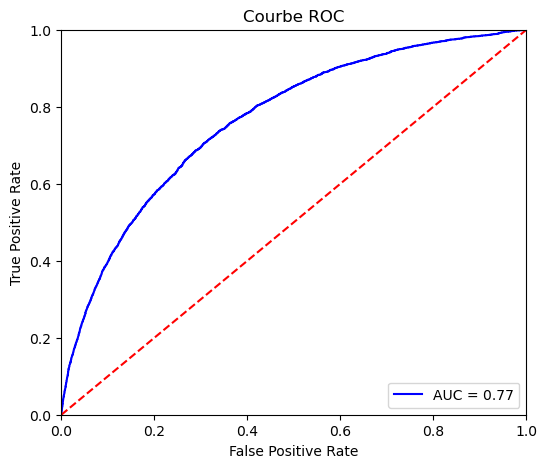

Score métier :0.40
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.69
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.70


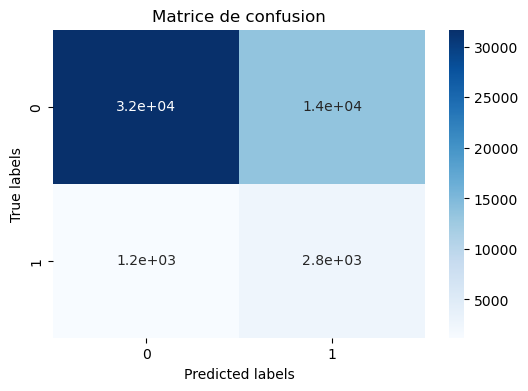

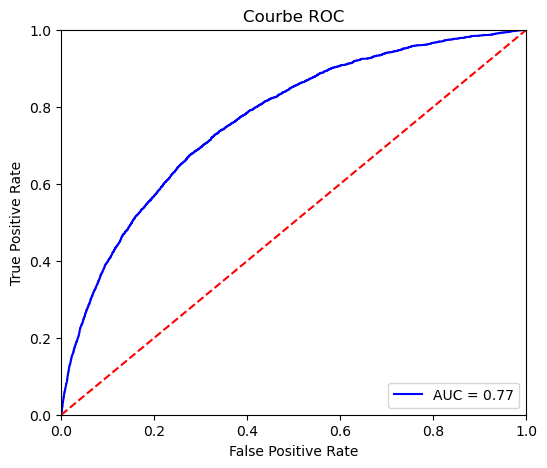

Score métier :0.39
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.69
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.69


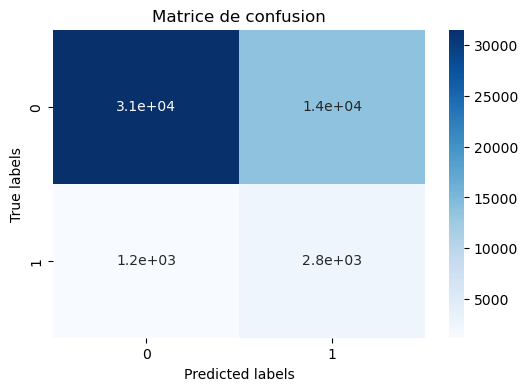

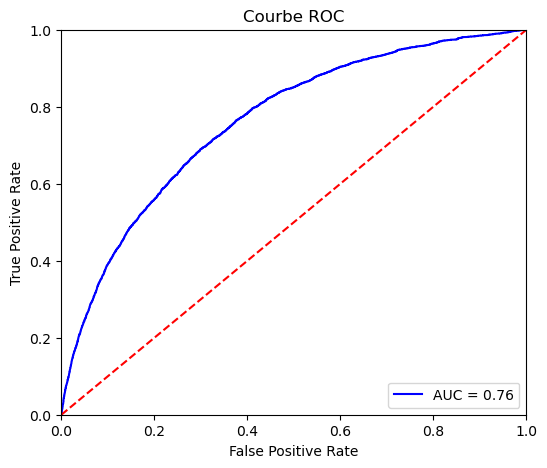

Score métier :0.13
Accuracy score : 0.92
Precision score : 0.50
Recall score : 0.02
F1 score : 0.05
Fbeta score : 0.03
ROC AUC score : 0.51


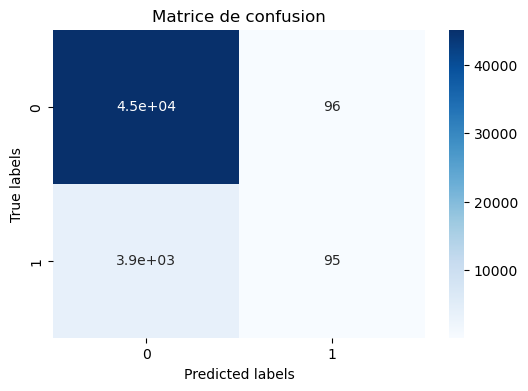

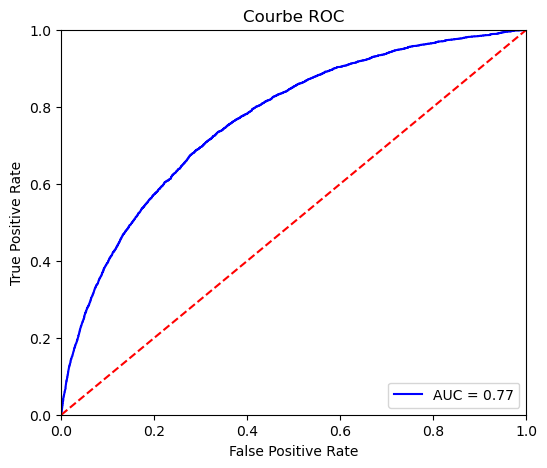

Score métier :0.38
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.65
F1 score : 0.27
Fbeta score : 0.41
ROC AUC score : 0.68


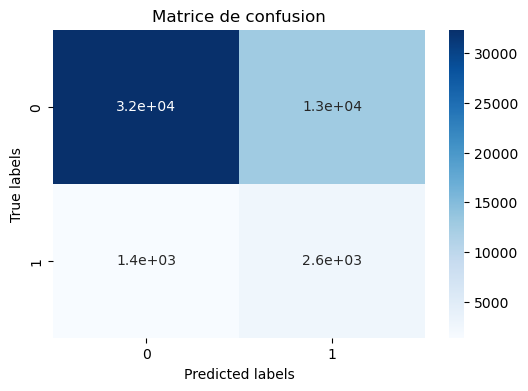

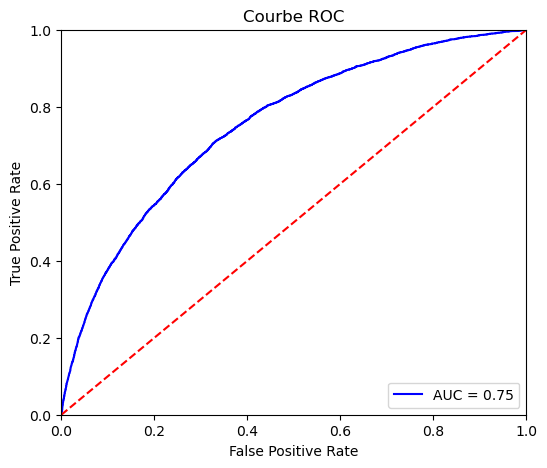

Score métier :0.35
Accuracy score : 0.84
Precision score : 0.23
Recall score : 0.44
F1 score : 0.30
Fbeta score : 0.37
ROC AUC score : 0.65


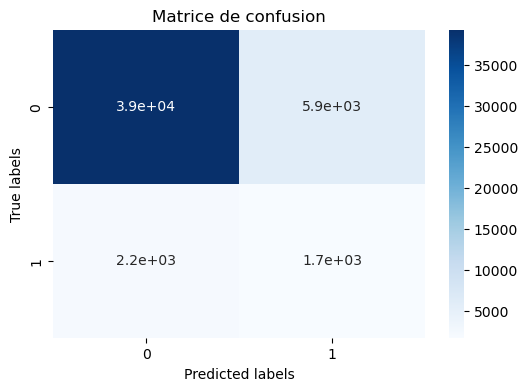

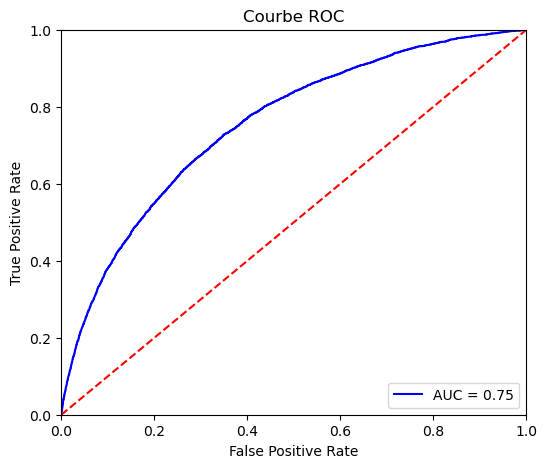

Score métier :0.38
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.66
F1 score : 0.27
Fbeta score : 0.42
ROC AUC score : 0.69


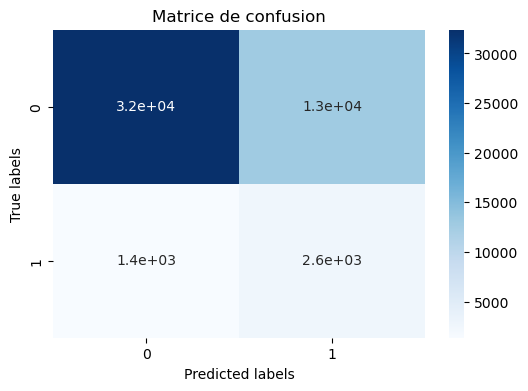

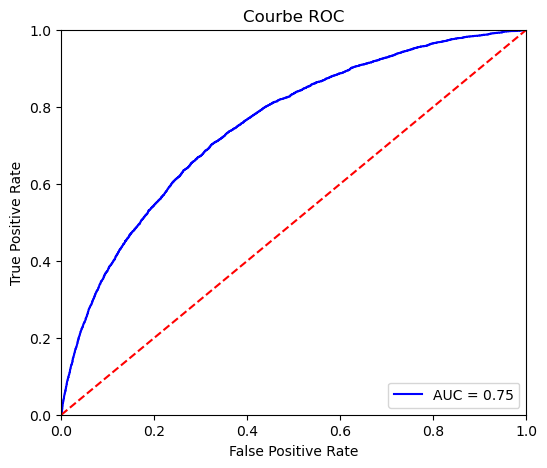

                                                       score_metier  accuracy  precision    recall  f1_score  fbeta_score    rocauc
Dummy Classifier sans équilibrage                          0.111969  0.919270   0.000000  0.000000  0.000000     0.000000  0.500000
LogisticRegression sans équilibrage                        0.127274  0.919209   0.491228  0.021148  0.040550     0.026154  0.509612
LogisticRegression class_weight                            0.397167  0.700148   0.169193  0.694109  0.272068     0.428332  0.697394
LogisticRegression undersampling (RandomUnderSampler)      0.392350  0.695880   0.166919  0.693353  0.269064     0.425171  0.694728
LogisticRegression undersampling (TomekLinks)              0.129327  0.919250   0.497382  0.023917  0.045640     0.029542  0.510897
LogisticRegression upsampling (SMOTE)                      0.378427  0.710860   0.168069  0.653575  0.267381     0.414247  0.684733
LogisticRegression combinaison                             0.345684  0.83506

In [163]:
# Création de listes pour stocker les métriques de chaque modèle
model_names = []
metier_list=[]
accuracy_list = []
precision_list = []
recall_list = []
f1_score_list = []
fbeta_score_list = []
rocauc_list = []

# Fonction pour stocker les métriques dans les listes
def store_metrics(model_name, metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc):
    model_names.append(model_name)
    metier_list.append(metier)
    accuracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)
    f1_score_list.append(f1_score)
    fbeta_score_list.append(fbeta_score)
    rocauc_list.append(rocauc)

# Terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name='Dummy Classifier'):
    dummy = DummyClassifier(random_state=0)
    dummy.fit(X_train_scaled, y_train)
    
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(dummy, X_val_scaled, y_val)
    
    store_metrics('Dummy Classifier sans équilibrage', metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run   
# LogisticRegression sans équilibrage
with mlflow.start_run(run_name='LogisticRegression sans équilibrage'):
    reg_log_inequal = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_inequal.fit(X_train_scaled, y_train)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_inequal, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression sans équilibrage', metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run

# LogisticRegression class_weight
with mlflow.start_run(run_name='LogisticRegression class_weight'):
    reg_log_balanced = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=0)
    reg_log_balanced.fit(X_train_scaled, y_train)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_balanced, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression class_weight', metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run

# LogisticRegression undersampling (RandomUnderSampler)
with mlflow.start_run(run_name='LogisticRegression undersampling (RandomUnderSampler)'):
    reg_log_under = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under.fit(X_res, y_res)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_under, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression undersampling (RandomUnderSampler)', metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run

# LogisticRegression undersampling (TomekLinks)
with mlflow.start_run(run_name='LogisticRegression undersampling (TomekLinks)'):
    reg_log_under = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_under.fit(X_train_tl, y_train_tl)
    
    metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_under, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression undersampling (TomekLinks)',metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run

# LogisticRegression upsampling (SMOTE)
with mlflow.start_run(run_name='LogisticRegression upsampling (SMOTE)'):
    reg_log_up = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_up.fit(X_train_sm, y_train_sm)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_up, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression upsampling (SMOTE)',metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()  # Fin du run
with mlflow.start_run(run_name='LogisticRegression combinaison'):
    reg_log_combi = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_combi.fit(X_train_st, y_train_st)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_combi, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression combinaison',metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)
mlflow.end_run()  # Fin du run

with mlflow.start_run(run_name='LogisticRegression combinaison_smote_random'):
    reg_log_combi = LogisticRegression(max_iter=1000, random_state=0)
    reg_log_combi.fit(X_sra, y_sra)
    
    metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(reg_log_combi, X_val_scaled, y_val)
    
    store_metrics('LogisticRegression combinaison_smote_random', metier,accuracy, precision, recall, f1_score, fbeta_score, rocauc)
mlflow.end_run()  # Fin du run




# Création du DataFrame avec les résultats réels des modèles
metrics_data = {
    'score_metier':metier_list,
    'accuracy': accuracy_list,
    'precision': precision_list,
    'recall': recall_list,
    'f1_score': f1_score_list,
    'fbeta_score': fbeta_score_list,
    'rocauc': rocauc_list
}

# Création du DataFrame
metrics_df = pd.DataFrame(metrics_data, index=model_names)

# Affichage du DataFrame
print(metrics_df)


In [164]:
metrics_df

,score_metier,accuracy,precision,recall,f1_score,fbeta_score,rocauc
Dummy Classifier sans équilibrage,0.111969,0.919270,0.000000,0.000000,0.000000,0.000000,0.500000
LogisticRegression sans équilibrage,0.127274,0.919209,0.491228,0.021148,0.040550,0.026154,0.509612
LogisticRegression class_weight,0.397167,0.700148,0.169193,0.694109,0.272068,0.428332,0.697394
LogisticRegression undersampling (RandomUnderSampler),0.392350,0.695880,0.166919,0.693353,0.269064,0.425171,0.694728
LogisticRegression undersampling (TomekLinks),0.129327,0.919250,0.497382,0.023917,0.045640,0.029542,0.510897
LogisticRegression upsampling (SMOTE),0.378427,0.710860,0.168069,0.653575,0.267381,0.414247,0.684733
LogisticRegression combinaison,0.345684,0.835064,0.228114,0.437563,0.299888,0.369677,0.653768
LogisticRegression combinaison_smote_random,0.382309,0.711449,0.169158,0.658107,0.269138,0.417026,0.687120


In [166]:
'''Choix de randomUnder Sampler'''

'Choix de randomUnder Sampler'

# Optimisation des modèles

In [167]:
# le critère d'evaluation dans gridsearchcv (permetre de maximiser le score dans la recherche du meilleur modèle)

# Logistic Regression

In [168]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [169]:
params = {'penalty':['l1', 'l2', 'elasticnet'],
          'C':[1e-5, 1e-2, 1, 10, 100],
          'solver':['newton-cg', 'lbfgs', 'liblinear']
         }
if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Grid logistic regression'):
    reg_log = LogisticRegression(max_iter=1000, random_state=0)
    grid_reg_log = GridSearchCV(
        reg_log,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    
    grid_reg_log.fit(X_res, y_res)
    # Enregistrement des meilleurs paramètres
    mlflow.log_params(grid_reg_log.best_params_)
    mlflow.end_run()   

In [170]:
result_reglogistic = pd.DataFrame(grid_reg_log.cv_results_)

In [171]:
print('Meilleurs paramètres',grid_reg_log.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_reglogistic.loc[result_reglogistic['params']==grid_reg_log.best_params_])

Meilleurs paramètres {'C': 1e-05, 'penalty': 'l2', 'solver': 'liblinear'}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
5,7.326361,0.542839,0.052406,0.013057,0.00001,l2,liblinear,"{'C': 1e-05, 'penalty': 'l2', 'solver': 'liblinear'}",-0.913394,-0.872986,-0.891113,-0.905841,-0.859265,-0.88852,0.020113,1,-0.867825,-0.896368,-0.880444,-0.877738,-0.875189,-0.879513,0.009417


Score métier :0.32
Accuracy score : 0.57
Precision score : 0.13
Recall score : 0.77
F1 score : 0.23
Fbeta score : 0.39
ROC AUC score : 0.66


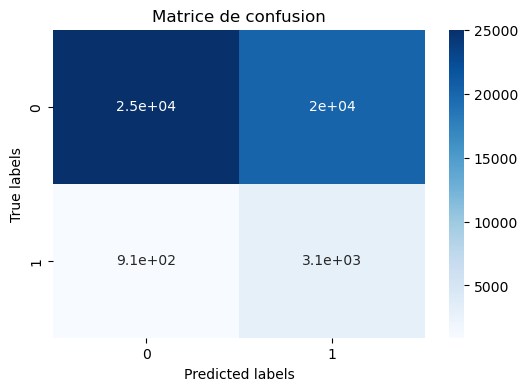

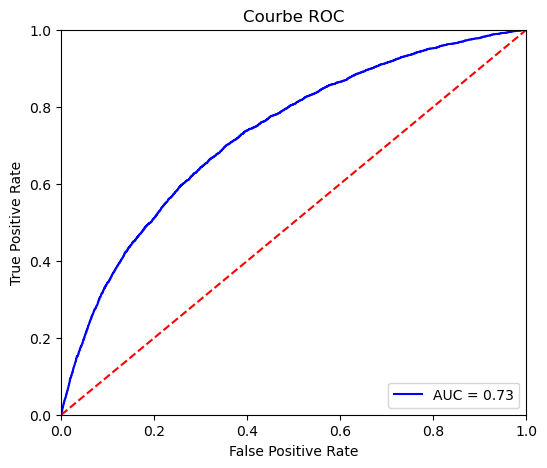

In [172]:
with mlflow.start_run(run_name='Logistic regression optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_reg_log, X_val_scaled, y_val)
   
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
   

# Arbre de decision

In [175]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [176]:
params =  {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [2, 5, 10, None]
}


if mlflow.active_run():
    mlflow.end_run()
with mlflow.start_run(run_name='Grid Decision Tree'):
    tree = DecisionTreeClassifier(random_state=0)
    grid_tree = GridSearchCV(
        tree,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    grid_tree.fit(X_res, y_res)
    mlflow.log_params(grid_tree.best_params_)
mlflow.end_run() 

In [177]:
result_tree = pd.DataFrame(grid_tree.cv_results_)

In [178]:
print('Meilleurs paramètres',grid_tree.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_tree.loc[result_tree['params']==grid_tree.best_params_])

Meilleurs paramètres {'criterion': 'entropy', 'max_depth': 5}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
5,4.989649,0.066621,0.032289,0.005885,entropy,5,"{'criterion': 'entropy', 'max_depth': 5}",-1.209089,-1.14212,-1.545695,-1.524673,-1.325403,-1.349396,0.162776,1,-1.200466,-1.085347,-1.441308,-1.504815,-1.204337,-1.287255,0.158896


Score métier :0.33
Accuracy score : 0.68
Precision score : 0.15
Recall score : 0.63
F1 score : 0.24
Fbeta score : 0.38
ROC AUC score : 0.66


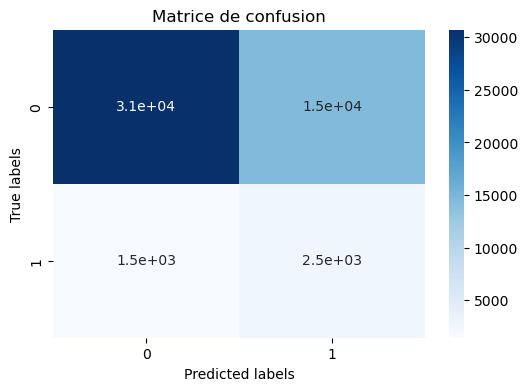

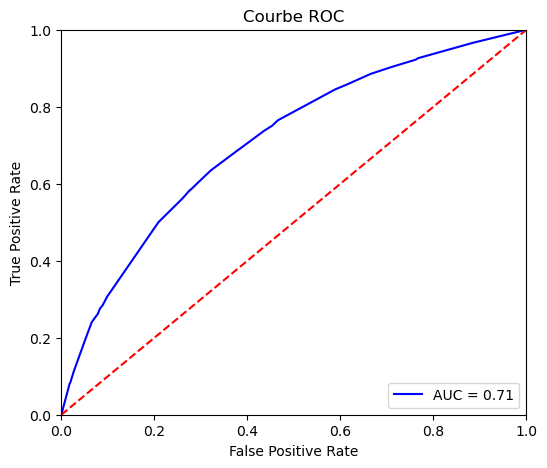

In [179]:
with mlflow.start_run(run_name='Decision Tree optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_tree, X_val_scaled, y_val)
   
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")

# Random Forest

In [180]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [181]:
params = {'n_estimators' : [100, 500, 1000, 2000],
          'max_depth': [2, 5, 10, None],
         }

with mlflow.start_run(run_name='Grid random forest'):
    rand_fo = RandomForestClassifier(random_state=0)
    grid_rand_fo = GridSearchCV(
        rand_fo,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    
    grid_rand_fo.fit(X_res, y_res)
    mlflow.log_params(grid_rand_fo.best_params_)
mlflow.end_run() 

In [182]:
result_rand_fo = pd.DataFrame(grid_rand_fo.cv_results_)
result_rand_fo.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.863953,0.143878,0.219568,0.008831,2,100,"{'max_depth': 2, 'n_estimators': 100}",-1.466516,-1.574522,-1.477467,-1.536002,-1.478097,-1.506521,0.041823,16,-1.459781,-1.507584,-1.459309,-1.511738,-1.482219,-1.484126,0.022472
1,41.355638,0.861639,0.855078,0.058611,2,500,"{'max_depth': 2, 'n_estimators': 500}",-1.421450,-1.588872,-1.470166,-1.509945,-1.456697,-1.489426,0.057225,15,-1.433661,-1.494304,-1.470890,-1.485115,-1.469757,-1.470745,0.020677
2,84.191746,1.441037,1.661336,0.047565,2,1000,"{'max_depth': 2, 'n_estimators': 1000}",-1.409491,-1.563570,-1.448263,-1.506042,-1.463369,-1.478147,0.052726,13,-1.428311,-1.477247,-1.440741,-1.472401,-1.457641,-1.455268,0.018547
3,166.679760,2.227002,3.074503,0.140620,2,2000,"{'max_depth': 2, 'n_estimators': 2000}",-1.426611,-1.582578,-1.459844,-1.499496,-1.450277,-1.483761,0.054721,14,-1.448200,-1.492038,-1.450025,-1.481716,-1.466579,-1.467711,0.017220
4,18.375513,0.969924,0.379870,0.031902,5,100,"{'max_depth': 5, 'n_estimators': 100}",-1.287387,-1.366440,-1.313192,-1.362160,-1.340886,-1.334013,0.029995,12,-1.216736,-1.251196,-1.262148,-1.252423,-1.263501,-1.249201,0.016973


In [183]:
print('Meilleurs paramètres',grid_rand_fo.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_rand_fo.loc[result_rand_fo['params']==grid_rand_fo.best_params_])

Meilleurs paramètres {'max_depth': None, 'n_estimators': 2000}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
15,538.213401,26.872386,5.033596,0.926576,None,2000,"{'max_depth': None, 'n_estimators': 2000}",-1.185801,-1.212362,-1.245468,-1.21853,-1.207326,-1.213897,0.019252,1,0.5,0.5,0.5,0.5,0.5,0.5,0.0


Score métier :0.40
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.70
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.70


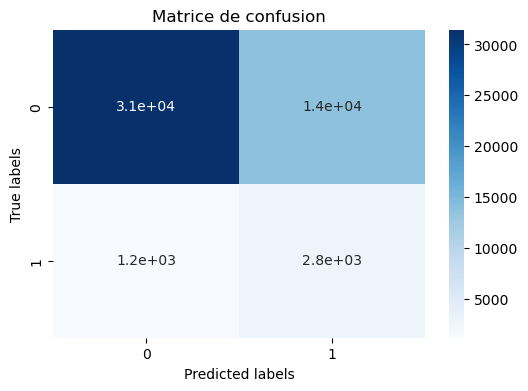

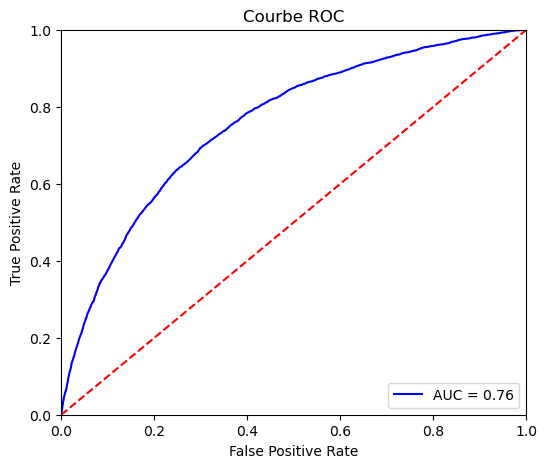

In [184]:
with mlflow.start_run(run_name='Random forest optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_rand_fo, X_val_scaled, y_val)
   
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")

# Gradient Boosting

In [185]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [186]:
params = {'gamma': [0, 0.1, 0.5, 1],
          'max_depth': [2,4,6],
          'min_child_weight' : [1,5,10],
          'n_estimators': [100, 300, 500],
         }

with mlflow.start_run(run_name='Grid XGBoost'):
    xgb = XGBClassifier(random_state=0)
    grid_xgb = GridSearchCV(
        xgb,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    
    grid_xgb.fit(X_res, y_res)
    mlflow.log_params(grid_xgb.best_params_)
mlflow.end_run() 

In [187]:
result_xgb = pd.DataFrame(grid_xgb.cv_results_)
result_xgb.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gamma,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.046427,0.570753,0.101143,0.007844,0.0,2,1,100,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 100}",-1.165534,-1.122608,-1.196123,-1.181143,-1.193857,-1.171853,0.026924,46,-1.061273,-1.055639,-1.050227,-1.065553,-1.054066,-1.057351,0.005424
1,23.763327,0.650747,0.117731,0.002247,0.0,2,1,300,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 300}",-1.113797,-1.102216,-1.195242,-1.177492,-1.126636,-1.143077,0.036614,16,-0.904960,-0.906596,-0.902442,-0.912796,-0.885763,-0.902511,0.009044
2,34.411218,1.019420,0.146128,0.004663,0.0,2,1,500,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 500}",-1.158610,-1.083711,-1.202669,-1.192472,-1.129280,-1.153348,0.043404,31,-0.809636,-0.810108,-0.804097,-0.807024,-0.795978,-0.805369,0.005162
3,8.763971,0.100587,0.097681,0.004192,0.0,2,5,100,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 5, 'n_estimators': 100}",-1.146400,-1.111279,-1.190332,-1.172583,-1.184038,-1.160926,0.029019,37,-1.062720,-1.043492,-1.047992,-1.064986,-1.065804,-1.056999,0.009355
4,21.411545,0.237438,0.119112,0.002170,0.0,2,5,300,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 5, 'n_estimators': 300}",-1.148540,-1.057528,-1.196878,-1.155086,-1.125252,-1.136657,0.045823,1,-0.913488,-0.902348,-0.907698,-0.905432,-0.904865,-0.906766,0.003767


In [188]:
print('Meilleurs paramètres',grid_xgb.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_xgb.loc[result_xgb['params']==grid_xgb.best_params_])

Meilleurs paramètres {'gamma': 0, 'max_depth': 2, 'min_child_weight': 5, 'n_estimators': 300}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gamma,param_max_depth,param_min_child_weight,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
4,21.411545,0.237438,0.119112,0.00217,0.0,2,5,300,"{'gamma': 0, 'max_depth': 2, 'min_child_weight': 5, 'n_estimators': 300}",-1.14854,-1.057528,-1.196878,-1.155086,-1.125252,-1.136657,0.045823,1,-0.913488,-0.902348,-0.907698,-0.905432,-0.904865,-0.906766,0.003767


Score métier :0.41
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


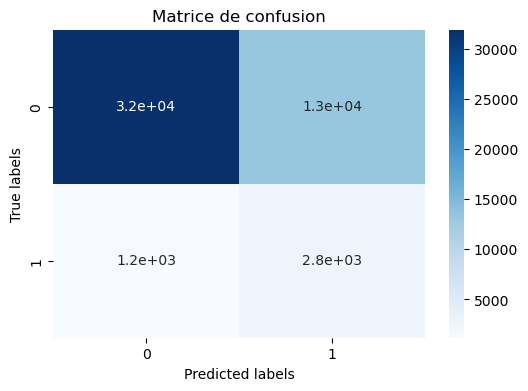

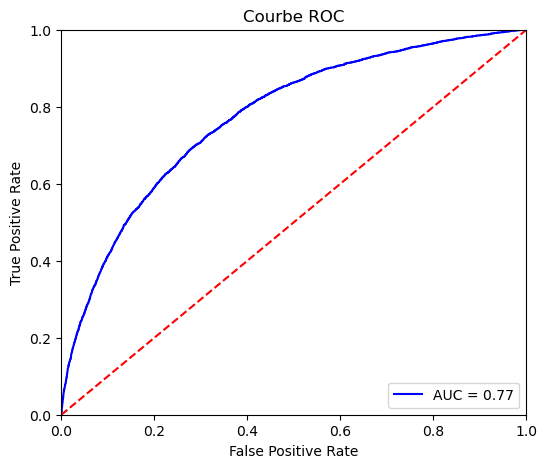

In [189]:
with mlflow.start_run(run_name='XGBoost optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_xgb, X_val_scaled, y_val)
   
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")

# Light gbm

In [265]:
score_metier = metrics.make_scorer(fonction_metier, greater_is_better=True)

In [ ]:
params = {'n_estimators' : [100, 300, 500],
          'max_depth': [-1, 2, 5],
          'num_leaves': [15, 31, 63]
         }

with mlflow.start_run(run_name='Grid Light GBM'):
    lgbm = LGBMClassifier(random_state=0)
    grid_lgbm = GridSearchCV(
        lgbm,
        param_grid=params,
        cv=5,
        scoring=score_metier,
        return_train_score = True,
        n_jobs = -1)
    
    grid_lgbm.fit(X_res, y_res)
    mlflow.log_params(grid_lgbm.best_params_)
mlflow.end_run() 

In [ ]:
result_lgbm = pd.DataFrame(grid_lgbm.cv_results_)
result_lgbm.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,17.126733,1.627885,0.027522,0.007128,-1,100,15,"{'max_depth': -1, 'n_estimators': 100, 'num_leaves': 15}",-1.116188,-1.108887,-1.184542,-1.136959,-1.127140,-1.134743,0.026666,11,-0.918807,-0.913803,-0.922583,-0.920852,-0.915030,-0.918215,0.003346
1,26.567055,0.728205,0.037543,0.006815,-1,100,31,"{'max_depth': -1, 'n_estimators': 100, 'num_leaves': 31}",-1.134189,-1.101838,-1.173968,-1.146022,-1.136707,-1.138545,0.023154,14,-0.688633,-0.688004,-0.686745,-0.692630,-0.673590,-0.685920,0.006472
2,43.459646,0.179173,0.033726,0.008471,-1,100,63,"{'max_depth': -1, 'n_estimators': 100, 'num_leaves': 63}",-1.143756,-1.087236,-1.180388,-1.180136,-1.105866,-1.139476,0.037958,15,-0.311430,-0.319109,-0.299471,-0.302807,-0.297426,-0.306049,0.008095
3,28.543345,2.322750,0.041118,0.002670,-1,300,15,"{'max_depth': -1, 'n_estimators': 300, 'num_leaves': 15}",-1.124622,-1.099068,-1.194738,-1.139099,-1.114678,-1.134441,0.032850,10,-0.590729,-0.581823,-0.578739,-0.573578,-0.597621,-0.584498,0.008609
4,48.159299,3.706408,0.038792,0.003933,-1,300,31,"{'max_depth': -1, 'n_estimators': 300, 'num_leaves': 31}",-1.164275,-1.116692,-1.200529,-1.179884,-1.169814,-1.166239,0.027689,23,-0.098439,-0.119619,-0.122482,-0.103411,-0.136518,-0.116094,0.013733


In [ ]:
print('Meilleurs paramètres',grid_lgbm.best_params_)
print("Résultats des meilleurs paramètres :\n")
display(result_lgbm.loc[result_lgbm['params']==grid_lgbm.best_params_])

Meilleurs paramètres {'max_depth': 5, 'n_estimators': 300, 'num_leaves': 15}
Résultats des meilleurs paramètres :



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,param_num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
21,21.14641,1.554062,0.041004,0.003867,5,300,15,"{'max_depth': 5, 'n_estimators': 300, 'num_leaves': 15}",-1.10423,-1.079179,-1.134693,-1.147533,-1.145896,-1.122306,0.026582,1,-0.60017,-0.624308,-0.603789,-0.621381,-0.626699,-0.615269,0.011041


Score métier :0.41
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.71
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.71


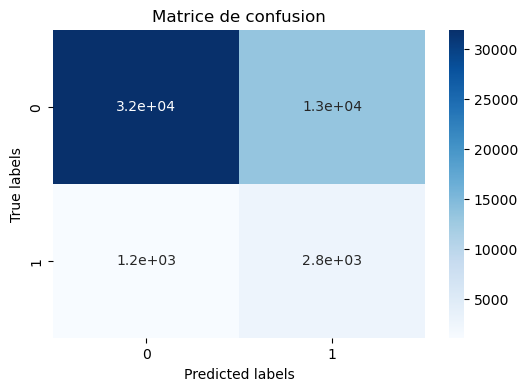

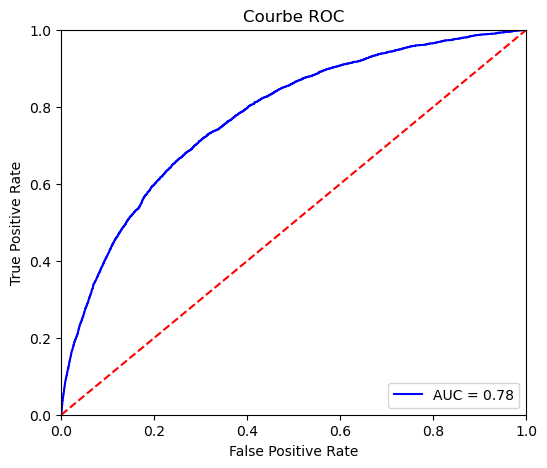

In [ ]:
with mlflow.start_run(run_name='Light GBM optimise'):
    # Calcul et enregistrement des metriques sur les données de validation
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba =\
    eval_score(grid_lgbm, X_val_scaled, y_val)
   
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    mlflow.log_params(grid_reg_log.best_params_)

Score métier :0.32
Accuracy score : 0.57
Precision score : 0.13
Recall score : 0.77
F1 score : 0.23
Fbeta score : 0.39
ROC AUC score : 0.66


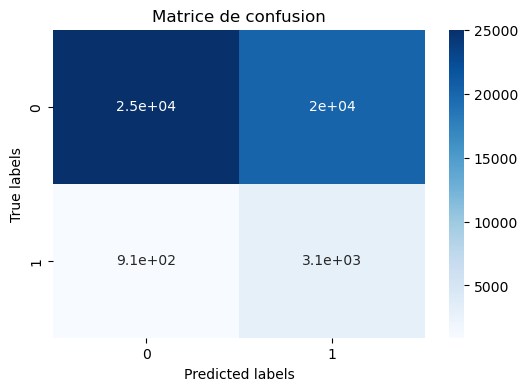

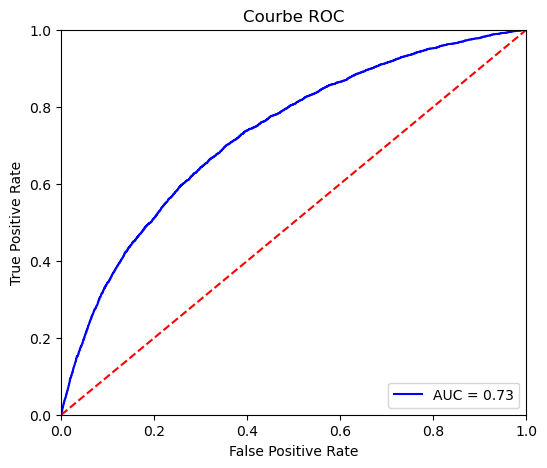

Score métier :0.33
Accuracy score : 0.68
Precision score : 0.15
Recall score : 0.63
F1 score : 0.24
Fbeta score : 0.38
ROC AUC score : 0.66


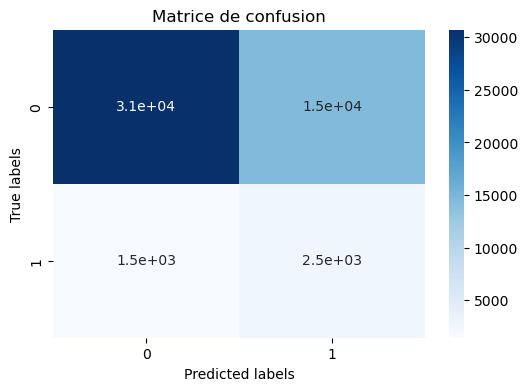

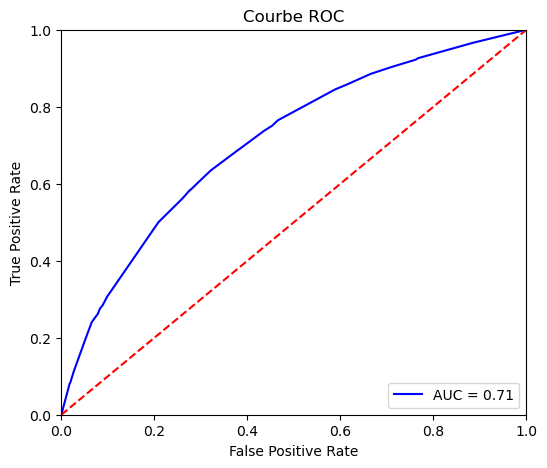

Score métier :0.40
Accuracy score : 0.70
Precision score : 0.17
Recall score : 0.70
F1 score : 0.27
Fbeta score : 0.43
ROC AUC score : 0.70


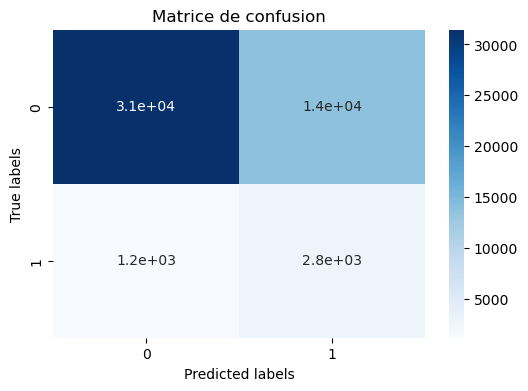

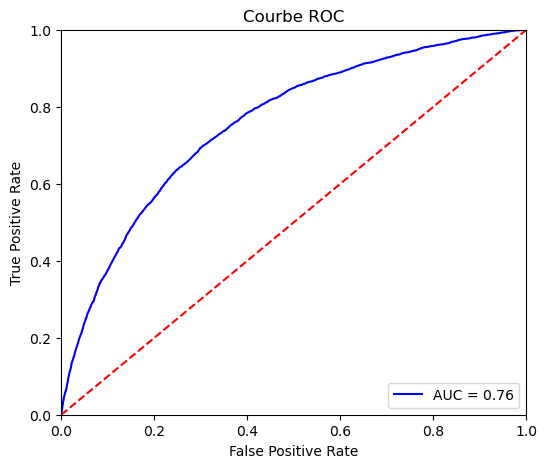

Score métier :0.41
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.70
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.70


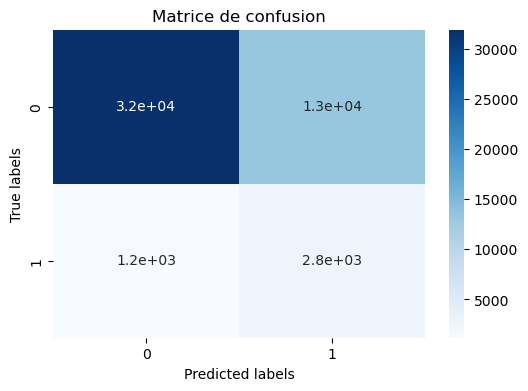

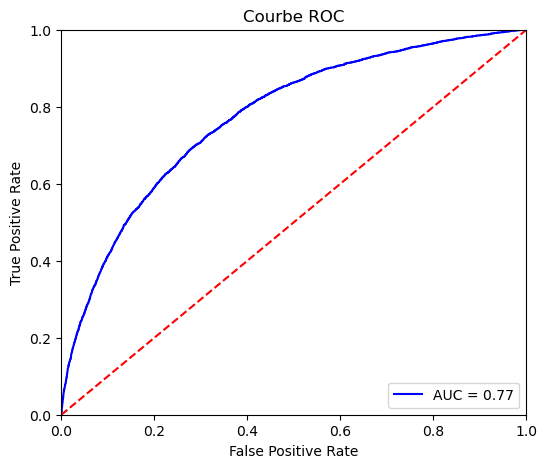

Score métier :0.41
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.71
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.71


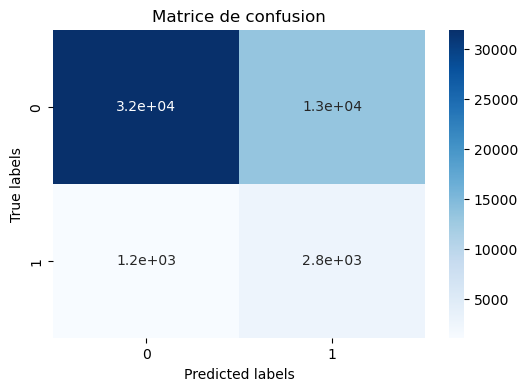

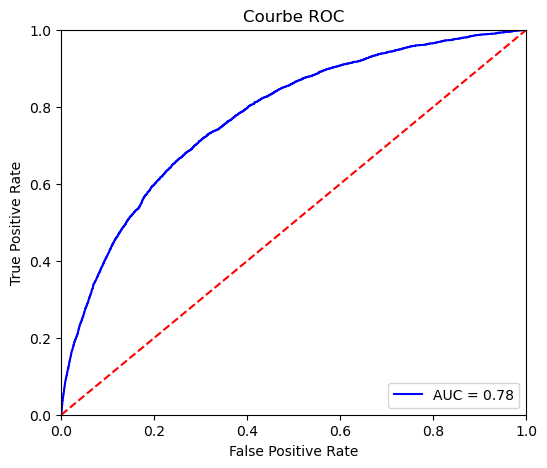

                              score_metier  accuracy  precision    recall  f1_score  fbeta_score    rocauc
Logistic regression optimisé      0.324506  0.570964   0.131763  0.771903  0.225102     0.391501  0.662610
Decision Tree optimisé            0.328916  0.675251   0.147835  0.634441  0.239794     0.382583  0.656638
Random Forest optimisé            0.396171  0.695494   0.167653  0.699144  0.270452     0.427863  0.697159
XGBoost optimisé                  0.409951  0.705982   0.173775  0.703676  0.278720     0.437101  0.704930
LightGBM optimisé                 0.412796  0.705169   0.174152  0.708711  0.279599     0.439130  0.706784


In [ ]:
# Initialisation des listes pour stocker les métriques de chaque modèle
model_names = []
metier_list = []
accuracy_list = []
precision_list = []
recall_list = []
f1_score_list = []
fbeta_score_list = []
rocauc_list = []

# Fonction pour stocker les métriques dans les listes
def store_metrics(model_name, metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc):
    model_names.append(model_name)
    metier_list.append(metier)
    accuracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)
    f1_score_list.append(f1_score)
    fbeta_score_list.append(fbeta_score)
    rocauc_list.append(rocauc)

# Assurez-vous de terminer tout run actif avant d'en commencer un nouveau
if mlflow.active_run():
    mlflow.end_run()

# Logistic Regression avec les meilleurs paramètres
with mlflow.start_run(run_name='Logistic regression optimisé'):
    best_log_reg = grid_reg_log.best_estimator_
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(best_log_reg, X_val_scaled, y_val)
    
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    store_metrics('Logistic regression optimisé', score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()

# Decision Tree avec les meilleurs paramètres
with mlflow.start_run(run_name='Decision Tree optimisé'):
    best_tree = grid_tree.best_estimator_
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(best_tree, X_val_scaled, y_val)
    
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    store_metrics('Decision Tree optimisé', score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()

# Random Forest avec les meilleurs paramètres
with mlflow.start_run(run_name='Random Forest optimisé'):
    best_rand_forest = grid_rand_fo.best_estimator_
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(best_rand_forest, X_val_scaled, y_val)
    
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    store_metrics('Random Forest optimisé', score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()

# XGBoost avec les meilleurs paramètres
with mlflow.start_run(run_name='XGBoost optimisé'):
    best_xgb = grid_xgb.best_estimator_
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(best_xgb, X_val_scaled, y_val)
    
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    store_metrics('XGBoost optimisé', score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()

# LightGBM avec les meilleurs paramètres
with mlflow.start_run(run_name='LightGBM optimisé'):
    best_lgbm = grid_lgbm.best_estimator_
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = eval_score(best_lgbm, X_val_scaled, y_val)
    
    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
   
    mlflow.log_params(grid_reg_log.best_params_)
    store_metrics('LightGBM optimisé', score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc)

mlflow.end_run()

# Création du DataFrame avec les résultats des meilleurs modèles
metrics_data = {
    'score_metier': metier_list,
    'accuracy': accuracy_list,
    'precision': precision_list,
    'recall': recall_list,
    'f1_score': f1_score_list,
    'fbeta_score': fbeta_score_list,
    'rocauc': rocauc_list
}

# Création du DataFrame
metrics_df = pd.DataFrame(metrics_data, index=model_names)

# Affichage du DataFrame
print(metrics_df)


In [ ]:
list(train_df_fin.columns)

['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_1

In [204]:
len(list(train_df_fin.columns))

469

In [205]:
X_train

array([[0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        4.36557915e+05, 2.90250000e+01, 2.13030000e+04],
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.68103925e+05, 7.64640000e+02, 6.61200000e+03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.02511690e+05, 5.21100000e+02, 2.66350000e+04],
       ...,
       [1.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        3.79156770e+05, 4.31239500e+03, 1.77750000e+04],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.51993170e+05, 7.45785000e+03, 4.82000000e+03],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.82488855e+05, 2.07000000e+00, 1.28427000e+05]])

In [208]:
len(X_train[0])

469

In [209]:
len(X_val[0])

469

In [210]:
len(X_val_scaled[0])

469

In [211]:
cols = ['CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_CONTRACT_TYPE_Cash loans',
 'NAME_CONTRACT_TYPE_Revolving loans',
 'NAME_TYPE_SUITE_Children',
 'NAME_TYPE_SUITE_Family',
 'NAME_TYPE_SUITE_Group of people',
 'NAME_TYPE_SUITE_Other_A',
 'NAME_TYPE_SUITE_Other_B',
 'NAME_TYPE_SUITE_Spouse, partner',
 'NAME_TYPE_SUITE_Unaccompanied',
 'NAME_INCOME_TYPE_Businessman',
 'NAME_INCOME_TYPE_Commercial associate',
 'NAME_INCOME_TYPE_Maternity leave',
 'NAME_INCOME_TYPE_Pensioner',
 'NAME_INCOME_TYPE_State servant',
 'NAME_INCOME_TYPE_Student',
 'NAME_INCOME_TYPE_Unemployed',
 'NAME_INCOME_TYPE_Working',
 'NAME_EDUCATION_TYPE_Academic degree',
 'NAME_EDUCATION_TYPE_Higher education',
 'NAME_EDUCATION_TYPE_Incomplete higher',
 'NAME_EDUCATION_TYPE_Lower secondary',
 'NAME_EDUCATION_TYPE_Secondary / secondary special',
 'NAME_FAMILY_STATUS_Civil marriage',
 'NAME_FAMILY_STATUS_Married',
 'NAME_FAMILY_STATUS_Separated',
 'NAME_FAMILY_STATUS_Single / not married',
 'NAME_FAMILY_STATUS_Unknown',
 'NAME_FAMILY_STATUS_Widow',
 'NAME_HOUSING_TYPE_Co-op apartment',
 'NAME_HOUSING_TYPE_House / apartment',
 'NAME_HOUSING_TYPE_Municipal apartment',
 'NAME_HOUSING_TYPE_Office apartment',
 'NAME_HOUSING_TYPE_Rented apartment',
 'NAME_HOUSING_TYPE_With parents',
 'OCCUPATION_TYPE_Accountants',
 'OCCUPATION_TYPE_Cleaning staff',
 'OCCUPATION_TYPE_Cooking staff',
 'OCCUPATION_TYPE_Core staff',
 'OCCUPATION_TYPE_Drivers',
 'OCCUPATION_TYPE_HR staff',
 'OCCUPATION_TYPE_High skill tech staff',
 'OCCUPATION_TYPE_IT staff',
 'OCCUPATION_TYPE_Laborers',
 'OCCUPATION_TYPE_Low-skill Laborers',
 'OCCUPATION_TYPE_Managers',
 'OCCUPATION_TYPE_Medicine staff',
 'OCCUPATION_TYPE_Private service staff',
 'OCCUPATION_TYPE_Realty agents',
 'OCCUPATION_TYPE_Sales staff',
 'OCCUPATION_TYPE_Secretaries',
 'OCCUPATION_TYPE_Security staff',
 'OCCUPATION_TYPE_Waiters/barmen staff',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'WEEKDAY_APPR_PROCESS_START_MONDAY',
 'WEEKDAY_APPR_PROCESS_START_SATURDAY',
 'WEEKDAY_APPR_PROCESS_START_SUNDAY',
 'WEEKDAY_APPR_PROCESS_START_THURSDAY',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'ORGANIZATION_TYPE_Advertising',
 'ORGANIZATION_TYPE_Agriculture',
 'ORGANIZATION_TYPE_Bank',
 'ORGANIZATION_TYPE_Business Entity Type 1',
 'ORGANIZATION_TYPE_Business Entity Type 2',
 'ORGANIZATION_TYPE_Business Entity Type 3',
 'ORGANIZATION_TYPE_Cleaning',
 'ORGANIZATION_TYPE_Construction',
 'ORGANIZATION_TYPE_Culture',
 'ORGANIZATION_TYPE_Electricity',
 'ORGANIZATION_TYPE_Emergency',
 'ORGANIZATION_TYPE_Government',
 'ORGANIZATION_TYPE_Hotel',
 'ORGANIZATION_TYPE_Housing',
 'ORGANIZATION_TYPE_Industry: type 1',
 'ORGANIZATION_TYPE_Industry: type 10',
 'ORGANIZATION_TYPE_Industry: type 11',
 'ORGANIZATION_TYPE_Industry: type 12',
 'ORGANIZATION_TYPE_Industry: type 13',
 'ORGANIZATION_TYPE_Industry: type 2',
 'ORGANIZATION_TYPE_Industry: type 3',
 'ORGANIZATION_TYPE_Industry: type 4',
 'ORGANIZATION_TYPE_Industry: type 5',
 'ORGANIZATION_TYPE_Industry: type 6',
 'ORGANIZATION_TYPE_Industry: type 7',
 'ORGANIZATION_TYPE_Industry: type 8',
 'ORGANIZATION_TYPE_Industry: type 9',
 'ORGANIZATION_TYPE_Insurance',
 'ORGANIZATION_TYPE_Kindergarten',
 'ORGANIZATION_TYPE_Legal Services',
 'ORGANIZATION_TYPE_Medicine',
 'ORGANIZATION_TYPE_Military',
 'ORGANIZATION_TYPE_Mobile',
 'ORGANIZATION_TYPE_Other',
 'ORGANIZATION_TYPE_Police',
 'ORGANIZATION_TYPE_Postal',
 'ORGANIZATION_TYPE_Realtor',
 'ORGANIZATION_TYPE_Religion',
 'ORGANIZATION_TYPE_Restaurant',
 'ORGANIZATION_TYPE_School',
 'ORGANIZATION_TYPE_Security',
 'ORGANIZATION_TYPE_Security Ministries',
 'ORGANIZATION_TYPE_Self-employed',
 'ORGANIZATION_TYPE_Services',
 'ORGANIZATION_TYPE_Telecom',
 'ORGANIZATION_TYPE_Trade: type 1',
 'ORGANIZATION_TYPE_Trade: type 2',
 'ORGANIZATION_TYPE_Trade: type 3',
 'ORGANIZATION_TYPE_Trade: type 4',
 'ORGANIZATION_TYPE_Trade: type 5',
 'ORGANIZATION_TYPE_Trade: type 6',
 'ORGANIZATION_TYPE_Trade: type 7',
 'ORGANIZATION_TYPE_Transport: type 1',
 'ORGANIZATION_TYPE_Transport: type 2',
 'ORGANIZATION_TYPE_Transport: type 3',
 'ORGANIZATION_TYPE_Transport: type 4',
 'ORGANIZATION_TYPE_University',
 'ORGANIZATION_TYPE_XNA',
 'FONDKAPREMONT_MODE_not specified',
 'FONDKAPREMONT_MODE_org spec account',
 'FONDKAPREMONT_MODE_reg oper account',
 'FONDKAPREMONT_MODE_reg oper spec account',
 'HOUSETYPE_MODE_block of flats',
 'HOUSETYPE_MODE_specific housing',
 'HOUSETYPE_MODE_terraced house',
 'WALLSMATERIAL_MODE_Block',
 'WALLSMATERIAL_MODE_Mixed',
 'WALLSMATERIAL_MODE_Monolithic',
 'WALLSMATERIAL_MODE_Others',
 'WALLSMATERIAL_MODE_Panel',
 'WALLSMATERIAL_MODE_Stone, brick',
 'WALLSMATERIAL_MODE_Wooden',
 'EMERGENCYSTATE_MODE_No',
 'EMERGENCYSTATE_MODE_Yes',
 'INCOME_CREDIT_PERC',
 'ANNUITY_INCOME_PERC',
 'PAYMENT_RATE',
 'BURO_DAYS_CREDIT_MIN',
 'BURO_DAYS_CREDIT_MAX',
 'BURO_DAYS_CREDIT_VAR',
 'BURO_DAYS_CREDIT_ENDDATE_MIN',
 'BURO_DAYS_CREDIT_ENDDATE_MAX',
 'BURO_DAYS_CREDIT_ENDDATE_MEAN',
 'BURO_DAYS_CREDIT_UPDATE_MEAN',
 'BURO_CREDIT_DAY_OVERDUE_MAX',
 'BURO_CREDIT_DAY_OVERDUE_MEAN',
 'BURO_AMT_CREDIT_MAX_OVERDUE_MEAN',
 'BURO_AMT_CREDIT_SUM_MAX',
 'BURO_AMT_CREDIT_SUM_MEAN',
 'BURO_AMT_CREDIT_SUM_SUM',
 'BURO_AMT_CREDIT_SUM_DEBT_MAX',
 'BURO_AMT_CREDIT_SUM_DEBT_MEAN',
 'BURO_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'BURO_AMT_CREDIT_SUM_LIMIT_MEAN',
 'BURO_AMT_CREDIT_SUM_LIMIT_SUM',
 'BURO_CNT_CREDIT_PROLONG_SUM',
 'BURO_MONTHS_BALANCE_SIZE_SUM',
 'BURO_CREDIT_ACTIVE_Active_MEAN',
 'BURO_CREDIT_ACTIVE_Bad debt_MEAN',
 'BURO_CREDIT_ACTIVE_Closed_MEAN',
 'BURO_CREDIT_ACTIVE_Sold_MEAN',
 'BURO_CREDIT_ACTIVE_nan_MEAN',
 'BURO_CREDIT_CURRENCY_currency 1_MEAN',
 'BURO_CREDIT_CURRENCY_currency 2_MEAN',
 'BURO_CREDIT_CURRENCY_currency 3_MEAN',
 'BURO_CREDIT_CURRENCY_currency 4_MEAN',
 'BURO_CREDIT_CURRENCY_nan_MEAN',
 'BURO_CREDIT_TYPE_Another type of loan_MEAN',
 'BURO_CREDIT_TYPE_Car loan_MEAN',
 'BURO_CREDIT_TYPE_Cash loan (non-earmarked)_MEAN',
 'BURO_CREDIT_TYPE_Consumer credit_MEAN',
 'BURO_CREDIT_TYPE_Credit card_MEAN',
 'BURO_CREDIT_TYPE_Interbank credit_MEAN',
 'BURO_CREDIT_TYPE_Loan for business development_MEAN',
 'BURO_CREDIT_TYPE_Loan for purchase of shares (margin lending)_MEAN',
 'BURO_CREDIT_TYPE_Loan for the purchase of equipment_MEAN',
 'BURO_CREDIT_TYPE_Loan for working capital replenishment_MEAN',
 'BURO_CREDIT_TYPE_Microloan_MEAN',
 'BURO_CREDIT_TYPE_Mobile operator loan_MEAN',
 'BURO_CREDIT_TYPE_Mortgage_MEAN',
 'BURO_CREDIT_TYPE_Real estate loan_MEAN',
 'BURO_CREDIT_TYPE_Unknown type of loan_MEAN',
 'BURO_CREDIT_TYPE_nan_MEAN',
 'ACTIVE_DAYS_CREDIT_MIN',
 'ACTIVE_DAYS_CREDIT_MAX',
 'ACTIVE_DAYS_CREDIT_ENDDATE_MIN',
 'ACTIVE_DAYS_CREDIT_UPDATE_MEAN',
 'ACTIVE_AMT_CREDIT_SUM_MAX',
 'ACTIVE_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'ACTIVE_CNT_CREDIT_PROLONG_SUM',
 'ACTIVE_MONTHS_BALANCE_SIZE_SUM',
 'CLOSED_DAYS_CREDIT_MAX',
 'CLOSED_DAYS_CREDIT_VAR',
 'CLOSED_DAYS_CREDIT_ENDDATE_MIN',
 'CLOSED_DAYS_CREDIT_ENDDATE_MAX',
 'CLOSED_DAYS_CREDIT_ENDDATE_MEAN',
 'CLOSED_CREDIT_DAY_OVERDUE_MAX',
 'CLOSED_CREDIT_DAY_OVERDUE_MEAN',
 'CLOSED_AMT_CREDIT_SUM_MAX',
 'CLOSED_AMT_CREDIT_SUM_SUM',
 'CLOSED_AMT_CREDIT_SUM_DEBT_MAX',
 'CLOSED_AMT_CREDIT_SUM_DEBT_MEAN',
 'CLOSED_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'CLOSED_AMT_CREDIT_SUM_LIMIT_MEAN',
 'CLOSED_AMT_CREDIT_SUM_LIMIT_SUM',
 'CLOSED_CNT_CREDIT_PROLONG_SUM',
 'PREV_AMT_ANNUITY_MIN',
 'PREV_AMT_ANNUITY_MAX',
 'PREV_AMT_APPLICATION_MIN',
 'PREV_AMT_APPLICATION_MAX',
 'PREV_AMT_APPLICATION_MEAN',
 'PREV_APP_CREDIT_PERC_MIN',
 'PREV_APP_CREDIT_PERC_MAX',
 'PREV_APP_CREDIT_PERC_MEAN',
 'PREV_APP_CREDIT_PERC_VAR',
 'PREV_AMT_DOWN_PAYMENT_MIN',
 'PREV_AMT_DOWN_PAYMENT_MAX',
 'PREV_AMT_GOODS_PRICE_MIN',
 'PREV_HOUR_APPR_PROCESS_START_MIN',
 'PREV_HOUR_APPR_PROCESS_START_MAX',
 'PREV_RATE_DOWN_PAYMENT_MIN',
 'PREV_RATE_DOWN_PAYMENT_MAX',
 'PREV_DAYS_DECISION_MIN',
 'PREV_DAYS_DECISION_MAX',
 'PREV_DAYS_DECISION_MEAN',
 'PREV_CNT_PAYMENT_MEAN',
 'PREV_CNT_PAYMENT_SUM',
 'PREV_NAME_CONTRACT_TYPE_Cash loans_MEAN',
 'PREV_NAME_CONTRACT_TYPE_Consumer loans_MEAN',
 'PREV_NAME_CONTRACT_TYPE_Revolving loans_MEAN',
 'PREV_NAME_CONTRACT_TYPE_XNA_MEAN',
 'PREV_NAME_CONTRACT_TYPE_nan_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_MEAN',
 'PREV_WEEKDAY_APPR_PROCESS_START_nan_MEAN',
 'PREV_FLAG_LAST_APPL_PER_CONTRACT_N_MEAN',
 'PREV_FLAG_LAST_APPL_PER_CONTRACT_Y_MEAN',
 'PREV_FLAG_LAST_APPL_PER_CONTRACT_nan_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Building a house or an annex_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Business development_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Buying a garage_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Buying a home_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Buying a new car_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Buying a used car_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Car repairs_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Education_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Everyday expenses_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Furniture_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Hobby_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Journey_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Medicine_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Money for a third person_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Other_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Payments on other loans_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Repairs_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Urgent needs_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_MEAN',
 'PREV_NAME_CASH_LOAN_PURPOSE_nan_MEAN',
 'PREV_NAME_CONTRACT_STATUS_Approved_MEAN',
 'PREV_NAME_CONTRACT_STATUS_Canceled_MEAN',
 'PREV_NAME_CONTRACT_STATUS_Refused_MEAN',
 'PREV_NAME_CONTRACT_STATUS_Unused offer_MEAN',
 'PREV_NAME_CONTRACT_STATUS_nan_MEAN',
 'PREV_NAME_PAYMENT_TYPE_Cash through the bank_MEAN',
 'PREV_NAME_PAYMENT_TYPE_Cashless from the account of the employer_MEAN',
 'PREV_NAME_PAYMENT_TYPE_Non-cash from your account_MEAN',
 'PREV_NAME_PAYMENT_TYPE_XNA_MEAN',
 'PREV_NAME_PAYMENT_TYPE_nan_MEAN',
 'PREV_CODE_REJECT_REASON_HC_MEAN',
 'PREV_CODE_REJECT_REASON_LIMIT_MEAN',
 'PREV_CODE_REJECT_REASON_SCO_MEAN',
 'PREV_CODE_REJECT_REASON_SCOFR_MEAN',
 'PREV_CODE_REJECT_REASON_SYSTEM_MEAN',
 'PREV_CODE_REJECT_REASON_VERIF_MEAN',
 'PREV_CODE_REJECT_REASON_XAP_MEAN',
 'PREV_CODE_REJECT_REASON_XNA_MEAN',
 'PREV_CODE_REJECT_REASON_nan_MEAN',
 'PREV_NAME_TYPE_SUITE_Children_MEAN',
 'PREV_NAME_TYPE_SUITE_Family_MEAN',
 'PREV_NAME_TYPE_SUITE_Group of people_MEAN',
 'PREV_NAME_TYPE_SUITE_Other_A_MEAN',
 'PREV_NAME_TYPE_SUITE_Other_B_MEAN',
 'PREV_NAME_TYPE_SUITE_Spouse, partner_MEAN',
 'PREV_NAME_TYPE_SUITE_Unaccompanied_MEAN',
 'PREV_NAME_TYPE_SUITE_nan_MEAN',
 'PREV_NAME_CLIENT_TYPE_New_MEAN',
 'PREV_NAME_CLIENT_TYPE_Refreshed_MEAN',
 'PREV_NAME_CLIENT_TYPE_Repeater_MEAN',
 'PREV_NAME_CLIENT_TYPE_XNA_MEAN',
 'PREV_NAME_CLIENT_TYPE_nan_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Additional Service_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Animals_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Audio/Video_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Auto Accessories_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Clothing and Accessories_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Computers_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Construction Materials_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Consumer Electronics_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Direct Sales_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Education_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Fitness_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Furniture_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Gardening_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Homewares_MEAN',
 'PREV_NAME_GOODS_CATEGORY_House Construction_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Insurance_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Jewelry_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Medical Supplies_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Medicine_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Mobile_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Office Appliances_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Other_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Photo / Cinema Equipment_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Sport and Leisure_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Tourism_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Vehicles_MEAN',
 'PREV_NAME_GOODS_CATEGORY_Weapon_MEAN',
 'PREV_NAME_GOODS_CATEGORY_nan_MEAN',
 'PREV_NAME_PORTFOLIO_Cars_MEAN',
 'PREV_NAME_PORTFOLIO_Cash_MEAN',
 'PREV_NAME_PORTFOLIO_nan_MEAN',
 'PREV_NAME_PRODUCT_TYPE_walk-in_MEAN',
 'PREV_NAME_PRODUCT_TYPE_x-sell_MEAN',
 'PREV_NAME_PRODUCT_TYPE_nan_MEAN',
 'PREV_CHANNEL_TYPE_AP+ (Cash loan)_MEAN',
 'PREV_CHANNEL_TYPE_Channel of corporate sales_MEAN',
 'PREV_CHANNEL_TYPE_Contact center_MEAN',
 'PREV_CHANNEL_TYPE_Country-wide_MEAN',
 'PREV_CHANNEL_TYPE_Credit and cash offices_MEAN',
 'PREV_CHANNEL_TYPE_Regional / Local_MEAN',
 'PREV_CHANNEL_TYPE_Stone_MEAN',
 'PREV_CHANNEL_TYPE_nan_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Auto technology_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Connectivity_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Construction_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Consumer electronics_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Industry_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Jewelry_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_MLM partners_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_Tourism_MEAN',
 'PREV_NAME_SELLER_INDUSTRY_nan_MEAN',
 'PREV_NAME_YIELD_GROUP_XNA_MEAN',
 'PREV_NAME_YIELD_GROUP_high_MEAN',
 'PREV_NAME_YIELD_GROUP_low_action_MEAN',
 'PREV_NAME_YIELD_GROUP_low_normal_MEAN',
 'PREV_NAME_YIELD_GROUP_middle_MEAN',
 'PREV_NAME_YIELD_GROUP_nan_MEAN',
 'PREV_PRODUCT_COMBINATION_Card Street_MEAN',
 'PREV_PRODUCT_COMBINATION_Card X-Sell_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash Street: high_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash Street: low_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash Street: middle_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash X-Sell: high_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash X-Sell: low_MEAN',
 'PREV_PRODUCT_COMBINATION_Cash X-Sell: middle_MEAN',
 'PREV_PRODUCT_COMBINATION_POS household with interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS household without interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS industry with interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS industry without interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS mobile without interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS other with interest_MEAN',
 'PREV_PRODUCT_COMBINATION_POS others without interest_MEAN',
 'APPROVED_AMT_APPLICATION_MAX',
 'APPROVED_AMT_APPLICATION_MEAN',
 'APPROVED_APP_CREDIT_PERC_VAR',
 'APPROVED_DAYS_DECISION_MAX',
 'APPROVED_CNT_PAYMENT_SUM',
 'POS_MONTHS_BALANCE_MAX',
 'POS_MONTHS_BALANCE_SIZE',
 'POS_SK_DPD_MAX',
 'POS_SK_DPD_DEF_MAX',
 'POS_NAME_CONTRACT_STATUS_Active_MEAN',
 'POS_NAME_CONTRACT_STATUS_Amortized debt_MEAN',
 'POS_NAME_CONTRACT_STATUS_Approved_MEAN',
 'POS_NAME_CONTRACT_STATUS_Canceled_MEAN',
 'POS_NAME_CONTRACT_STATUS_Completed_MEAN',
 'POS_NAME_CONTRACT_STATUS_Demand_MEAN',
 'POS_NAME_CONTRACT_STATUS_Returned to the store_MEAN',
 'POS_NAME_CONTRACT_STATUS_Signed_MEAN',
 'POS_NAME_CONTRACT_STATUS_XNA_MEAN',
 'POS_NAME_CONTRACT_STATUS_nan_MEAN',
 'INSTAL_NUM_INSTALMENT_VERSION_NUNIQUE',
 'INSTAL_DPD_MAX',
 'INSTAL_DPD_MEAN',
 'INSTAL_DPD_SUM',
 'INSTAL_DBD_MAX',
 'INSTAL_DBD_MEAN',
 'INSTAL_DBD_SUM',
 'INSTAL_PAYMENT_PERC_MAX',
 'INSTAL_PAYMENT_PERC_MEAN',
 'INSTAL_PAYMENT_DIFF_MAX',
 'INSTAL_PAYMENT_DIFF_MEAN',
 'INSTAL_PAYMENT_DIFF_SUM',
 'INSTAL_PAYMENT_DIFF_VAR',
 'INSTAL_AMT_INSTALMENT_MAX',
 'INSTAL_AMT_INSTALMENT_MEAN',
 'INSTAL_AMT_INSTALMENT_SUM',
 'INSTAL_AMT_PAYMENT_MIN',
 'INSTAL_DAYS_ENTRY_PAYMENT_SUM']

# SHAP

In [212]:
explainer_shap = shap.TreeExplainer(best_lgbm)

In [213]:
feature_names = cols

In [214]:
len(feature_names)

469

In [215]:
len(X_val_scaled[0])

469

In [216]:
X_val_scaled = pd.DataFrame(X_val_scaled, columns=feature_names)

Graphique SHAP global (classification à une seule sortie ou régression)


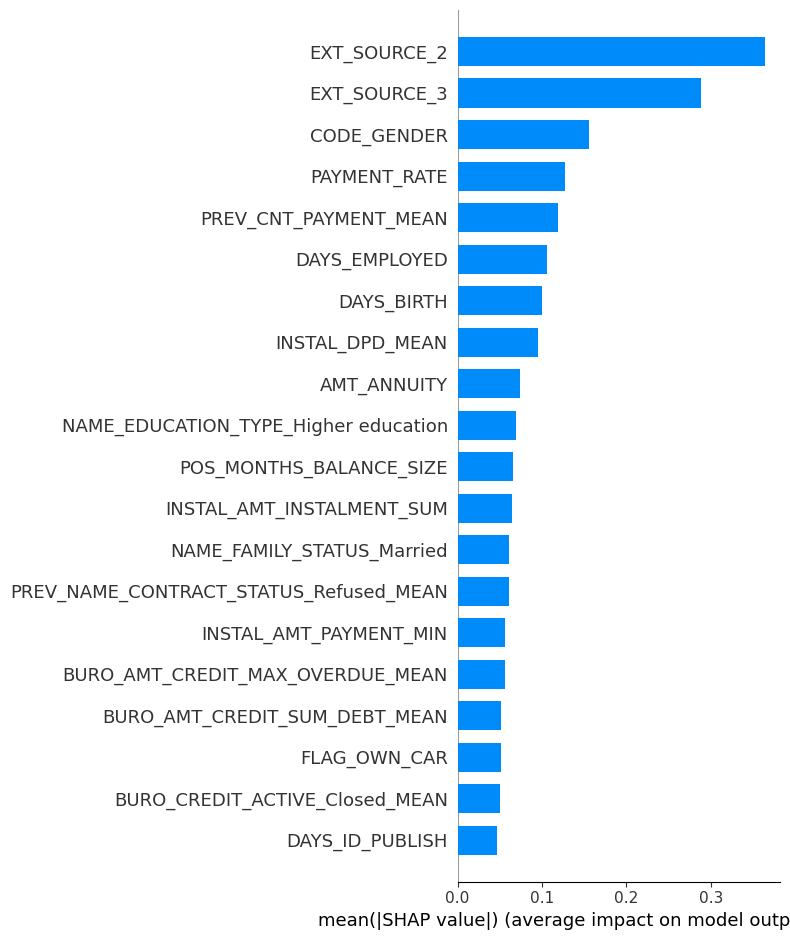

In [217]:
import shap

# Extraire les noms des features à partir de train_df
feature_names = train_df_fin.columns[2:]  # Ignorer 'SK_ID_CURR' et 'TARGET'

# Créer le DataFrame X_val_scaled avec les noms des colonnes
if not isinstance(X_val_scaled, pd.DataFrame):
    X_val_scaled = pd.DataFrame(X_val_scaled, columns=feature_names)

# Initialiser le TreeExplainer avec le meilleur modèle
explainer_shap = shap.TreeExplainer(best_lgbm)

# Calculer les valeurs SHAP
shap_values_shap = explainer_shap.shap_values(X_val_scaled)

# Vérifiez la structure des shap_values_shap
if isinstance(shap_values_shap, list):  # Classification avec plusieurs classes
    class_names = ["Classe 0 (TARGET = 0)", "Classe 1 (TARGET = 1)"]

    # Générer les graphiques SHAP pour chaque classe
    for i, class_name in enumerate(class_names):
        print(f"Graphique SHAP pour {class_name}")
        shap.summary_plot(
            shap_values_shap[i],  # Valeurs SHAP pour la classe i
            X_val_scaled,         # Données d'entrée avec noms des features
            plot_type="bar",      # Type de graphique : barres
            show=True
        )
else:  # Régression ou classification avec un seul score
    print("Graphique SHAP global (classification à une seule sortie ou régression)")
    shap.summary_plot(
        shap_values_shap,       # Valeurs SHAP globales
        X_val_scaled,           # Données d'entrée avec noms des features
        plot_type="bar",        # Type de graphique : barres
        show=True
    )


In [218]:
X_val_scaled

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZAT

In [219]:
X_val_scaled


,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZAT

In [220]:
X_train

array([[0.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        4.36557915e+05, 2.90250000e+01, 2.13030000e+04],
       [1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        2.68103925e+05, 7.64640000e+02, 6.61200000e+03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.02511690e+05, 5.21100000e+02, 2.66350000e+04],
       ...,
       [1.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        3.79156770e+05, 4.31239500e+03, 1.77750000e+04],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.51993170e+05, 7.45785000e+03, 4.82000000e+03],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.82488855e+05, 2.07000000e+00, 1.28427000e+05]])

In [221]:
X_train.shape[1]

469

In [224]:
X_val

array([[1.00000000e+00, 0.00000000e+00, 1.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        8.95539600e+04, 1.11942450e+04, 9.84000000e+02],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.74720591e+06, 2.41650000e+01, 7.17940000e+04],
       ...,
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.36263525e+05, 3.15900000e+01, 1.74800000e+04],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.92352824e+06, 3.84300000e+01, 5.20600000e+03],
       [1.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        9.21185550e+05, 5.24650500e+03, 3.57000000e+03]])

In [225]:
X_val_scaled

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZAT

[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33636
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 405
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

Score métier :0.41
Accuracy score : 0.71
Precision score : 0.17
Recall score : 0.71
F1 score : 0.28
Fbeta score : 0.44
ROC AUC score : 0.71


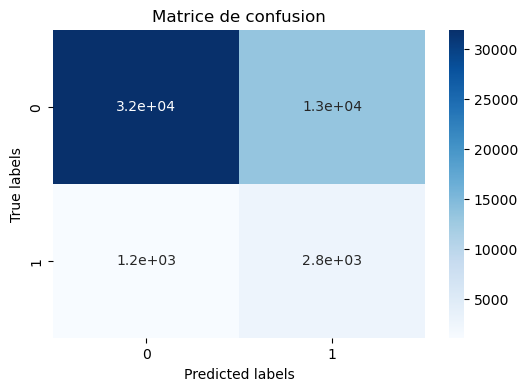

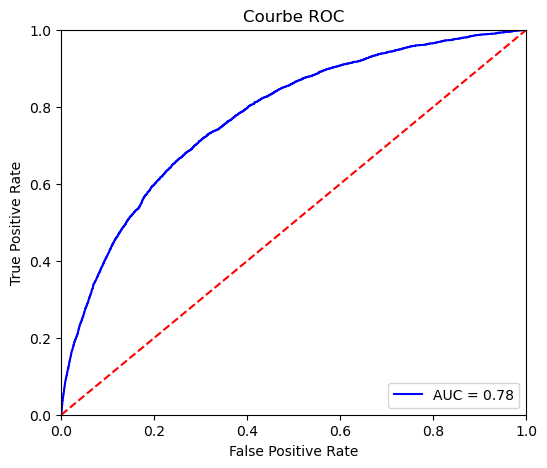

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import RandomUnderSampler
from lightgbm import LGBMClassifier
import mlflow
from imblearn.pipeline import Pipeline

# Appliquer l'échantillonnage avant d'entrer dans le pipeline
sampler = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = sampler.fit_resample(X_train_scaled, y_train)


# Préprocesseur avec StandardScaler uniquement sur les colonnes de type float
preprocessor = ColumnTransformer([('quanti', StandardScaler(), float_indices)], remainder='passthrough')

# Pipeline de modélisation
pipe = Pipeline(steps=[
    #['scaler', preprocessor],
    ['classifier', LGBMClassifier(
                                  max_depth=5,
                                  n_estimators=300,
                                  num_leaves=15,
                                  random_state=42)]
])#max_depth': 5, 'n_estimators': 300, 'num_leaves': 15

# Enregistrement automatique avec MLflow
mlflow.lightgbm.autolog(log_input_examples=True, silent=True)
with mlflow.start_run(run_name='pip final'):
    # Entraînement du modèle avec les données échantillonnées
    pipe.fit(X_resampled, y_resampled)

    # Calcul et enregistrement des métriques
    score_metier, accuracy, precision, recall, f1_score, fbeta_score, rocauc, y_pred_proba = \
        eval_score(pipe, X_val_scaled, y_val, seuil=0.5)

    mlflow.log_metric("val_score_métier", score_metier)
    mlflow.log_metric("val_accuracy", accuracy)
    mlflow.log_metric("val_precision", precision)
    mlflow.log_metric("val_recall", recall)
    mlflow.log_metric("val_f1_score", f1_score)
    mlflow.log_metric("val_fbeta_score", fbeta_score)
    mlflow.log_metric("val_rocauc", rocauc)
    mlflow.log_artifact("roc_curve.png")
    mlflow.log_artifact("conf_mat.png")
    mlflow.log_params(grid_reg_log.best_params_)
# integrer la courbe ROC dans mlflow

In [ ]:
from mlflow.models.signature import infer_signature

In [ ]:
signature = infer_signature(X_train, y_train)
mlflow.sklearn.save_model(pipe, 'mlflow_model', signature=signature)

In [231]:
pipe

Pipeline(steps=[['classifier',
                 LGBMClassifier(max_depth=5, n_estimators=300, num_leaves=15,
                                random_state=42)]])

# Shap



SHAP (SHapley Additive exPlanations) est une approche théorique et pratique pour expliquer les prédictions des modèles d'apprentissage automatique. L'objectif de SHAP est de fournir des explications interprétables pour les prédictions de modèles . Il permet de comprendre comment chaque feature contribue à la prédiction finale, en attribuant des valeurs d'importance à chacune.

SHAP permet de fournir à la fois des explications globales, qui s'appliquent à l'ensemble du modèle, et des explications locales, qui sont spécifiques à une prédiction individuelle.

In [232]:
import shap
explainer_pipe = shap.TreeExplainer(pipe['classifier'])
shap_values_pipe = explainer_pipe.shap_values(X_val_scaled)

In [233]:
pipe['classifier']

LGBMClassifier(max_depth=5, n_estimators=300, num_leaves=15, random_state=42)

In [234]:
shap_values_pipe

array([[-0.07784431,  0.04238895, -0.00051062, ...,  0.12017247,
         0.01024358,  0.03456141],
       [-0.15427778,  0.03040135,  0.00030613, ...,  0.10755434,
        -0.09086503,  0.03405025],
       [-0.13235558,  0.03854527,  0.00015757, ..., -0.05664968,
         0.07626363, -0.02950113],
       ...,
       [-0.12906683,  0.03286076,  0.00015757, ..., -0.06737477,
         0.10285249,  0.03898531],
       [-0.13705651,  0.05024101,  0.00015757, ..., -0.09965057,
         0.11282811,  0.06175177],
       [-0.07350594, -0.04150877,  0.00016812, ..., -0.04107595,
        -0.06400825,  0.02856418]])

In [235]:
X_val_scaled

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZAT

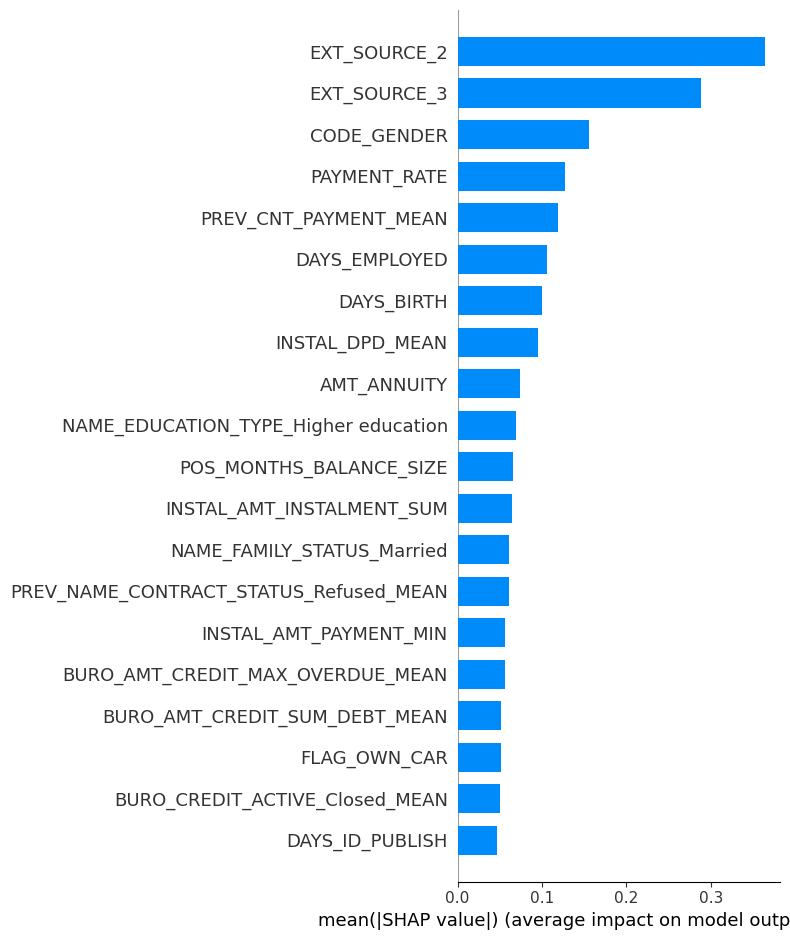

In [236]:
shap.summary_plot(shap_values_pipe, X_val_scaled, plot_type='bar')

plt.savefig("courbe_shap.png")
plt.close()  # Ferme la figure pour éviter d'afficher une image non désirée

# Enregistrement de l'artéfact dans MLflow
mlflow.log_artifact("courbe_shap.png")
    

In [237]:
shap_values_pipe[1]

array([-1.54277780e-01,  3.04013478e-02,  3.06131357e-04,  2.05010853e-04,
        5.84361123e-04,  2.01745088e-03,  1.68553173e-02,  1.16734454e-02,
       -2.08271091e-02,  1.86161717e-01, -9.32908287e-03,  3.51225491e-02,
        0.00000000e+00,  0.00000000e+00,  1.78612894e-02,  0.00000000e+00,
        6.58412626e-03,  2.56499906e-03, -1.00371484e-02, -2.11735600e-02,
       -4.87166882e-04,  1.19134834e-03,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -3.95763719e-03, -3.53320789e-05,  0.00000000e+00,
       -2.42154164e-01, -1.09904787e-01,  5.12043731e-03,  4.03185306e-04,
        7.11096012e-03,  9.43121313e-03, -1.71586741e-02,  2.49085118e-02,
        0.00000000e+00,  3.44540085e-03,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  2.92034220e-05,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  5.50018161e-04,
        0.00000000e+00,  1.47010230e-04,  1.32041546e-03,  0.00000000e+00,
        6.97081484e-04,  

In [238]:
X_val_scaled.values

array([[ 0.72092399, -0.717489  ,  1.5032816 , ..., -0.73382587,
        -0.34866348, -0.71069219],
       [ 0.72092399, -0.717489  , -0.66521136, ..., -0.63074215,
         0.44242745, -0.6930227 ],
       [ 0.72092399, -0.717489  , -0.66521136, ...,  1.27734692,
        -0.34695575,  0.57849856],
       ...,
       [ 0.72092399, -0.717489  , -0.66521136, ..., -0.2316519 ,
        -0.34643103, -0.39680727],
       [ 0.72092399, -0.717489  , -0.66521136, ...,  1.48030793,
        -0.34594765, -0.61720908],
       [ 0.72092399,  1.3937496 , -0.66521136, ...,  0.32653187,
         0.02210405, -0.64658641]])

In [239]:
X_val_scaled.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'INSTAL_PAYMENT_PERC_MEAN', 'INSTAL_PAYMENT_DIFF_MAX',
       'INSTAL_PAYMENT_DIFF_MEAN', 'INSTAL_PAYMENT_DIFF_SUM',
       'INSTAL_PAYMENT_DIFF_VAR', 'INSTAL_AMT_INSTALMENT_MAX',
       'INSTAL_AMT_INSTALMENT_MEAN', 'INSTAL_AMT_INSTALMENT_SUM',
       'INSTAL_AMT_PAYMENT_MIN', 'INSTAL_DAYS_ENTRY_PAYMENT_SUM'],
      dtype='object', length=469)

In [240]:
print(shap_values_pipe.shape)

(49201, 469)


In [241]:
print(X_val_scaled.values.shape)

(49201, 469)


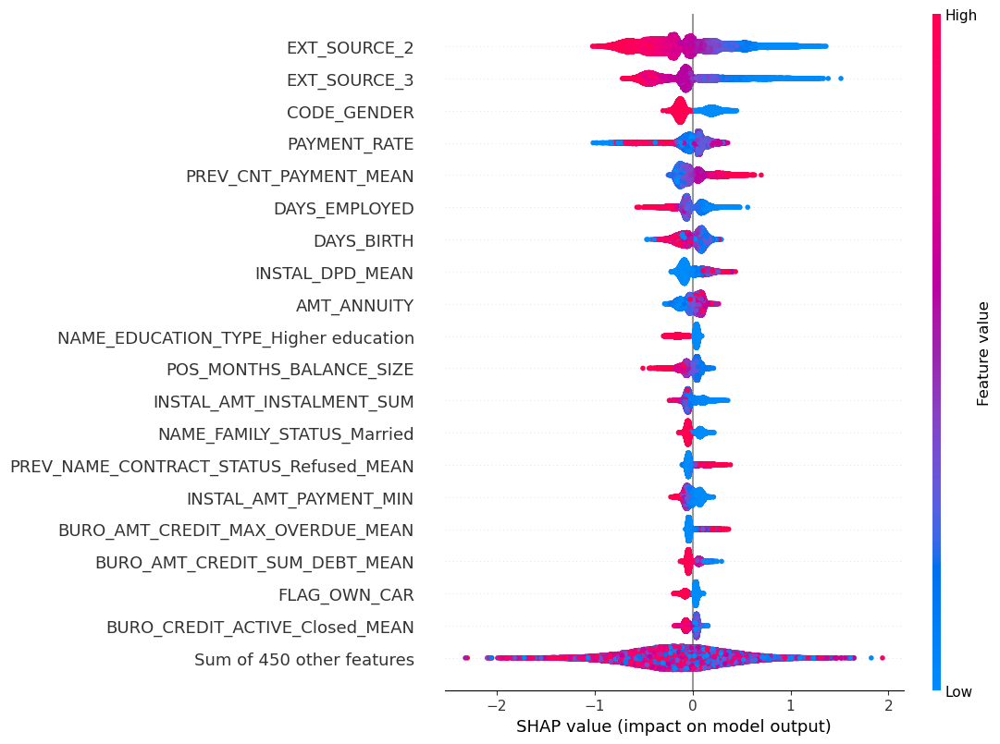

In [242]:
shap_values_exp = shap.Explanation(values=shap_values_pipe, data=X_val_scaled, feature_names=X_val_scaled.columns)

# Affichez le beeswarm plot
shap.plots.beeswarm(shap_values_exp,max_display=20)
plt.savefig("courbe_shap2.png")
plt.close()  # Ferme la figure pour éviter d'afficher une image non désirée

# Enregistrement de l'artéfact dans MLflow
mlflow.log_artifact("courbe_shap2.png")

In [243]:
print(shap_values_exp[4])

.values =
array([-1.18062095e-01,  3.24197468e-02,  1.57570142e-04, -1.76938714e-05,
        1.39882105e-02,  5.68179744e-03,  6.19866667e-02,  1.59301805e-02,
       -1.13455448e-01, -2.02329531e-01, -3.83988183e-03,  7.22029603e-03,
        0.00000000e+00,  0.00000000e+00, -3.34854363e-03,  0.00000000e+00,
        2.46516564e-03,  1.73250952e-03, -1.36299047e-03, -1.47261651e-02,
       -2.07012980e-04,  6.27383566e-04,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -7.09161949e-03, -3.53320789e-05,  0.00000000e+00,
       -3.85972916e-01,  1.03180598e+00,  6.43708546e-03,  2.27315731e-03,
       -5.28132075e-03,  3.17702404e-03, -1.61506907e-02, -3.27714708e-02,
        0.00000000e+00,  1.43034292e-02,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  2.01966829e-05,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  4.34683872e-04,
        0.00000000e+00,  1.43265539e-04,  2.64990070e-04,  0.00000000e+00,
        7.64347

In [244]:
shap_values_exp1=shap_values_exp[4].data

In [245]:
shap_values_exp1

CODE_GENDER                      0.720924
FLAG_OWN_CAR                    -0.717489
FLAG_OWN_REALTY                 -0.665211
CNT_CHILDREN                    -0.577535
AMT_INCOME_TOTAL                 0.129138
                                   ...   
INSTAL_AMT_INSTALMENT_MAX        0.550608
INSTAL_AMT_INSTALMENT_MEAN      -0.482360
INSTAL_AMT_INSTALMENT_SUM        0.182089
INSTAL_AMT_PAYMENT_MIN          -0.327598
INSTAL_DAYS_ENTRY_PAYMENT_SUM    2.911339
Name: 4, Length: 469, dtype: float64

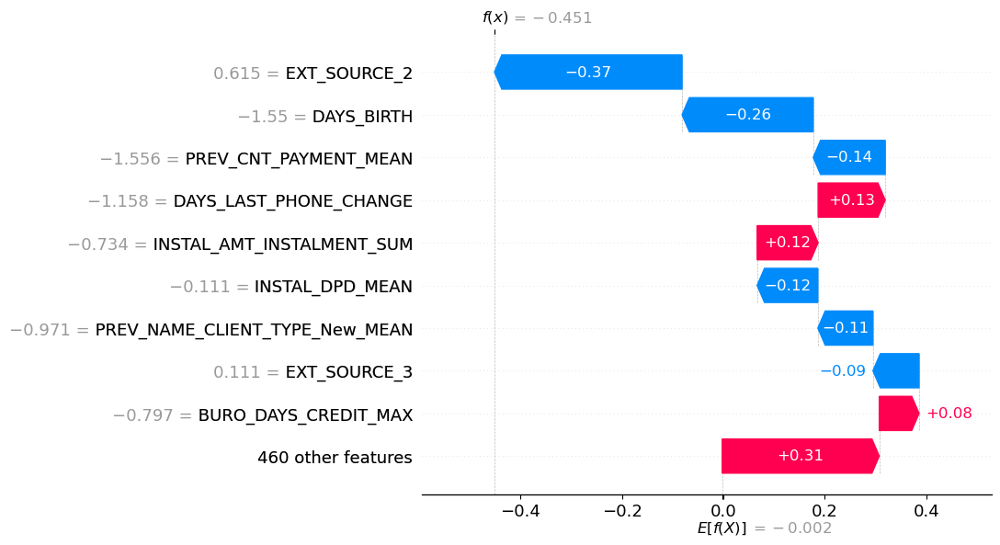

In [ ]:

shap.waterfall_plot(explainer_pipe(X_val_scaled)[0])